In [1]:
import pandas as pd
import numpy as np
from numpy import array
import matplotlib.pyplot as plt
import seaborn as sns
import os
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, r2_score, mean_squared_error
#from sklearn.preprocessing import label_binarize

import tensorflow as tf  
from keras import Sequential
from keras.layers import Dropout, Add, Dense, BatchNormalization, Flatten, Conv2D, MaxPooling2D
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import load_img
from keras.callbacks import ModelCheckpoint, EarlyStopping
import cv2
from collections import Counter


In [2]:
#used if in google colab
#drive.mount('/content/drive/')
#from google.colab import drive
#!unzip "/content/drive/MyDrive/ColabNotebooks/UTKFace.zip" -d "/content/drive/MyDrive/ColabNotebooks"

In [3]:
Age=[]
Gender=[]
Race=[]
images_data=[]
#directory='/content/drive/MyDrive/ColabNotebooks/UTKFace/'
directory='UTKFace/'
for file in os.listdir(directory):
    filename=directory+file
    X=load_img(filename, color_mode="grayscale")
    X_resized=X.resize((32, 32),resample=Image.LANCZOS)
    X_flatten=array(X_resized).flatten()
    X_flatten_reshaped = X_flatten.reshape(32,32,1).astype('float32') 
    X_flatten_reshaped_normalized=X_flatten_reshaped/255
    images_data.append(X_flatten_reshaped_normalized)
    imagfilename=file.split('_')
    Age.append(imagfilename[0])
    Gender.append(imagfilename[1])
    Race.append(imagfilename[2])

In [4]:
print(Counter(Age))
print(Counter(Gender))
print(Counter(Race))

Counter({'26': 2197, '1': 1123, '28': 918, '35': 880, '24': 859, '25': 734, '30': 724, '32': 664, '27': 615, '29': 570, '40': 526, '36': 483, '2': 482, '45': 440, '23': 426, '34': 409, '22': 395, '50': 381, '54': 353, '31': 350, '21': 346, '38': 325, '37': 293, '60': 293, '3': 289, '20': 284, '4': 273, '58': 271, '55': 268, '42': 266, '39': 265, '8': 263, '18': 262, '65': 259, '16': 247, '53': 241, '56': 236, '52': 232, '5': 196, '15': 177, '47': 170, '9': 166, '61': 159, '17': 158, '14': 157, '43': 157, '10': 156, '85': 155, '46': 153, '48': 153, '49': 148, '75': 148, '70': 147, '33': 143, '7': 139, '51': 138, '80': 133, '41': 132, '6': 131, '12': 130, '62': 125, '63': 103, '44': 100, '68': 100, '19': 98, '72': 98, '57': 97, '67': 94, '59': 82, '90': 82, '13': 81, '66': 77, '78': 69, '11': 65, '73': 63, '76': 58, '69': 56, '64': 50, '82': 40, '86': 35, '88': 34, '71': 33, '89': 33, '74': 32, '77': 28, '84': 24, '79': 23, '81': 22, '83': 18, '96': 17, '92': 13, '100': 11, '87': 10, '95

In [5]:
age=np.array(Age).astype('float32')
gender=np.array(Gender).astype('float32')
race=np.array(Race).astype('float32')
images_data=np.array(images_data)

In [6]:
images_data.shape

(23705, 32, 32, 1)

In [7]:
gender_model=Sequential()

gender_model.add(Conv2D(32, (3, 3), input_shape=(32,32,1), activation='relu', padding='same'))
gender_model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
gender_model.add(BatchNormalization())
gender_model.add(MaxPooling2D(2, 2))
gender_model.add(Dropout(0.3))

gender_model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
gender_model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
gender_model.add(BatchNormalization())
gender_model.add(MaxPooling2D(2, 2))
gender_model.add(Dropout(0.3))

gender_model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
gender_model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
gender_model.add(BatchNormalization())
gender_model.add(MaxPooling2D(2, 2))
gender_model.add(Dropout(0.3))

gender_model.add(Flatten())
gender_model.add(Dropout(0.3))
gender_model.add(Dense(64, activation='relu'))
gender_model.add(Dropout(0.3))
gender_model.add(Dense(1, activation='sigmoid'))
gender_model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

In [8]:
age_model=Sequential()

age_model.add(Conv2D(32, (3, 3), input_shape=(32,32,1), activation='relu', padding='same'))
age_model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
age_model.add(BatchNormalization())
age_model.add(MaxPooling2D(2, 2))
age_model.add(Dropout(0.3))

age_model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
age_model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
age_model.add(BatchNormalization())
age_model.add(MaxPooling2D(2, 2))
age_model.add(Dropout(0.3))

age_model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
age_model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
age_model.add(BatchNormalization())
age_model.add(MaxPooling2D(2, 2))
age_model.add(Dropout(0.3))

age_model.add(Flatten())
age_model.add(Dropout(0.3))
age_model.add(Dense(64, activation='relu'))
age_model.add(Dropout(0.3))
age_model.add(Dense(1,activation="relu"))
age_model.compile(loss='mean_absolute_error', optimizer='adam')

In [9]:
race_model=Sequential()

race_model.add(Conv2D(32, (3, 3), input_shape=(32,32,1), activation='relu', padding='same'))
race_model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
race_model.add(BatchNormalization())
race_model.add(MaxPooling2D(2, 2))
race_model.add(Dropout(0.3))

race_model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
race_model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
race_model.add(BatchNormalization())
race_model.add(MaxPooling2D(2, 2))
race_model.add(Dropout(0.3))

race_model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
race_model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
race_model.add(BatchNormalization())
race_model.add(MaxPooling2D(2, 2))
race_model.add(Dropout(0.3))

race_model.add(Flatten())
race_model.add(Dropout(0.3))
race_model.add(Dense(64, activation='relu'))
race_model.add(Dropout(0.3))
race_model.add(Dense(5, activation='softmax'))
race_model.compile(loss='sparse_categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [22]:
X_train_gender, X_test_gender, Y_train_gender, Y_test_gender=train_test_split(images_data, gender, test_size=0.25)
X_train_age, X_test_age, Y_train_age, Y_test_age=train_test_split(images_data, age, test_size=0.25)
X_train_race,  X_test_race, Y_train_race, Y_test_race=train_test_split(images_data, race, test_size=0.25)

In [23]:
data_generator = ImageDataGenerator(width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True)
train_generator_gender = data_generator.flow(X_train_gender, Y_train_gender, 32)
train_generator_age = data_generator.flow(X_train_age, Y_train_age, 32)
train_generator_race = data_generator.flow(X_train_race, Y_train_race, 32)

In [24]:
early_stopping=EarlyStopping(monitor='val_loss', patience=10, verbose=0, mode='min')
model_checkpoint_gender=ModelCheckpoint('gender-{epoch:02d}-{val_loss:.2f}.hdf5', save_best_only=True, monitor='val_loss', mode='min')
model_checkpoint_age=ModelCheckpoint('age-{epoch:02d}-{val_loss:.2f}.hdf5', save_best_only=True, monitor='val_loss', mode='min')
model_checkpoint_race=ModelCheckpoint('race-{epoch:02d}-{val_loss:.2f}.hdf5', save_best_only=True, monitor='val_loss', mode='min')


Training Gender Model

In [13]:
gender_history=gender_model.fit(train_generator_gender, epochs=50, validation_data=(X_test_gender,Y_test_gender), callbacks=[early_stopping, model_checkpoint_gender])

Epoch 1/50
556/556 [==============================] - 51s 90ms/step - loss: 0.6068 - accuracy: 0.6821 - val_loss: 0.4588 - val_accuracy: 0.7802
Epoch 2/50
556/556 [==============================] - 54s 97ms/step - loss: 0.4648 - accuracy: 0.7864 - val_loss: 0.4517 - val_accuracy: 0.7803
Epoch 3/50
556/556 [==============================] - 57s 102ms/step - loss: 0.4265 - accuracy: 0.8035 - val_loss: 0.3758 - val_accuracy: 0.8232
Epoch 4/50
556/556 [==============================] - 57s 103ms/step - loss: 0.3961 - accuracy: 0.8222 - val_loss: 0.3766 - val_accuracy: 0.8313
Epoch 5/50
556/556 [==============================] - 59s 106ms/step - loss: 0.3891 - accuracy: 0.8273 - val_loss: 0.3412 - val_accuracy: 0.8458
Epoch 6/50
556/556 [==============================] - 59s 107ms/step - loss: 0.3666 - accuracy: 0.8350 - val_loss: 0.3260 - val_accuracy: 0.8522
Epoch 7/50
556/556 [==============================] - 69s 124ms/step - loss: 0.3626 - accuracy: 0.8370 - val_loss: 0.3364 - val_accu

In [14]:
#gender_model.save("gender.h5")

In [15]:
gender_model.evaluate(X_test_gender, Y_test_gender)

186/186 [==============================] - 9s 49ms/step - loss: 0.2380 - accuracy: 0.9008


[0.23796844482421875, 0.9007929563522339]

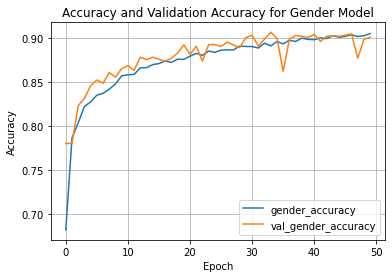

In [16]:
fig = plt.figure()
plt.plot(gender_history.history['accuracy'], label='gender_accuracy')
plt.plot(gender_history.history['val_accuracy'], label='val_gender_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.title('Accuracy and Validation Accuracy for Gender Model')
plt.show()

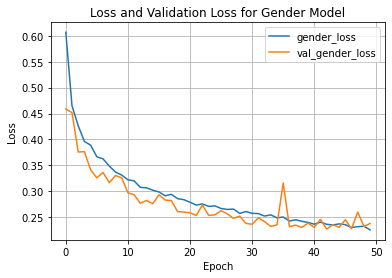

In [17]:
fig = plt.figure()
plt.plot(gender_history.history['loss'], label='gender_loss')
plt.plot(gender_history.history['val_loss'], label='val_gender_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.title('Loss and Validation Loss for Gender Model')
plt.show()

Training Age Model

In [25]:
age_history=age_model.fit(train_generator_age, epochs=50, validation_data=(X_test_age,Y_test_age), callbacks=[early_stopping, model_checkpoint_age])

Epoch 1/50
556/556 [==============================] - 81s 145ms/step - loss: 7.8884 - val_loss: 6.7533
Epoch 2/50
556/556 [==============================] - 117s 210ms/step - loss: 7.9362 - val_loss: 6.4953
Epoch 3/50
556/556 [==============================] - 150s 270ms/step - loss: 7.8765 - val_loss: 10.5482
Epoch 4/50
556/556 [==============================] - 189s 339ms/step - loss: 7.8042 - val_loss: 7.4132
Epoch 5/50
556/556 [==============================] - 200s 359ms/step - loss: 7.7969 - val_loss: 7.5352
Epoch 6/50
556/556 [==============================] - 154s 278ms/step - loss: 7.6680 - val_loss: 6.4213
Epoch 7/50
556/556 [==============================] - 179s 321ms/step - loss: 7.7193 - val_loss: 6.9991
Epoch 8/50
556/556 [==============================] - 178s 320ms/step - loss: 7.7196 - val_loss: 6.5513
Epoch 9/50
556/556 [==============================] - 141s 254ms/step - loss: 7.6446 - val_loss: 6.7469
Epoch 10/50
556/556 [==============================] - 130s 233m

In [19]:
#age_model.save("age.h5")

In [26]:
age_model.evaluate(X_test_age, Y_test_age)

186/186 [==============================] - 11s 58ms/step - loss: 6.6145


6.614524841308594

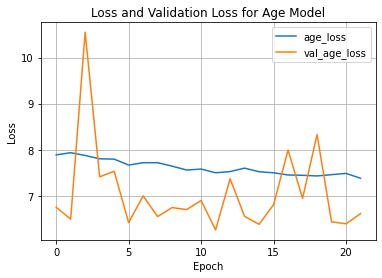

In [27]:
fig = plt.figure()
plt.plot(age_history.history['loss'], label='age_loss')
plt.plot(age_history.history['val_loss'], label='val_age_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.title('Loss and Validation Loss for Age Model')
plt.show()

Training Race Model

In [28]:
race_history=race_model.fit(train_generator_race, epochs=50, validation_data=(X_test_race,Y_test_race), callbacks=[early_stopping, model_checkpoint_race])

Epoch 1/50
556/556 [==============================] - 148s 260ms/step - loss: 1.4287 - accuracy: 0.4547 - val_loss: 1.3056 - val_accuracy: 0.4866
Epoch 2/50
556/556 [==============================] - 108s 195ms/step - loss: 1.2848 - accuracy: 0.4984 - val_loss: 1.1305 - val_accuracy: 0.5688
Epoch 3/50
556/556 [==============================] - 116s 209ms/step - loss: 1.1597 - accuracy: 0.5556 - val_loss: 1.0444 - val_accuracy: 0.6163
Epoch 4/50
556/556 [==============================] - 110s 198ms/step - loss: 1.0920 - accuracy: 0.5915 - val_loss: 0.9959 - val_accuracy: 0.6379
Epoch 5/50
556/556 [==============================] - 113s 202ms/step - loss: 1.0340 - accuracy: 0.6231 - val_loss: 0.8696 - val_accuracy: 0.6938
Epoch 6/50
556/556 [==============================] - 113s 202ms/step - loss: 0.9980 - accuracy: 0.6415 - val_loss: 0.9350 - val_accuracy: 0.6580
Epoch 7/50
556/556 [==============================] - 112s 202ms/step - loss: 0.9716 - accuracy: 0.6497 - val_loss: 0.9094 -

In [29]:
#race_model.save("race.h5")

In [30]:
race_model.evaluate(X_test_race, Y_test_race)

186/186 [==============================] - 8s 41ms/step - loss: 0.6413 - accuracy: 0.7840


[0.641258180141449, 0.7840391397476196]

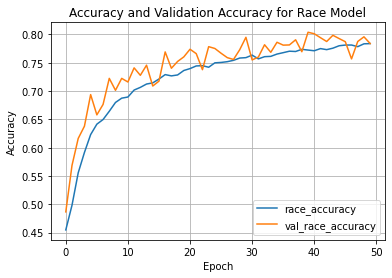

In [31]:
fig = plt.figure()
plt.plot(race_history.history['accuracy'], label='race_accuracy')
plt.plot(race_history.history['val_accuracy'], label='val_race_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.title('Accuracy and Validation Accuracy for Race Model')
plt.show()

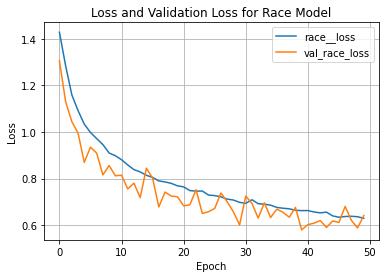

In [32]:
fig = plt.figure()
plt.plot(race_history.history['loss'], label='race__loss')
plt.plot(race_history.history['val_loss'], label='val_race_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.title('Loss and Validation Loss for Race Model')
plt.show()

Prediction Result

Pick the best model with least validation loss

In [2]:
Load_gender_model=load_model('gender-43-0.23.hdf5')
Load_age_model=load_model('age-12-6.26.hdf5')
Load_race_model=load_model('race-40-0.58.hdf5')

a) Gender

In [34]:
gender_pred=np.round(Load_gender_model.predict([X_test_gender]))

186/186 [==============================] - 4s 19ms/step


<AxesSubplot:xlabel='Predicted', ylabel='Actual'>

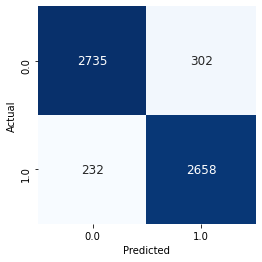

In [35]:
cm=confusion_matrix(Y_test_gender, gender_pred)
df_cm = pd.DataFrame(cm, columns=np.unique(Y_test_gender), index = np.unique(Y_test_gender))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
sns.heatmap(df_cm, annot=True,annot_kws={"size": 12}, cbar=False,square=True, fmt="d", cmap="Blues")

In [36]:
print(classification_report(Y_test_gender, gender_pred))

              precision    recall  f1-score   support

         0.0       0.92      0.90      0.91      3037
         1.0       0.90      0.92      0.91      2890

    accuracy                           0.91      5927
   macro avg       0.91      0.91      0.91      5927
weighted avg       0.91      0.91      0.91      5927



b) Age

In [37]:
age_pred=Load_age_model.predict(X_test_age).flatten()

186/186 [==============================] - 4s 19ms/step


In [38]:
age_pred

array([38.72209  ,  6.9268136, 45.424038 , ..., 36.961365 , 33.52786  ,
       31.615093 ], dtype=float32)

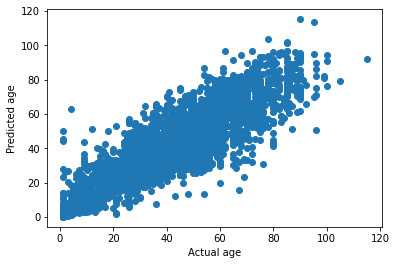

In [39]:
fig = plt.figure()
plt.scatter(Y_test_age, age_pred)
plt.xlabel('Actual age')
plt.ylabel('Predicted age')
plt.show()

In [40]:
r2_scores=r2_score (Y_test_age, age_pred)
rmse_scores=mean_squared_error(Y_test_age, age_pred)**0.5
print('R-saqured: ', r2_scores)
print('RMSE: ', rmse_scores)

R-saqured:  0.797261616637166
RMSE:  8.96558752361242


c) Race

In [44]:
race_pred=np.argmax(Load_race_model.predict([X_test_race]),axis=1)

186/186 [==============================] - 4s 19ms/step


<AxesSubplot:xlabel='Predicted', ylabel='Actual'>

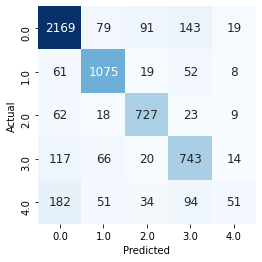

In [45]:
cm=confusion_matrix(Y_test_race, race_pred)
df_cm = pd.DataFrame(cm, columns=np.unique(Y_test_race), index = np.unique(Y_test_race))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
sns.heatmap(df_cm, annot=True,annot_kws={"size": 12}, cbar=False,square=True, fmt="d", cmap="Blues")

In [46]:
print(classification_report(Y_test_race, race_pred))

              precision    recall  f1-score   support

         0.0       0.84      0.87      0.85      2501
         1.0       0.83      0.88      0.86      1215
         2.0       0.82      0.87      0.84       839
         3.0       0.70      0.77      0.74       960
         4.0       0.50      0.12      0.20       412

    accuracy                           0.80      5927
   macro avg       0.74      0.70      0.70      5927
weighted avg       0.79      0.80      0.79      5927



Try Individual Prediction for the first image

In [48]:
predict_gender1=np.round(Load_gender_model.predict([images_data[0].reshape(1,32,32,1)]))
predict_age1=np.round(Load_age_model.predict([images_data[0].reshape(1,32,32,1)]))
predict_race1=np.argmax(Load_race_model.predict([images_data[0].reshape(1,32,32,1)]))


1/1 [==============================] - 0s 17ms/step


In [49]:
print(predict_gender1)
print(predict_age1)
print(predict_race1)

[[0.]]
[[91.]]
0


In [50]:
print(Gender[0])
print(Age[0])
print(Race[0])

0
100
0


Load Model

Try Predict 1000 images

In [51]:
num_list=np.random.randint(1,len(images_data),1000)

In [52]:
num_list

array([ 4314, 22351, 12935,  9301, 12020, 21754, 20306, 11437,  6992,
        3306, 11170,  8049, 19757, 23620, 10702,  7475,  9183,  5756,
           3,  9601, 16082, 13042, 13628,  8971, 15614, 17208,  2871,
        3332, 22387, 15393,  8449, 12639, 18739,   271,  1894, 15661,
       11494, 10379, 13272, 12812, 20143,  4723, 12369, 17650, 14583,
       19305,  4512,  5903,  2479,  2212, 10177, 10097, 14736, 20902,
       14604, 15462, 16264,  4837, 22416,  8697, 17376, 17619, 13164,
       17112,  4502, 16606, 12053, 11174, 20645, 15762, 10613,  2108,
       11840,  8498,  7744,  2291,  1111,  1506, 21255, 12483,  1232,
        2385, 13084, 11984, 16133, 14889,  5749,  9842, 20262,  2270,
       18624,  8246,  5613, 13750, 17396, 17193, 23548,  3155,  3231,
       19184, 22696, 14070, 18905, 20377, 10550,  2291, 13792,  5263,
       18514,  2024, 12912,  1516, 23410, 16072, 13623, 12788,  5718,
       12733, 21721, 22169,  4978,  7216,    61,  2235, 16197,  4363,
       11888, 16686,

Age: 0 - 116    
Gender: 0 (male) or 1 (female)    
Race: 0 (White), 1 (Black), 2 (Asian), 3(Indian), 4 (Others, Hispanic, Latino, Middle Eastern)

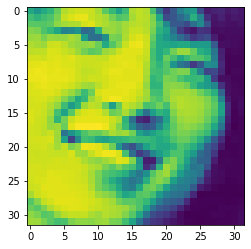

Actual Gender: Male, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 100ms/step
Predicted Gender: Male, Predicted Age: 19, Predicted Race: Asian



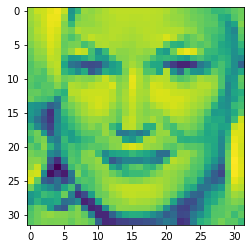

Actual Gender: Female, Actual Age: 76, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 41, Predicted Race: White



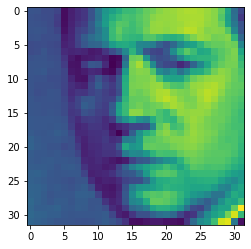

Actual Gender: Male, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: White



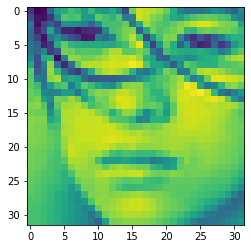

Actual Gender: Female, Actual Age: 28, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: White



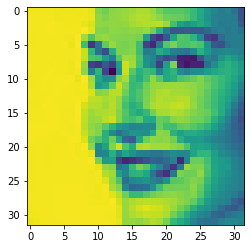

Actual Gender: Female, Actual Age: 32, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: White



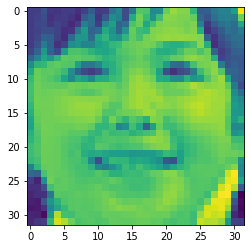

Actual Gender: Female, Actual Age: 6, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: Asian



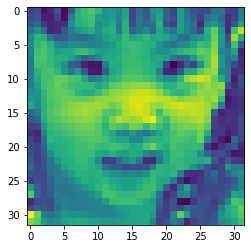

Actual Gender: Female, Actual Age: 5, Actual Race: Asian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: Asian



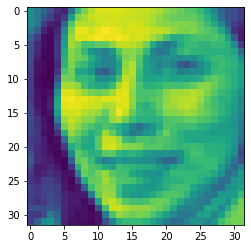

Actual Gender: Female, Actual Age: 31, Actual Race: White
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Female, Predicted Age: 32, Predicted Race: Indian



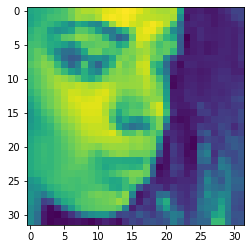

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Black



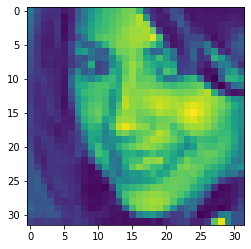

Actual Gender: Female, Actual Age: 21, Actual Race: Others
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Black



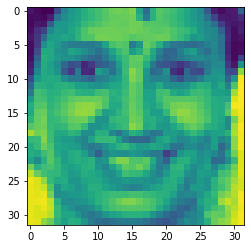

Actual Gender: Female, Actual Age: 30, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 30, Predicted Race: Indian



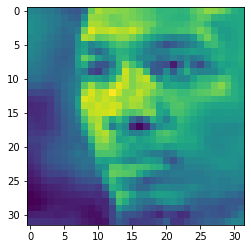

Actual Gender: Male, Actual Age: 27, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 33, Predicted Race: Black



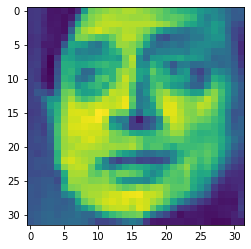

Actual Gender: Male, Actual Age: 57, Actual Race: Indian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 48, Predicted Race: White



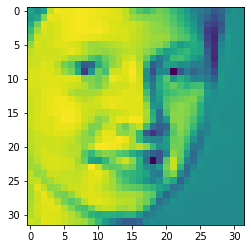

Actual Gender: Male, Actual Age: 9, Actual Race: White
1/1 [==============================] - 0s 15ms/step
Predicted Gender: Male, Predicted Age: 9, Predicted Race: White



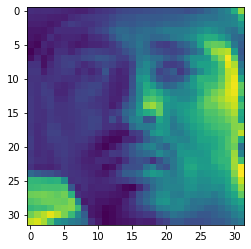

Actual Gender: Male, Actual Age: 30, Actual Race: Black
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: Black



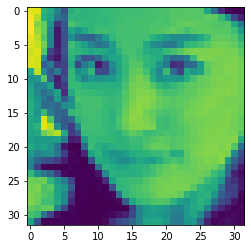

Actual Gender: Female, Actual Age: 26, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Asian



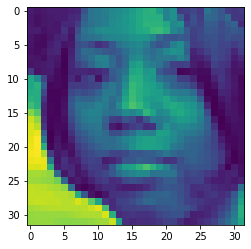

Actual Gender: Female, Actual Age: 28, Actual Race: Black
1/1 [==============================] - 0s 15ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Black



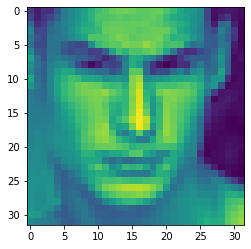

Actual Gender: Male, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: White



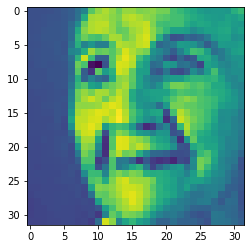

Actual Gender: Female, Actual Age: 100, Actual Race: White
1/1 [==============================] - 0s 15ms/step
Predicted Gender: Female, Predicted Age: 71, Predicted Race: White



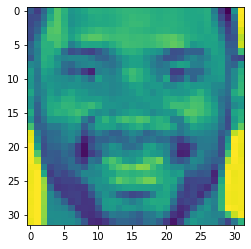

Actual Gender: Male, Actual Age: 29, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: Black



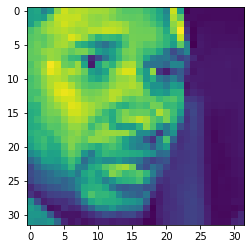

Actual Gender: Male, Actual Age: 42, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Black



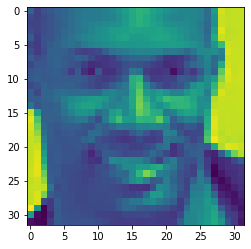

Actual Gender: Male, Actual Age: 35, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: Black



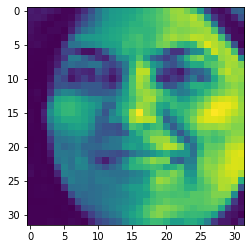

Actual Gender: Female, Actual Age: 35, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 31, Predicted Race: Indian



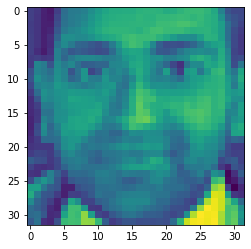

Actual Gender: Male, Actual Age: 28, Actual Race: Indian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: Indian



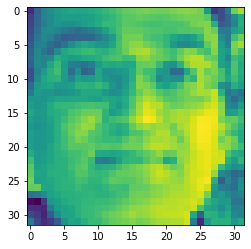

Actual Gender: Male, Actual Age: 40, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 39, Predicted Race: Indian



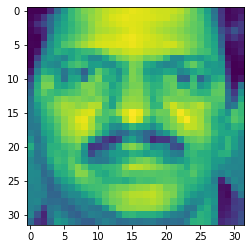

Actual Gender: Male, Actual Age: 47, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 46, Predicted Race: Indian



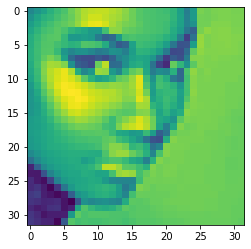

Actual Gender: Female, Actual Age: 20, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Black



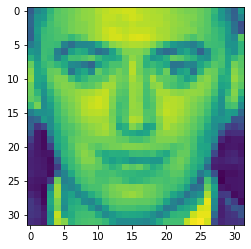

Actual Gender: Male, Actual Age: 22, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: White



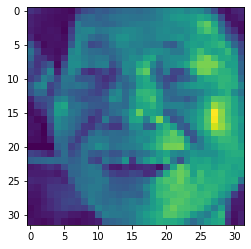

Actual Gender: Male, Actual Age: 77, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 65, Predicted Race: Asian



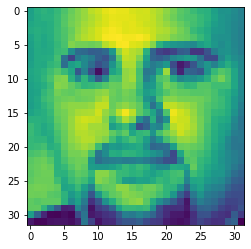

Actual Gender: Male, Actual Age: 40, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: White



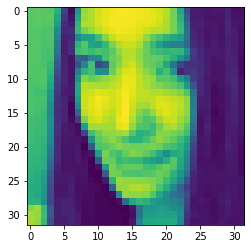

Actual Gender: Female, Actual Age: 27, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Asian



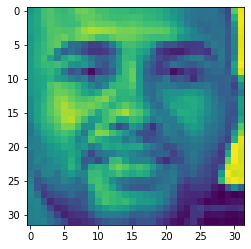

Actual Gender: Male, Actual Age: 34, Actual Race: Others
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: Black



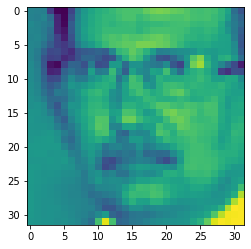

Actual Gender: Male, Actual Age: 53, Actual Race: Indian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 44, Predicted Race: Indian



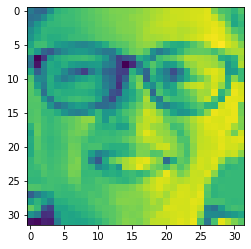

Actual Gender: Male, Actual Age: 12, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 41, Predicted Race: White



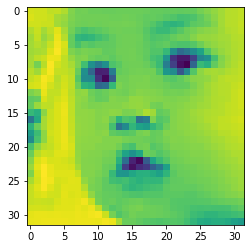

Actual Gender: Male, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 1, Predicted Race: Asian



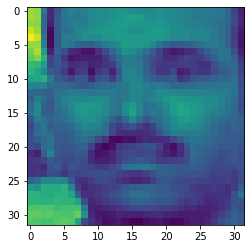

Actual Gender: Male, Actual Age: 40, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 30, Predicted Race: Indian



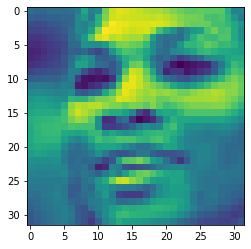

Actual Gender: Female, Actual Age: 31, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Black



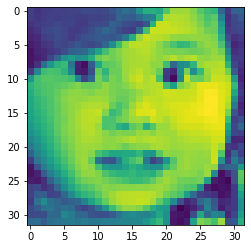

Actual Gender: Female, Actual Age: 2, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: Asian



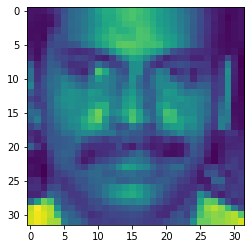

Actual Gender: Male, Actual Age: 35, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 48, Predicted Race: Indian



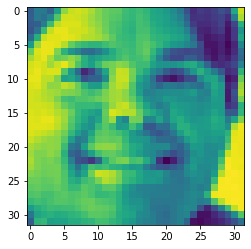

Actual Gender: Male, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 22, Predicted Race: White



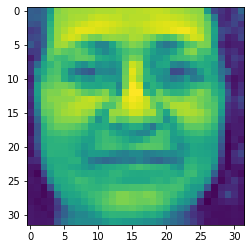

Actual Gender: Female, Actual Age: 59, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 55, Predicted Race: Indian



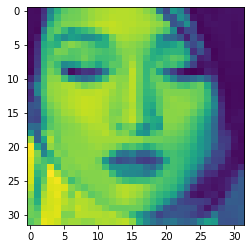

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Asian



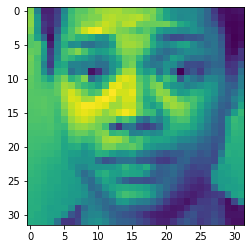

Actual Gender: Female, Actual Age: 33, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Black



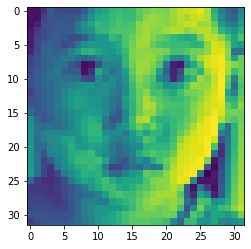

Actual Gender: Male, Actual Age: 4, Actual Race: Asian
1/1 [==============================] - 0s 15ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: Asian



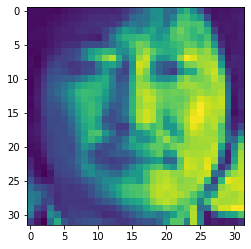

Actual Gender: Male, Actual Age: 38, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 53, Predicted Race: Asian



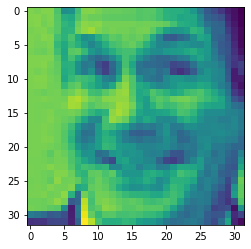

Actual Gender: Male, Actual Age: 55, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 54, Predicted Race: White



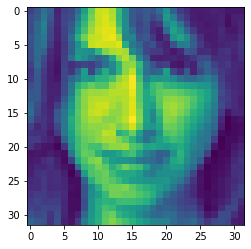

Actual Gender: Female, Actual Age: 24, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: White



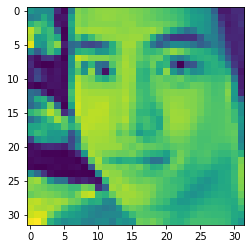

Actual Gender: Male, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 22, Predicted Race: Asian



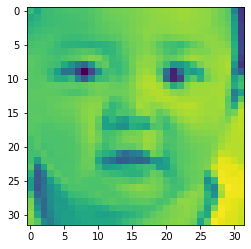

Actual Gender: Female, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 1, Predicted Race: Asian



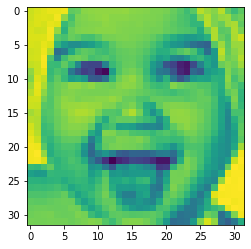

Actual Gender: Female, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 2, Predicted Race: Others



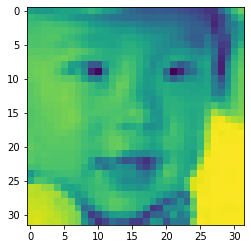

Actual Gender: Male, Actual Age: 2, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 3, Predicted Race: Asian



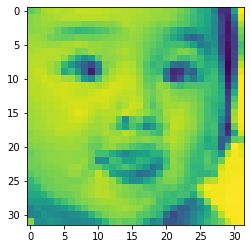

Actual Gender: Male, Actual Age: 2, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: Asian



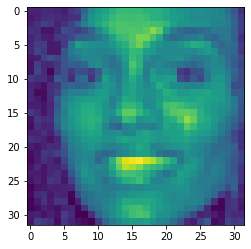

Actual Gender: Female, Actual Age: 38, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Black



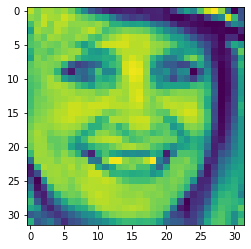

Actual Gender: Female, Actual Age: 62, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 38, Predicted Race: White



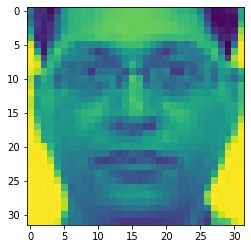

Actual Gender: Male, Actual Age: 38, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: Indian



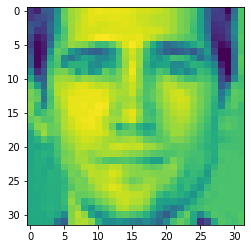

Actual Gender: Male, Actual Age: 40, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: White



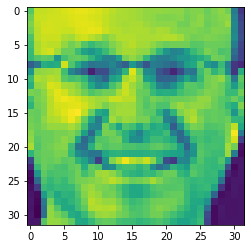

Actual Gender: Male, Actual Age: 43, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 49, Predicted Race: White



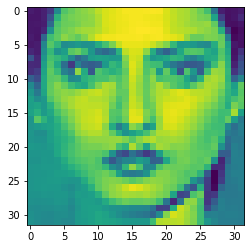

Actual Gender: Female, Actual Age: 24, Actual Race: Indian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Indian



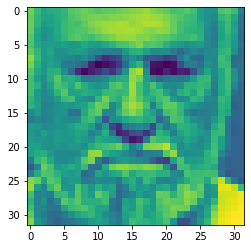

Actual Gender: Male, Actual Age: 78, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 80, Predicted Race: White



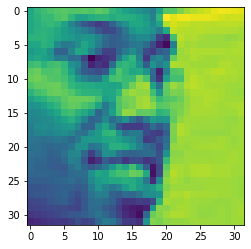

Actual Gender: Male, Actual Age: 28, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 40, Predicted Race: Black



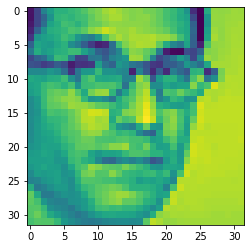

Actual Gender: Male, Actual Age: 48, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 33, Predicted Race: Indian



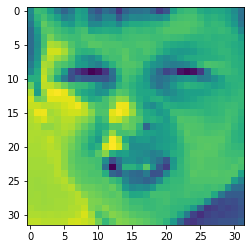

Actual Gender: Male, Actual Age: 4, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 6, Predicted Race: White



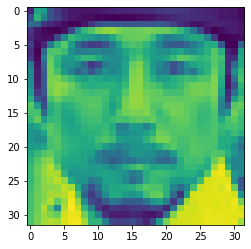

Actual Gender: Male, Actual Age: 35, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Asian



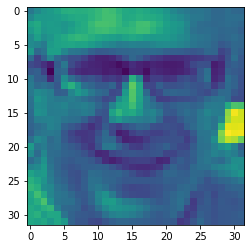

Actual Gender: Male, Actual Age: 47, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 59, Predicted Race: White



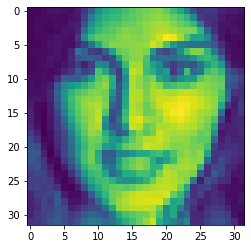

Actual Gender: Female, Actual Age: 24, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Indian



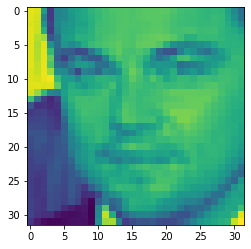

Actual Gender: Male, Actual Age: 45, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: White



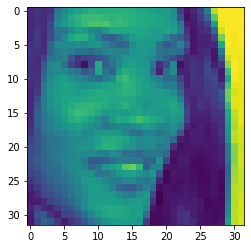

Actual Gender: Female, Actual Age: 32, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Black



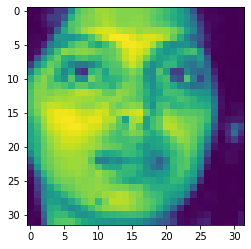

Actual Gender: Female, Actual Age: 30, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Indian



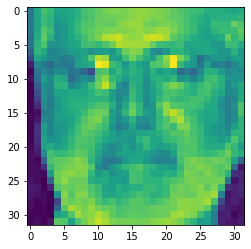

Actual Gender: Male, Actual Age: 61, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 72, Predicted Race: White



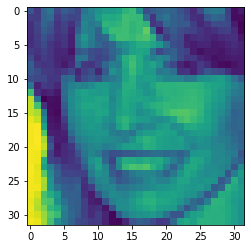

Actual Gender: Female, Actual Age: 40, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 35, Predicted Race: White



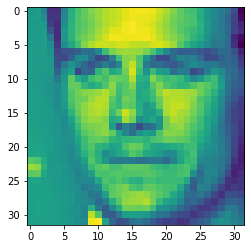

Actual Gender: Male, Actual Age: 30, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 30, Predicted Race: White



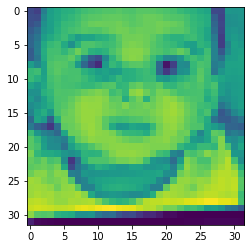

Actual Gender: Male, Actual Age: 1, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 4, Predicted Race: Black



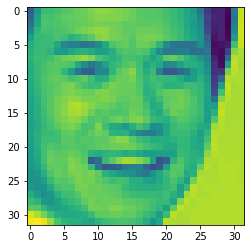

Actual Gender: Male, Actual Age: 32, Actual Race: Asian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 34, Predicted Race: Asian



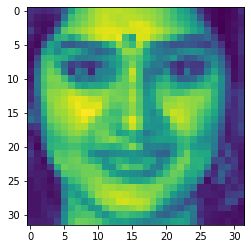

Actual Gender: Female, Actual Age: 27, Actual Race: Indian
1/1 [==============================] - 0s 25ms/step
Predicted Gender: Female, Predicted Age: 28, Predicted Race: Indian



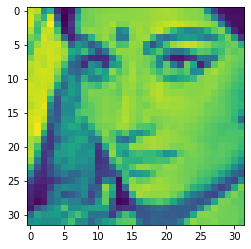

Actual Gender: Female, Actual Age: 26, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Indian



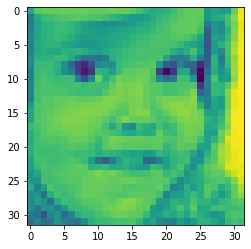

Actual Gender: Female, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: White



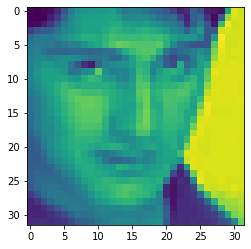

Actual Gender: Male, Actual Age: 17, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 25, Predicted Race: Indian



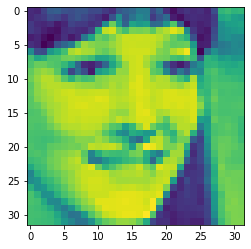

Actual Gender: Female, Actual Age: 19, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 21, Predicted Race: White



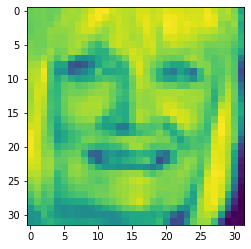

Actual Gender: Female, Actual Age: 65, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 72, Predicted Race: White



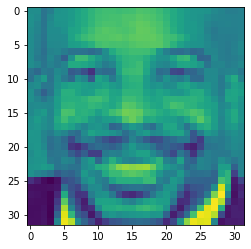

Actual Gender: Male, Actual Age: 34, Actual Race: Black
1/1 [==============================] - 0s 15ms/step
Predicted Gender: Male, Predicted Age: 48, Predicted Race: Black



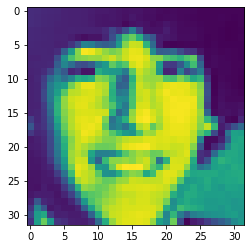

Actual Gender: Male, Actual Age: 18, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 23, Predicted Race: White



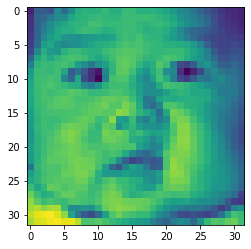

Actual Gender: Female, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 1, Predicted Race: Asian



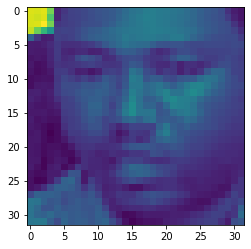

Actual Gender: Male, Actual Age: 35, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Black



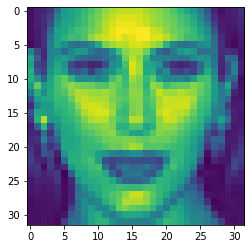

Actual Gender: Female, Actual Age: 32, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: White



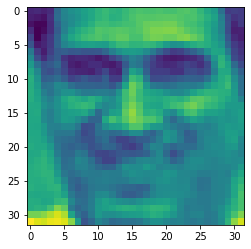

Actual Gender: Male, Actual Age: 42, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 44, Predicted Race: Indian



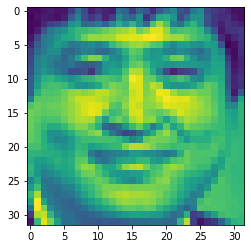

Actual Gender: Male, Actual Age: 39, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: Asian



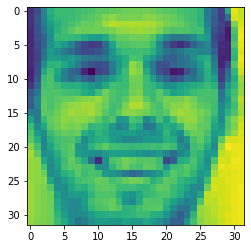

Actual Gender: Male, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 22, Predicted Race: White



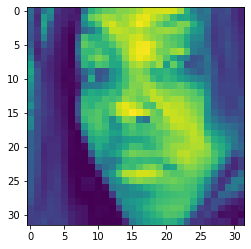

Actual Gender: Female, Actual Age: 29, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 29, Predicted Race: Black



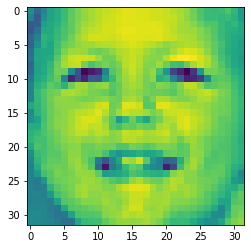

Actual Gender: Female, Actual Age: 5, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 3, Predicted Race: White



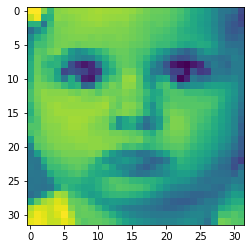

Actual Gender: Female, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: Indian



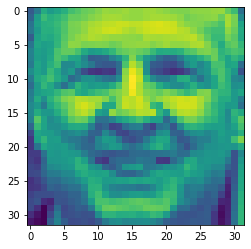

Actual Gender: Male, Actual Age: 53, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 68, Predicted Race: White



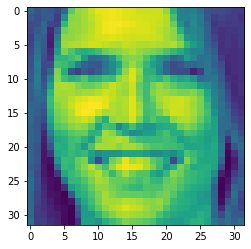

Actual Gender: Female, Actual Age: 27, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 31, Predicted Race: White



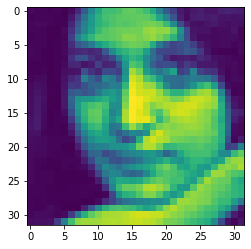

Actual Gender: Female, Actual Age: 25, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Indian



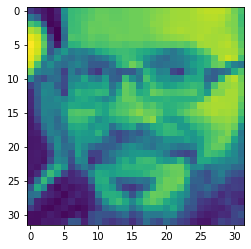

Actual Gender: Male, Actual Age: 36, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 37, Predicted Race: White



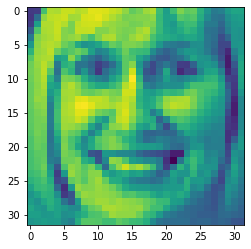

Actual Gender: Female, Actual Age: 48, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 50, Predicted Race: White



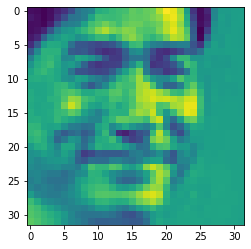

Actual Gender: Male, Actual Age: 47, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 38, Predicted Race: Asian



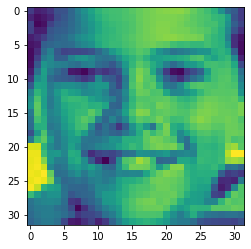

Actual Gender: Male, Actual Age: 9, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 10, Predicted Race: White



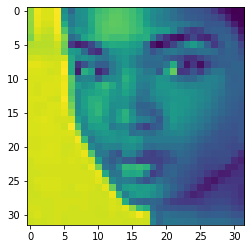

Actual Gender: Female, Actual Age: 21, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Black



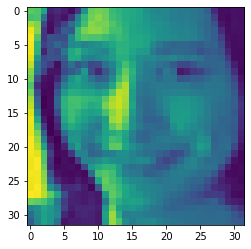

Actual Gender: Female, Actual Age: 21, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 17, Predicted Race: Asian



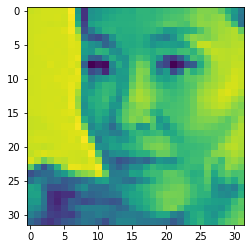

Actual Gender: Female, Actual Age: 54, Actual Race: Asian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 28, Predicted Race: Asian



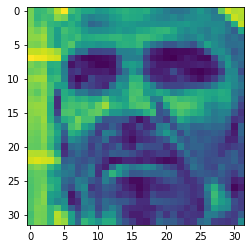

Actual Gender: Male, Actual Age: 80, Actual Race: Black
1/1 [==============================] - 0s 15ms/step
Predicted Gender: Male, Predicted Age: 61, Predicted Race: Black



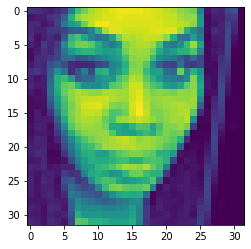

Actual Gender: Female, Actual Age: 36, Actual Race: Black
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Black



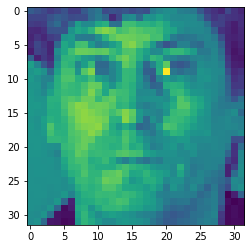

Actual Gender: Male, Actual Age: 54, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 49, Predicted Race: Indian



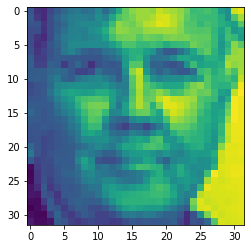

Actual Gender: Male, Actual Age: 60, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 55, Predicted Race: White



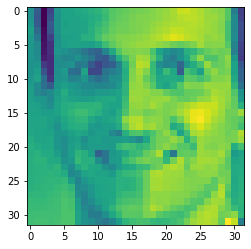

Actual Gender: Male, Actual Age: 30, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: White



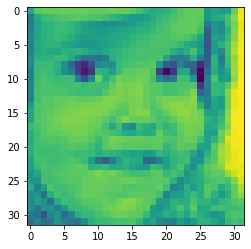

Actual Gender: Female, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: White



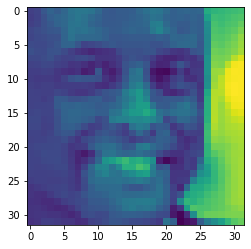

Actual Gender: Male, Actual Age: 36, Actual Race: Black
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 35, Predicted Race: Black



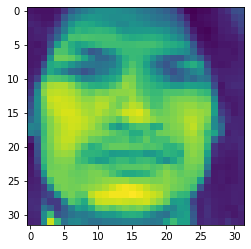

Actual Gender: Male, Actual Age: 25, Actual Race: Others
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Indian



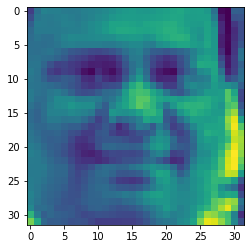

Actual Gender: Male, Actual Age: 52, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 42, Predicted Race: Indian



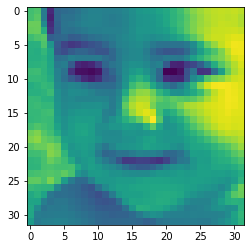

Actual Gender: Male, Actual Age: 1, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 3, Predicted Race: Asian



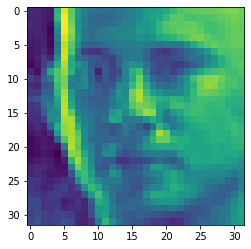

Actual Gender: Male, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 38, Predicted Race: White



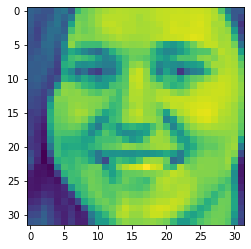

Actual Gender: Female, Actual Age: 19, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 29, Predicted Race: White



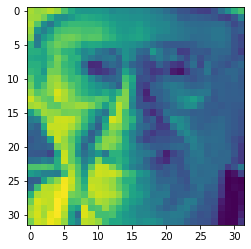

Actual Gender: Male, Actual Age: 90, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 75, Predicted Race: White



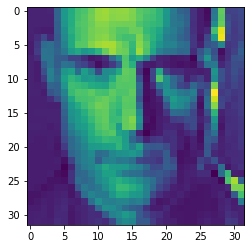

Actual Gender: Male, Actual Age: 42, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: White



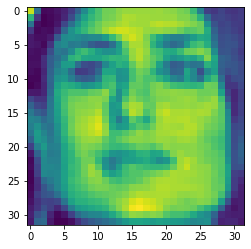

Actual Gender: Female, Actual Age: 35, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Indian



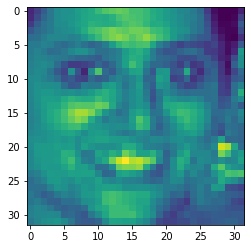

Actual Gender: Female, Actual Age: 34, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 30, Predicted Race: Indian



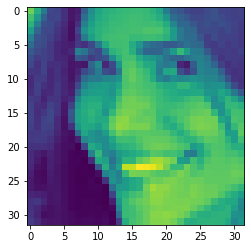

Actual Gender: Female, Actual Age: 25, Actual Race: Others
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: White



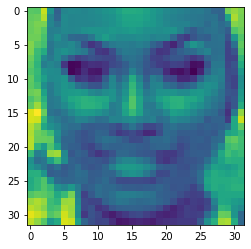

Actual Gender: Female, Actual Age: 34, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 28, Predicted Race: Black



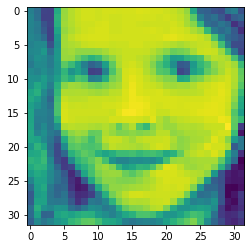

Actual Gender: Female, Actual Age: 6, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: White



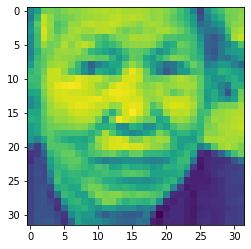

Actual Gender: Female, Actual Age: 74, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 77, Predicted Race: Asian



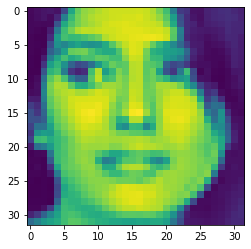

Actual Gender: Female, Actual Age: 24, Actual Race: Others
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Indian



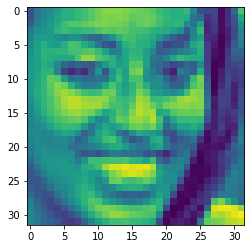

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 32, Predicted Race: Black



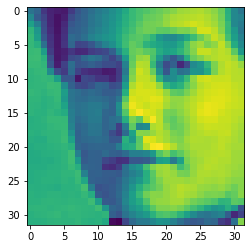

Actual Gender: Male, Actual Age: 10, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 17, Predicted Race: White



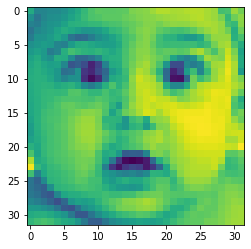

Actual Gender: Female, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 0, Predicted Race: Indian



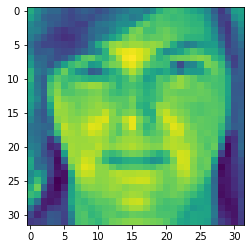

Actual Gender: Female, Actual Age: 42, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 33, Predicted Race: White



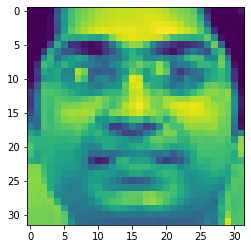

Actual Gender: Male, Actual Age: 24, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Indian



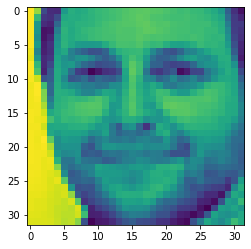

Actual Gender: Male, Actual Age: 32, Actual Race: Indian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 35, Predicted Race: White



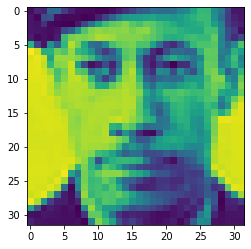

Actual Gender: Male, Actual Age: 45, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Black



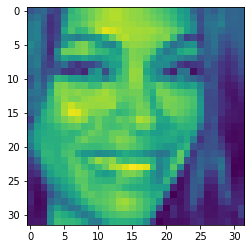

Actual Gender: Female, Actual Age: 27, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 29, Predicted Race: Black



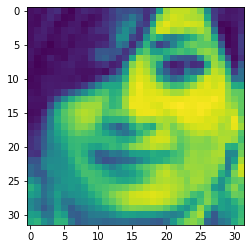

Actual Gender: Female, Actual Age: 26, Actual Race: Indian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Indian



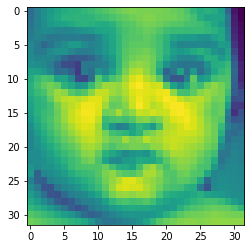

Actual Gender: Female, Actual Age: 1, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: Indian



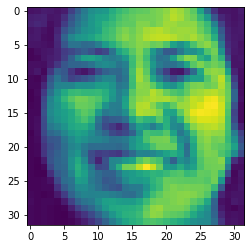

Actual Gender: Female, Actual Age: 28, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 32, Predicted Race: Others



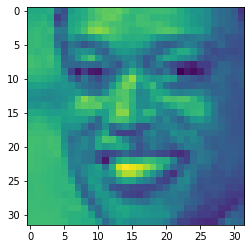

Actual Gender: Female, Actual Age: 35, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 46, Predicted Race: Black



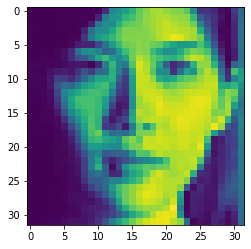

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



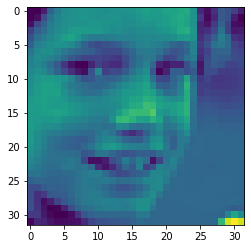

Actual Gender: Male, Actual Age: 9, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 19, Predicted Race: Indian



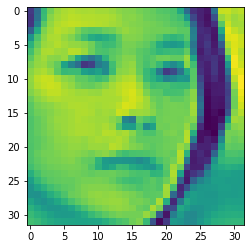

Actual Gender: Female, Actual Age: 30, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Asian



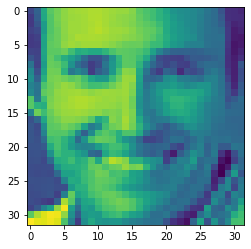

Actual Gender: Male, Actual Age: 35, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: White



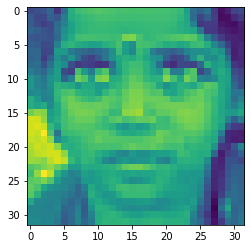

Actual Gender: Female, Actual Age: 8, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Indian



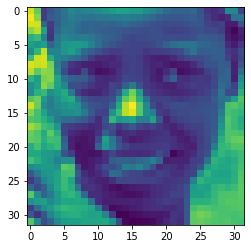

Actual Gender: Female, Actual Age: 27, Actual Race: Black
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Black



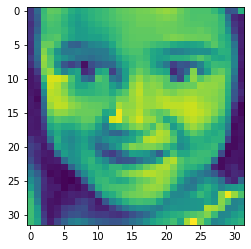

Actual Gender: Female, Actual Age: 7, Actual Race: Others
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: Black



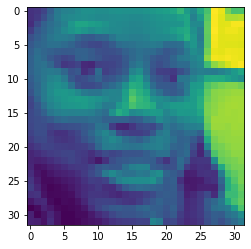

Actual Gender: Female, Actual Age: 25, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 21, Predicted Race: Black



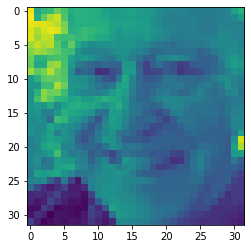

Actual Gender: Male, Actual Age: 72, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 78, Predicted Race: White



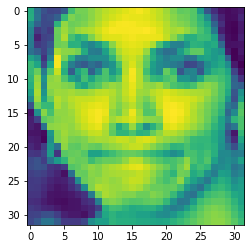

Actual Gender: Female, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Indian



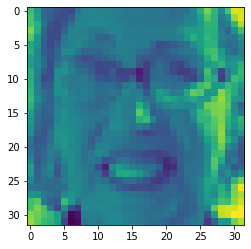

Actual Gender: Female, Actual Age: 65, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 63, Predicted Race: White



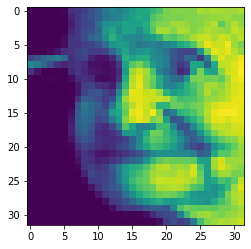

Actual Gender: Female, Actual Age: 93, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 70, Predicted Race: White



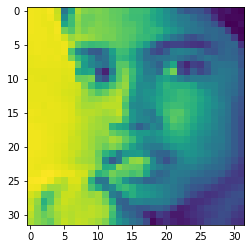

Actual Gender: Male, Actual Age: 15, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 20, Predicted Race: Indian



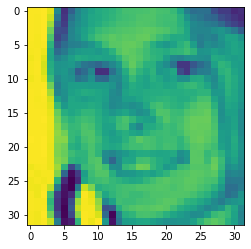

Actual Gender: Female, Actual Age: 11, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 9, Predicted Race: White



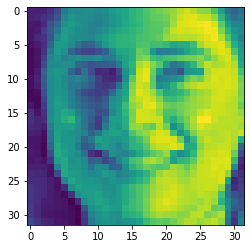

Actual Gender: Female, Actual Age: 48, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 51, Predicted Race: White



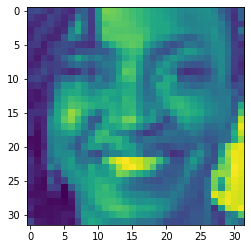

Actual Gender: Female, Actual Age: 36, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 30, Predicted Race: Black



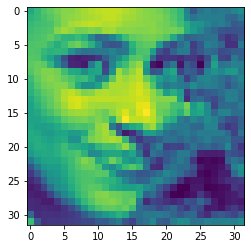

Actual Gender: Female, Actual Age: 30, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 33, Predicted Race: White



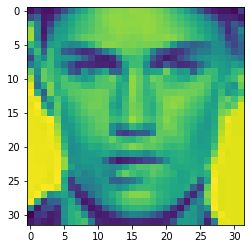

Actual Gender: Male, Actual Age: 16, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 22, Predicted Race: Indian



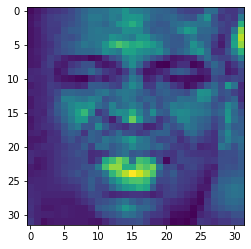

Actual Gender: Male, Actual Age: 40, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 34, Predicted Race: Black



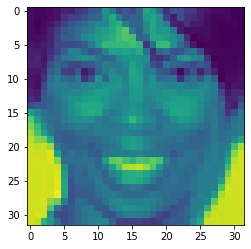

Actual Gender: Female, Actual Age: 30, Actual Race: Black
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 32, Predicted Race: Black



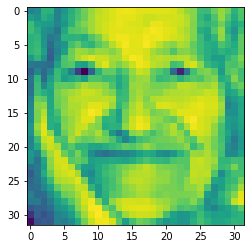

Actual Gender: Female, Actual Age: 89, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 69, Predicted Race: Asian



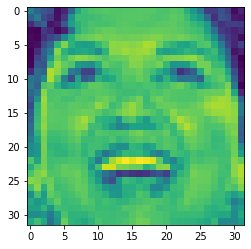

Actual Gender: Female, Actual Age: 56, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 42, Predicted Race: Asian



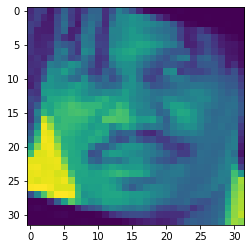

Actual Gender: Male, Actual Age: 30, Actual Race: Black
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 37, Predicted Race: Black



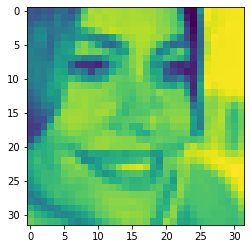

Actual Gender: Female, Actual Age: 35, Actual Race: Others
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Others



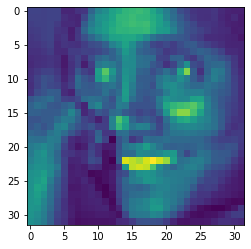

Actual Gender: Female, Actual Age: 37, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 28, Predicted Race: Black



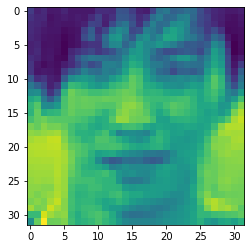

Actual Gender: Male, Actual Age: 28, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Asian



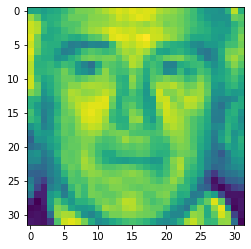

Actual Gender: Male, Actual Age: 63, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 71, Predicted Race: White



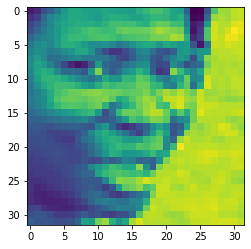

Actual Gender: Female, Actual Age: 52, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 34, Predicted Race: Black



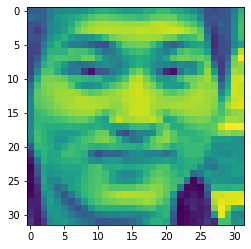

Actual Gender: Male, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 23, Predicted Race: Asian



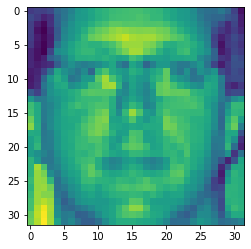

Actual Gender: Male, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 39, Predicted Race: White



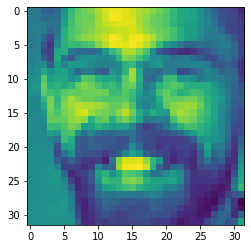

Actual Gender: Male, Actual Age: 43, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 37, Predicted Race: White



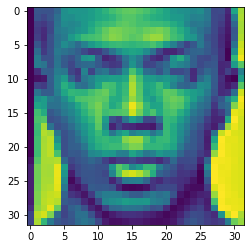

Actual Gender: Male, Actual Age: 19, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: Black



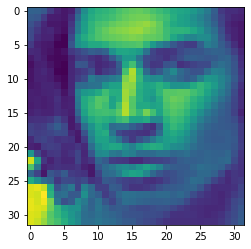

Actual Gender: Male, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Black



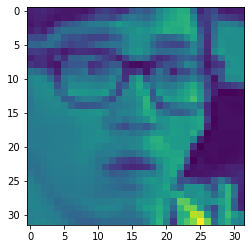

Actual Gender: Male, Actual Age: 26, Actual Race: Asian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Asian



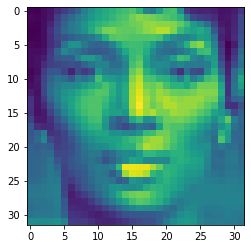

Actual Gender: Female, Actual Age: 22, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Black



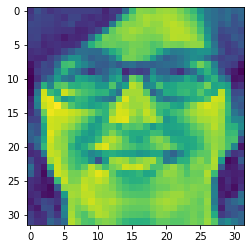

Actual Gender: Female, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 42, Predicted Race: White



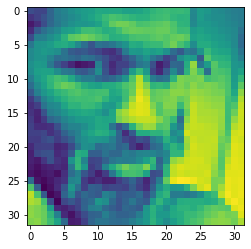

Actual Gender: Male, Actual Age: 32, Actual Race: Black
1/1 [==============================] - 0s 15ms/step
Predicted Gender: Male, Predicted Age: 34, Predicted Race: Black



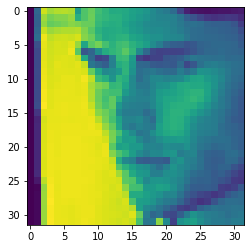

Actual Gender: Male, Actual Age: 30, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 25, Predicted Race: White



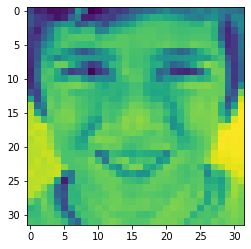

Actual Gender: Male, Actual Age: 11, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 14, Predicted Race: White



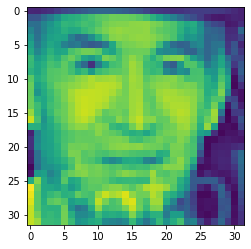

Actual Gender: Male, Actual Age: 64, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 42, Predicted Race: Asian



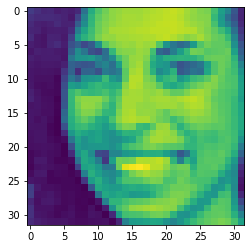

Actual Gender: Female, Actual Age: 26, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: White



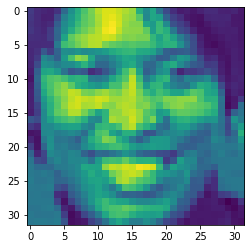

Actual Gender: Female, Actual Age: 38, Actual Race: Black
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Female, Predicted Age: 33, Predicted Race: Black



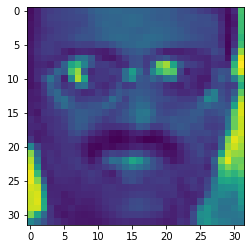

Actual Gender: Male, Actual Age: 26, Actual Race: Asian
1/1 [==============================] - 0s 25ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: Black



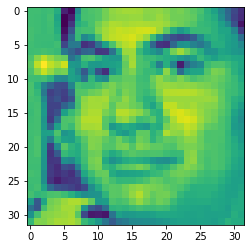

Actual Gender: Male, Actual Age: 35, Actual Race: Others
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: White



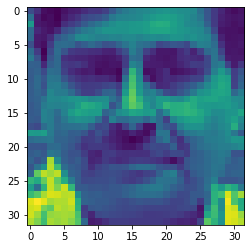

Actual Gender: Male, Actual Age: 55, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 54, Predicted Race: Indian



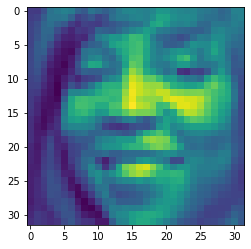

Actual Gender: Female, Actual Age: 36, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 35, Predicted Race: Black



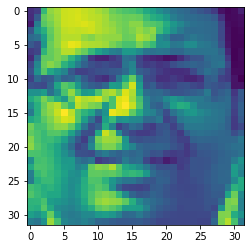

Actual Gender: Male, Actual Age: 36, Actual Race: Indian
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Male, Predicted Age: 52, Predicted Race: Indian



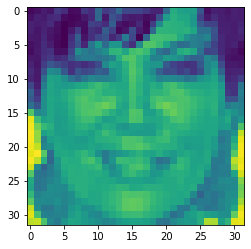

Actual Gender: Female, Actual Age: 58, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 38, Predicted Race: White



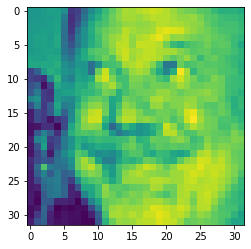

Actual Gender: Male, Actual Age: 53, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 62, Predicted Race: White



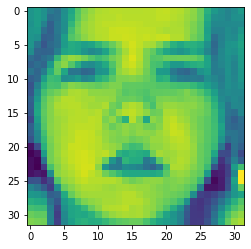

Actual Gender: Female, Actual Age: 5, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 12, Predicted Race: White



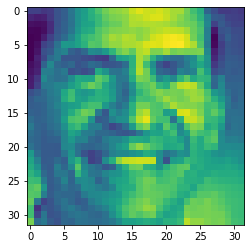

Actual Gender: Male, Actual Age: 64, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 53, Predicted Race: White



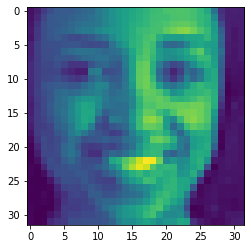

Actual Gender: Female, Actual Age: 36, Actual Race: Black
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Female, Predicted Age: 29, Predicted Race: Black



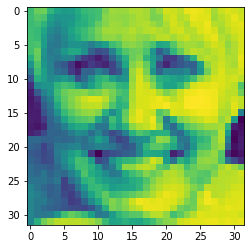

Actual Gender: Female, Actual Age: 60, Actual Race: White
1/1 [==============================] - 0s 26ms/step
Predicted Gender: Female, Predicted Age: 63, Predicted Race: White



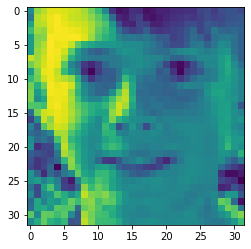

Actual Gender: Male, Actual Age: 11, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 7, Predicted Race: White



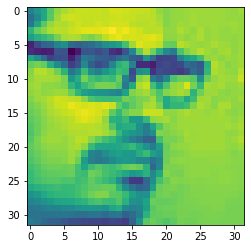

Actual Gender: Male, Actual Age: 26, Actual Race: Others
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: Indian



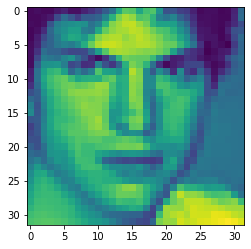

Actual Gender: Male, Actual Age: 25, Actual Race: White
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Male, Predicted Age: 24, Predicted Race: White



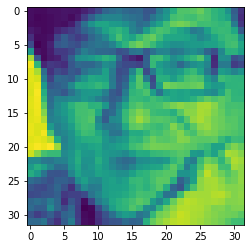

Actual Gender: Male, Actual Age: 50, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 44, Predicted Race: Asian



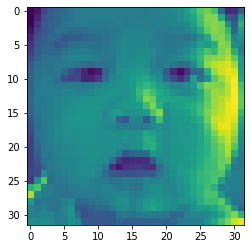

Actual Gender: Female, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 2, Predicted Race: Asian



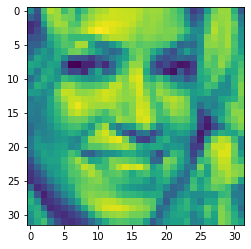

Actual Gender: Female, Actual Age: 37, Actual Race: Others
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 31, Predicted Race: White



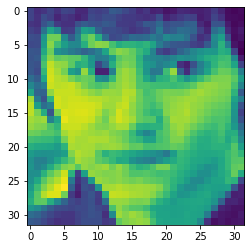

Actual Gender: Male, Actual Age: 15, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 11, Predicted Race: Indian



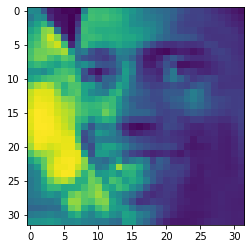

Actual Gender: Male, Actual Age: 27, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Black



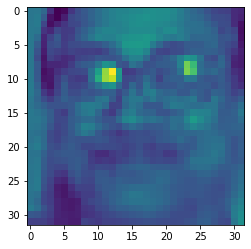

Actual Gender: Male, Actual Age: 54, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 50, Predicted Race: Indian



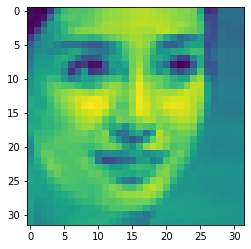

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



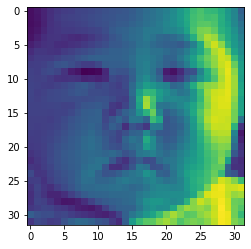

Actual Gender: Female, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 2, Predicted Race: Asian



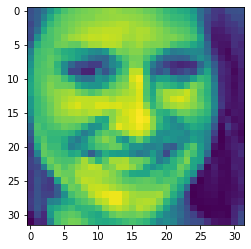

Actual Gender: Female, Actual Age: 29, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 30, Predicted Race: White



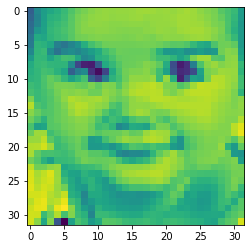

Actual Gender: Female, Actual Age: 1, Actual Race: Others
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 2, Predicted Race: Others



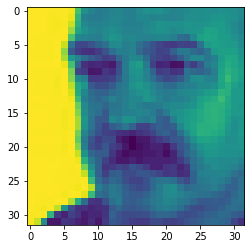

Actual Gender: Male, Actual Age: 56, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 52, Predicted Race: White



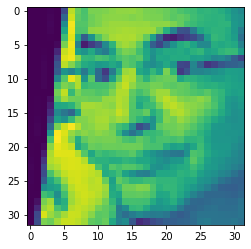

Actual Gender: Male, Actual Age: 45, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Others



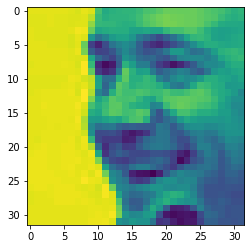

Actual Gender: Male, Actual Age: 48, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 50, Predicted Race: White



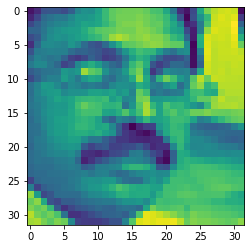

Actual Gender: Male, Actual Age: 55, Actual Race: Indian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 43, Predicted Race: Indian



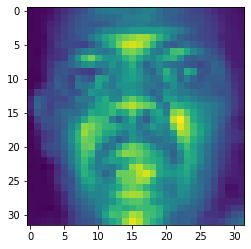

Actual Gender: Male, Actual Age: 30, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 36, Predicted Race: Black



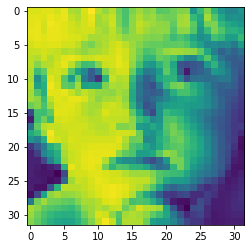

Actual Gender: Male, Actual Age: 4, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: White



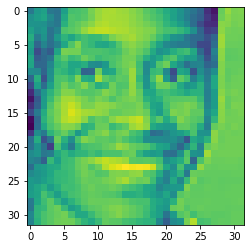

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 28, Predicted Race: Black



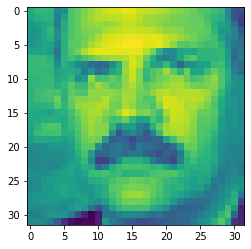

Actual Gender: Male, Actual Age: 56, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 51, Predicted Race: White



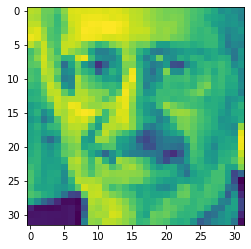

Actual Gender: Male, Actual Age: 53, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 69, Predicted Race: White



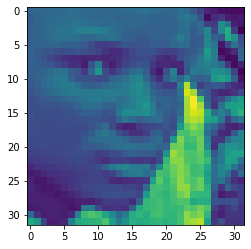

Actual Gender: Female, Actual Age: 19, Actual Race: Black
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Black



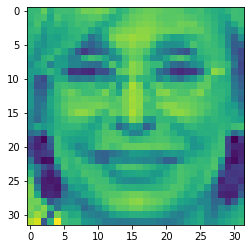

Actual Gender: Female, Actual Age: 58, Actual Race: White
1/1 [==============================] - 0s 15ms/step
Predicted Gender: Female, Predicted Age: 70, Predicted Race: White



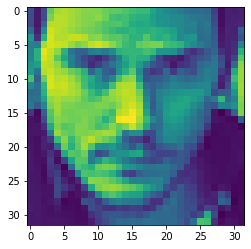

Actual Gender: Male, Actual Age: 30, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Indian



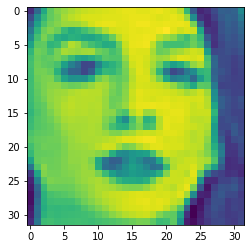

Actual Gender: Female, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Asian



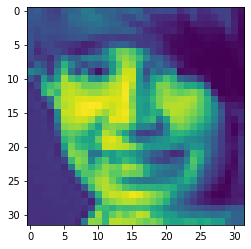

Actual Gender: Female, Actual Age: 16, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: White



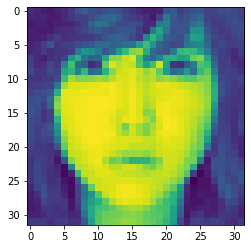

Actual Gender: Female, Actual Age: 22, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Asian



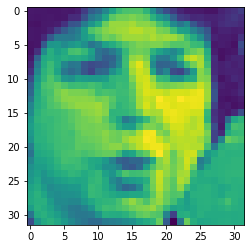

Actual Gender: Female, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 28, Predicted Race: White



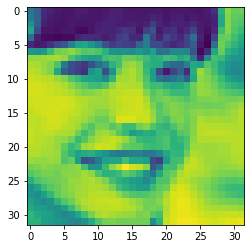

Actual Gender: Female, Actual Age: 26, Actual Race: Asian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 20, Predicted Race: Asian



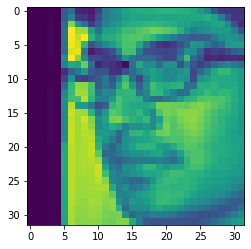

Actual Gender: Male, Actual Age: 23, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: Indian



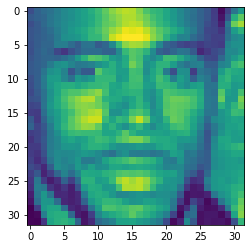

Actual Gender: Male, Actual Age: 32, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 33, Predicted Race: Black



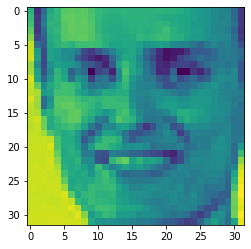

Actual Gender: Male, Actual Age: 34, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 36, Predicted Race: White



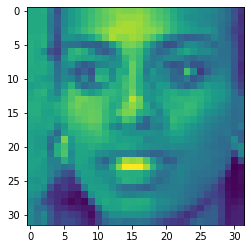

Actual Gender: Male, Actual Age: 35, Actual Race: Black
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Black



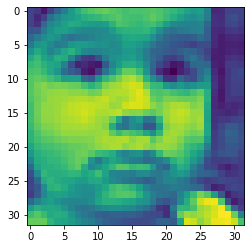

Actual Gender: Female, Actual Age: 2, Actual Race: Others
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: Indian



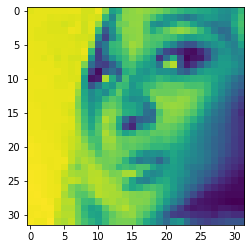

Actual Gender: Female, Actual Age: 35, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Black



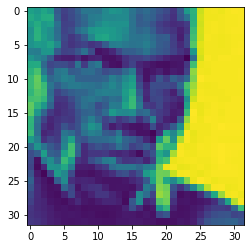

Actual Gender: Male, Actual Age: 39, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 42, Predicted Race: Black



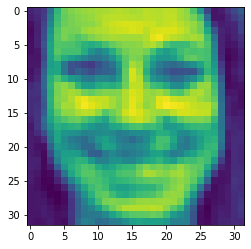

Actual Gender: Female, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 30, Predicted Race: White



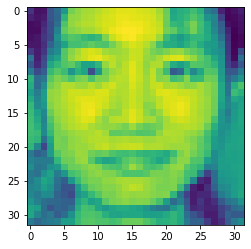

Actual Gender: Female, Actual Age: 29, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Asian



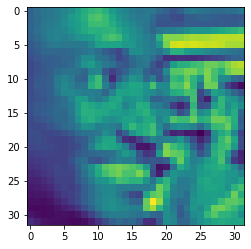

Actual Gender: Male, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 43, Predicted Race: Black



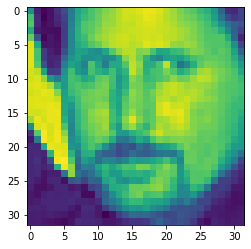

Actual Gender: Male, Actual Age: 51, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 39, Predicted Race: White



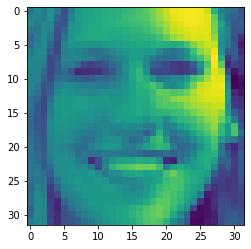

Actual Gender: Female, Actual Age: 28, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 28, Predicted Race: White



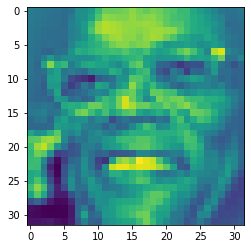

Actual Gender: Male, Actual Age: 65, Actual Race: Black
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 65, Predicted Race: Black



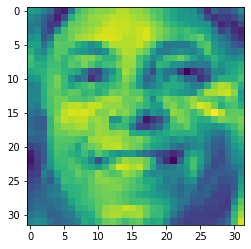

Actual Gender: Female, Actual Age: 50, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 53, Predicted Race: White



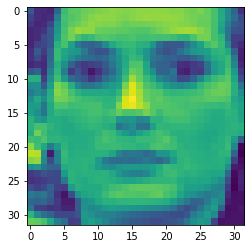

Actual Gender: Female, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: White



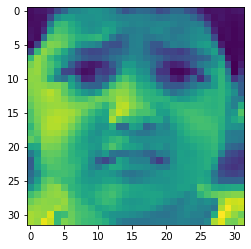

Actual Gender: Female, Actual Age: 4, Actual Race: Indian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: Indian



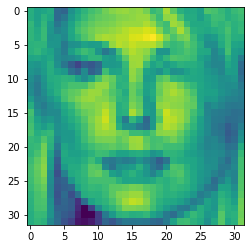

Actual Gender: Female, Actual Age: 25, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 45, Predicted Race: White



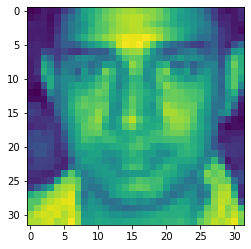

Actual Gender: Male, Actual Age: 28, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: Indian



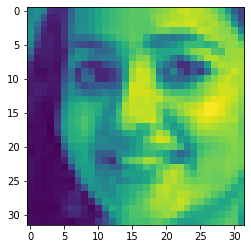

Actual Gender: Female, Actual Age: 23, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Indian



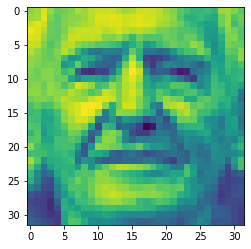

Actual Gender: Male, Actual Age: 82, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 94, Predicted Race: White



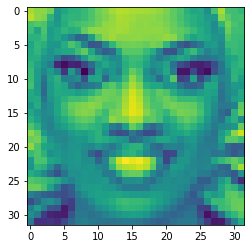

Actual Gender: Female, Actual Age: 32, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 29, Predicted Race: Black



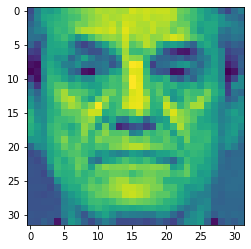

Actual Gender: Male, Actual Age: 72, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 81, Predicted Race: White



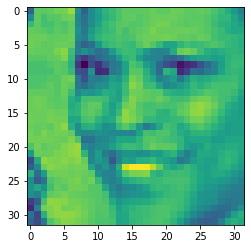

Actual Gender: Male, Actual Age: 60, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 29, Predicted Race: White



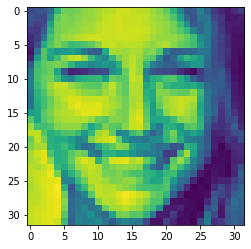

Actual Gender: Female, Actual Age: 18, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: White



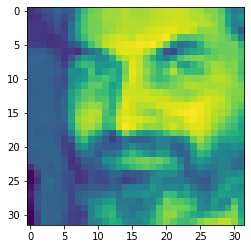

Actual Gender: Male, Actual Age: 45, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 53, Predicted Race: White



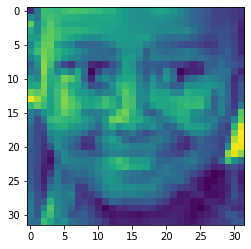

Actual Gender: Female, Actual Age: 6, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Black



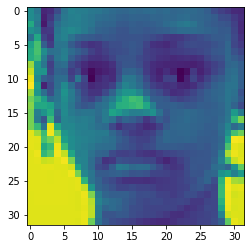

Actual Gender: Female, Actual Age: 10, Actual Race: Black
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 6, Predicted Race: Black



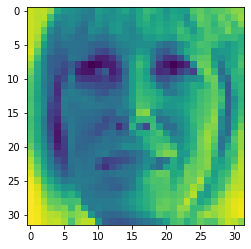

Actual Gender: Female, Actual Age: 60, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 67, Predicted Race: White



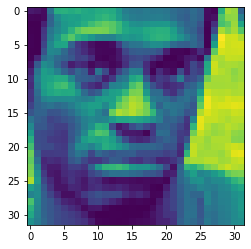

Actual Gender: Male, Actual Age: 28, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Black



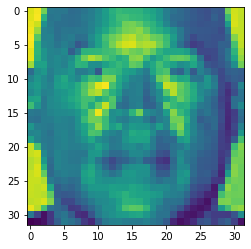

Actual Gender: Male, Actual Age: 47, Actual Race: Black
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Male, Predicted Age: 59, Predicted Race: Black



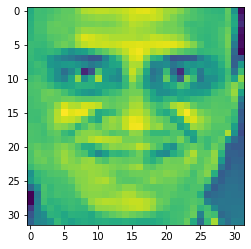

Actual Gender: Male, Actual Age: 45, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 44, Predicted Race: Indian



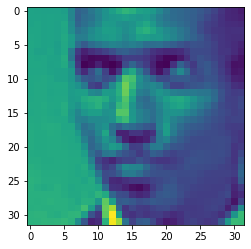

Actual Gender: Male, Actual Age: 29, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Black



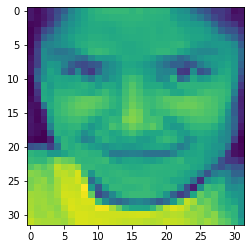

Actual Gender: Female, Actual Age: 6, Actual Race: Others
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: Indian



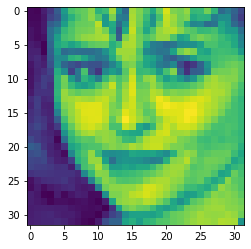

Actual Gender: Female, Actual Age: 38, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Indian



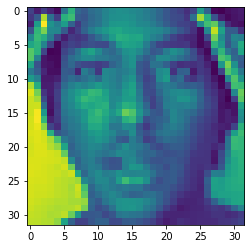

Actual Gender: Male, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: Black



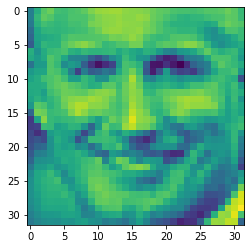

Actual Gender: Male, Actual Age: 54, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 54, Predicted Race: White



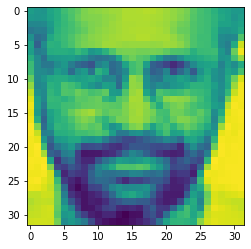

Actual Gender: Male, Actual Age: 47, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 51, Predicted Race: Indian



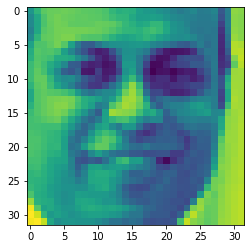

Actual Gender: Male, Actual Age: 50, Actual Race: Indian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 34, Predicted Race: Indian



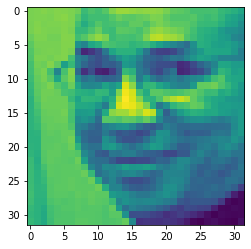

Actual Gender: Male, Actual Age: 52, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 58, Predicted Race: Black



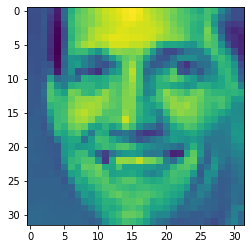

Actual Gender: Male, Actual Age: 32, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: White



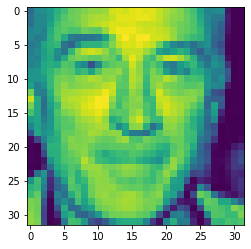

Actual Gender: Male, Actual Age: 61, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 47, Predicted Race: White



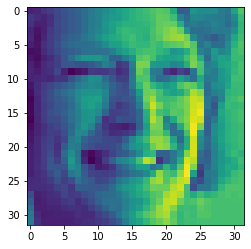

Actual Gender: Female, Actual Age: 70, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 49, Predicted Race: White



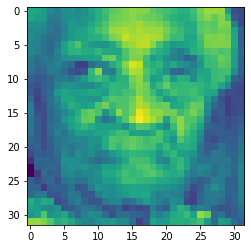

Actual Gender: Female, Actual Age: 85, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 82, Predicted Race: Black



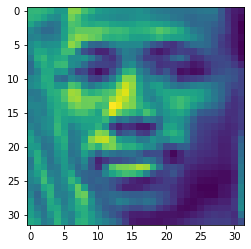

Actual Gender: Male, Actual Age: 19, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Black



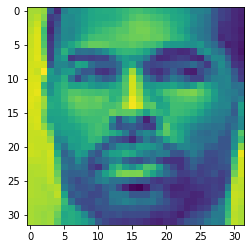

Actual Gender: Male, Actual Age: 40, Actual Race: Black
1/1 [==============================] - 0s 15ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: Black



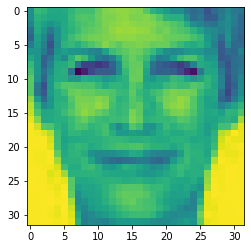

Actual Gender: Female, Actual Age: 58, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 64, Predicted Race: White



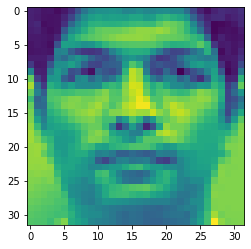

Actual Gender: Male, Actual Age: 22, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: Indian



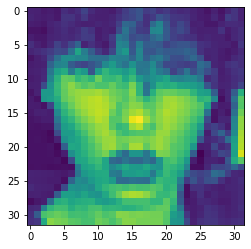

Actual Gender: Female, Actual Age: 22, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 20, Predicted Race: White



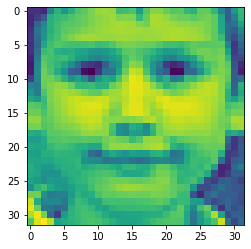

Actual Gender: Male, Actual Age: 7, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: White



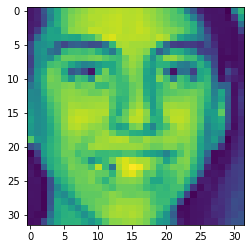

Actual Gender: Female, Actual Age: 15, Actual Race: Others
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Others



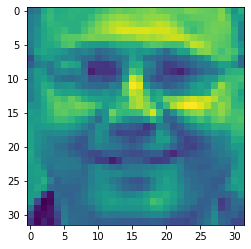

Actual Gender: Male, Actual Age: 65, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 51, Predicted Race: White



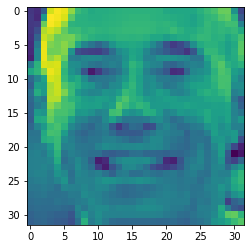

Actual Gender: Male, Actual Age: 67, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 58, Predicted Race: White



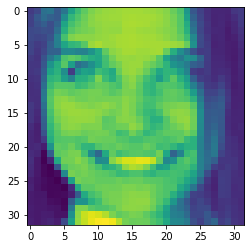

Actual Gender: Female, Actual Age: 24, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: White



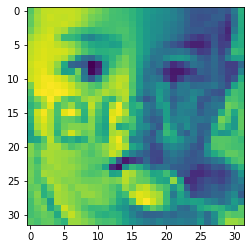

Actual Gender: Male, Actual Age: 3, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 2, Predicted Race: White



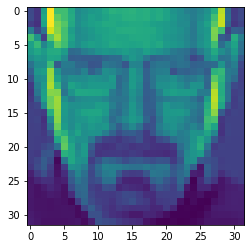

Actual Gender: Male, Actual Age: 58, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 50, Predicted Race: White



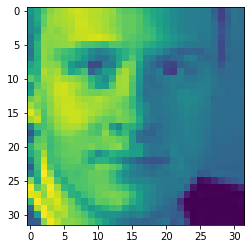

Actual Gender: Male, Actual Age: 28, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 22, Predicted Race: White



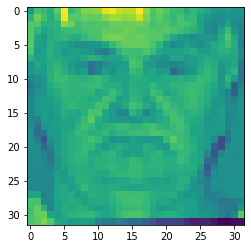

Actual Gender: Male, Actual Age: 58, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 72, Predicted Race: White



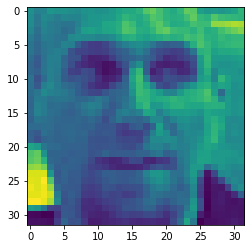

Actual Gender: Male, Actual Age: 46, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 58, Predicted Race: White



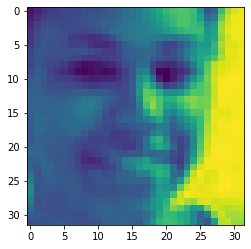

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Black



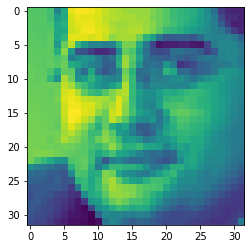

Actual Gender: Male, Actual Age: 32, Actual Race: Others
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 30, Predicted Race: Indian



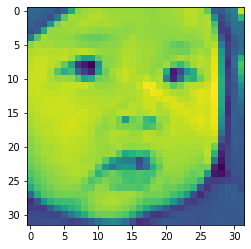

Actual Gender: Male, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: Asian



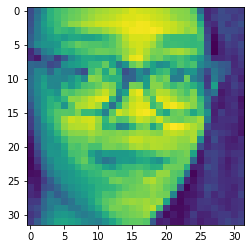

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 28, Predicted Race: Asian



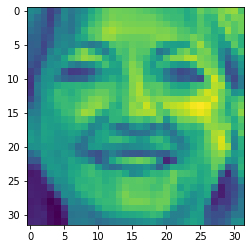

Actual Gender: Female, Actual Age: 50, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 66, Predicted Race: White



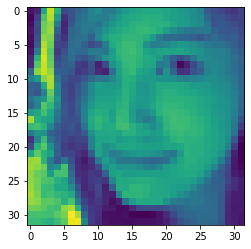

Actual Gender: Female, Actual Age: 30, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 20, Predicted Race: Asian



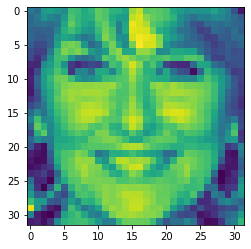

Actual Gender: Female, Actual Age: 66, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 58, Predicted Race: White



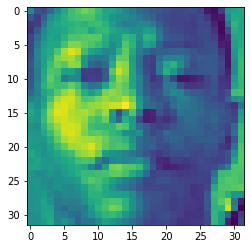

Actual Gender: Male, Actual Age: 21, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 21, Predicted Race: Black



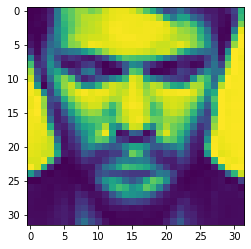

Actual Gender: Male, Actual Age: 30, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: White



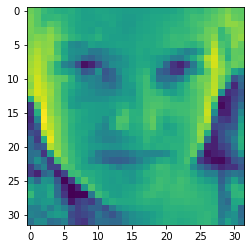

Actual Gender: Female, Actual Age: 10, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 5, Predicted Race: White



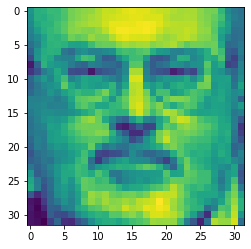

Actual Gender: Male, Actual Age: 60, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 69, Predicted Race: White



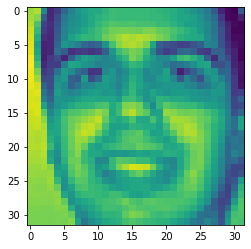

Actual Gender: Male, Actual Age: 25, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Indian



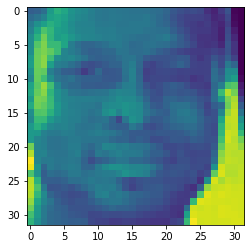

Actual Gender: Male, Actual Age: 22, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 34, Predicted Race: Black



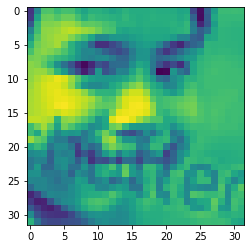

Actual Gender: Male, Actual Age: 9, Actual Race: Asian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 10, Predicted Race: Asian



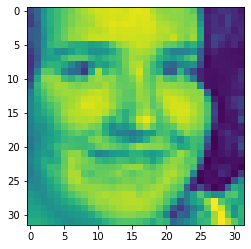

Actual Gender: Female, Actual Age: 17, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: White



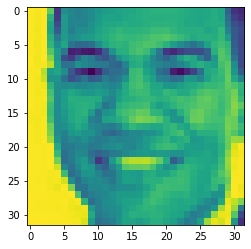

Actual Gender: Male, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: Black



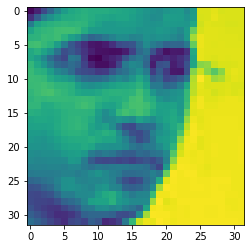

Actual Gender: Male, Actual Age: 26, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: Indian



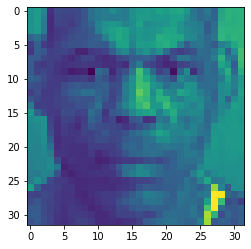

Actual Gender: Male, Actual Age: 48, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 54, Predicted Race: Black



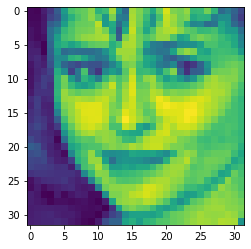

Actual Gender: Female, Actual Age: 38, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Indian



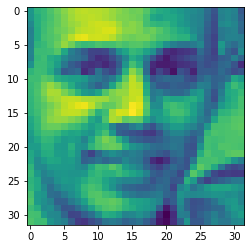

Actual Gender: Male, Actual Age: 27, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Indian



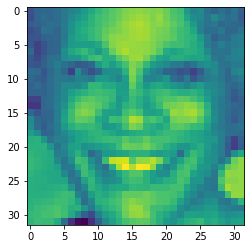

Actual Gender: Female, Actual Age: 54, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 44, Predicted Race: Black



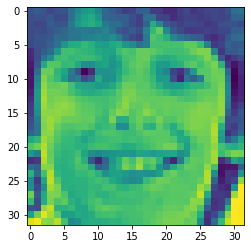

Actual Gender: Male, Actual Age: 9, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 6, Predicted Race: White



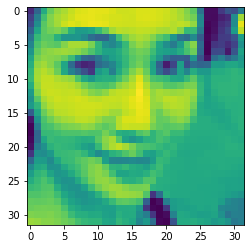

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Asian



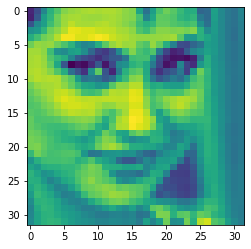

Actual Gender: Female, Actual Age: 35, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Indian



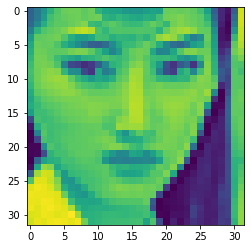

Actual Gender: Female, Actual Age: 27, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



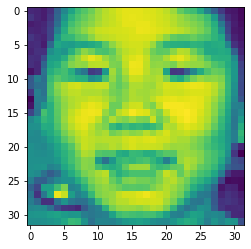

Actual Gender: Male, Actual Age: 8, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 4, Predicted Race: Asian



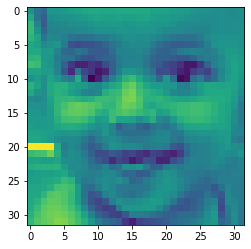

Actual Gender: Male, Actual Age: 2, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 2, Predicted Race: Indian



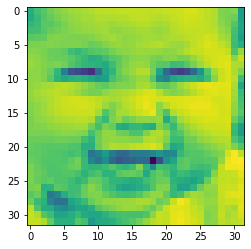

Actual Gender: Male, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 1, Predicted Race: White



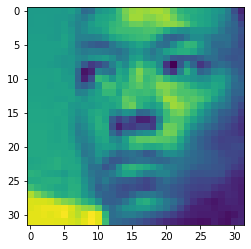

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Black



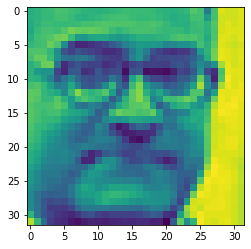

Actual Gender: Male, Actual Age: 54, Actual Race: Others
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 56, Predicted Race: Indian



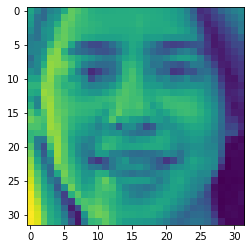

Actual Gender: Female, Actual Age: 16, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: White



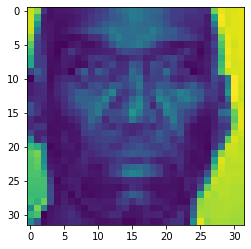

Actual Gender: Male, Actual Age: 42, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 44, Predicted Race: Black



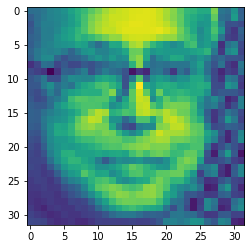

Actual Gender: Male, Actual Age: 51, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 64, Predicted Race: White



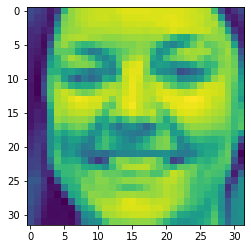

Actual Gender: Female, Actual Age: 32, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 30, Predicted Race: White



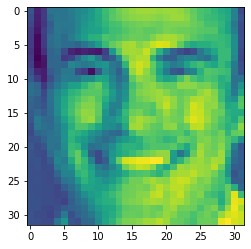

Actual Gender: Male, Actual Age: 28, Actual Race: Others
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 38, Predicted Race: White



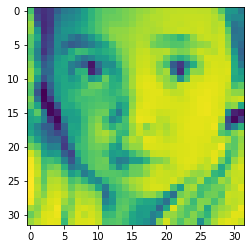

Actual Gender: Female, Actual Age: 6, Actual Race: Others
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: Asian



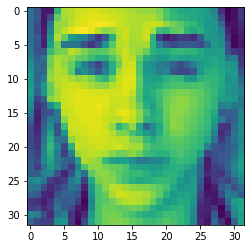

Actual Gender: Male, Actual Age: 15, Actual Race: Others
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 23, Predicted Race: White



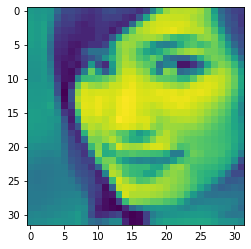

Actual Gender: Female, Actual Age: 23, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Asian



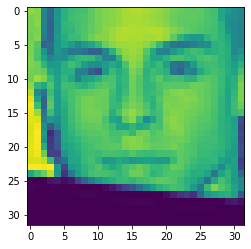

Actual Gender: Male, Actual Age: 25, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 23, Predicted Race: White



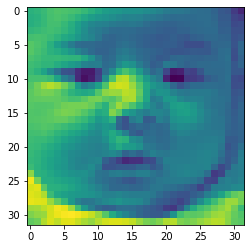

Actual Gender: Male, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 1, Predicted Race: Asian



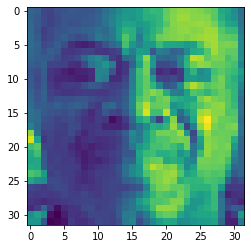

Actual Gender: Male, Actual Age: 62, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 62, Predicted Race: Black



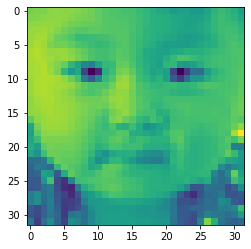

Actual Gender: Female, Actual Age: 2, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 1, Predicted Race: Asian



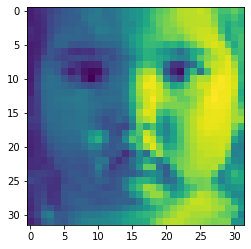

Actual Gender: Female, Actual Age: 4, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: White



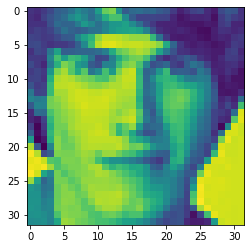

Actual Gender: Male, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 24, Predicted Race: White



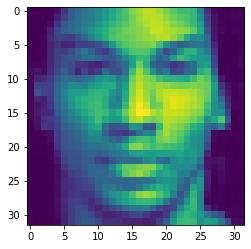

Actual Gender: Male, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 24, Predicted Race: Black



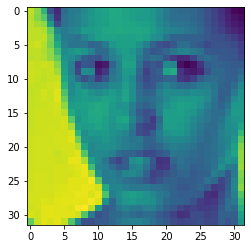

Actual Gender: Female, Actual Age: 31, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Black



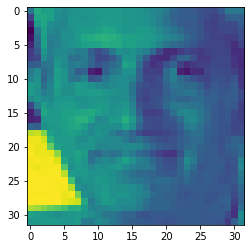

Actual Gender: Male, Actual Age: 56, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 51, Predicted Race: White



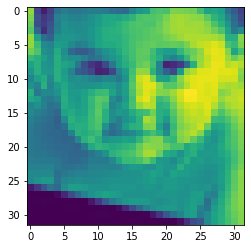

Actual Gender: Male, Actual Age: 1, Actual Race: Indian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 4, Predicted Race: White



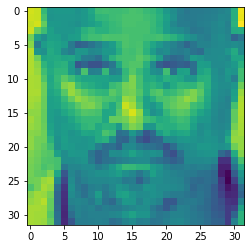

Actual Gender: Male, Actual Age: 35, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 39, Predicted Race: Black



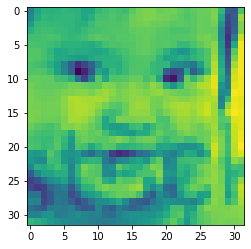

Actual Gender: Female, Actual Age: 3, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: Asian



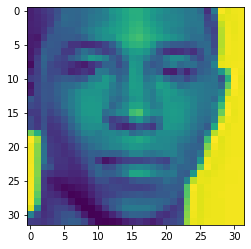

Actual Gender: Male, Actual Age: 19, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 25, Predicted Race: Black



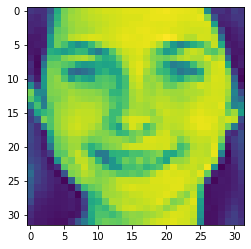

Actual Gender: Female, Actual Age: 15, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 12, Predicted Race: White



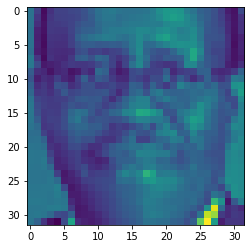

Actual Gender: Male, Actual Age: 58, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 64, Predicted Race: Black



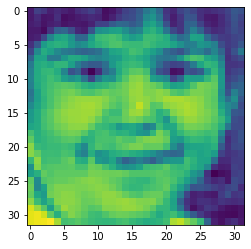

Actual Gender: Female, Actual Age: 6, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: White



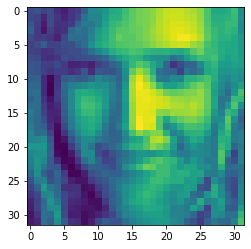

Actual Gender: Female, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: White



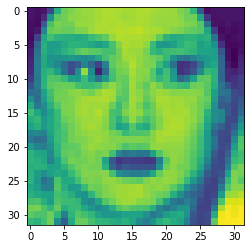

Actual Gender: Female, Actual Age: 32, Actual Race: Asian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Asian



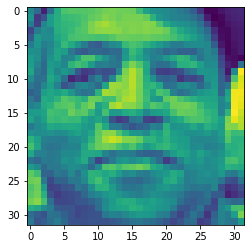

Actual Gender: Male, Actual Age: 56, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 46, Predicted Race: Asian



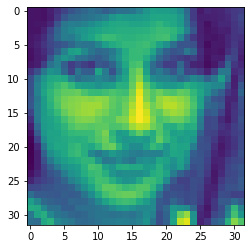

Actual Gender: Female, Actual Age: 25, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Indian



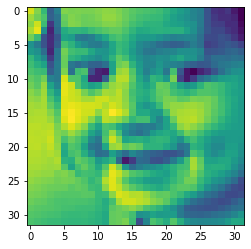

Actual Gender: Female, Actual Age: 2, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: Indian



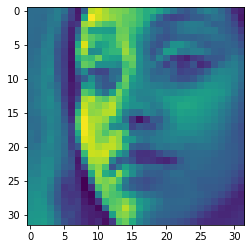

Actual Gender: Female, Actual Age: 29, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Black



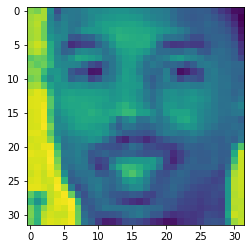

Actual Gender: Male, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Black



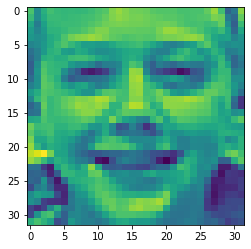

Actual Gender: Male, Actual Age: 13, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 30, Predicted Race: White



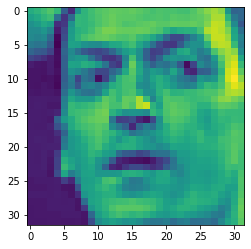

Actual Gender: Male, Actual Age: 25, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: Indian



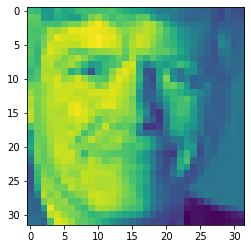

Actual Gender: Male, Actual Age: 61, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 60, Predicted Race: White



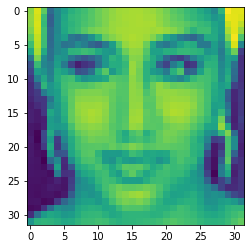

Actual Gender: Female, Actual Age: 28, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Black



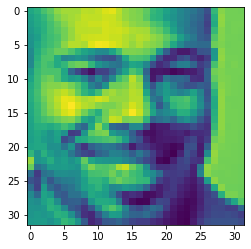

Actual Gender: Male, Actual Age: 38, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 41, Predicted Race: Black



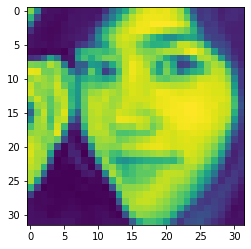

Actual Gender: Female, Actual Age: 25, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Asian



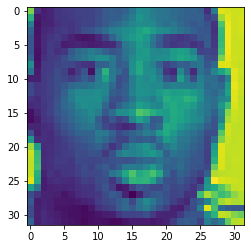

Actual Gender: Male, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: Black



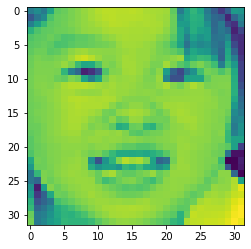

Actual Gender: Female, Actual Age: 3, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 3, Predicted Race: Asian



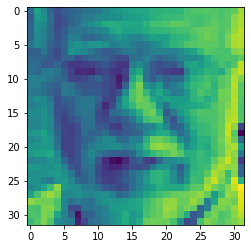

Actual Gender: Male, Actual Age: 80, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 81, Predicted Race: White



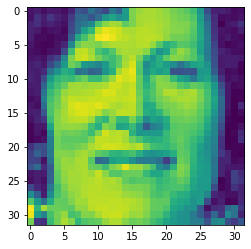

Actual Gender: Female, Actual Age: 43, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 46, Predicted Race: White



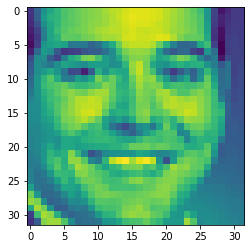

Actual Gender: Male, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: White



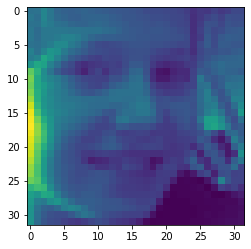

Actual Gender: Male, Actual Age: 15, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 16, Predicted Race: White



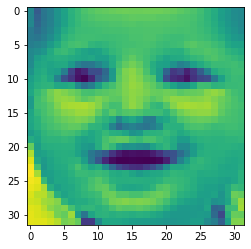

Actual Gender: Male, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 1, Predicted Race: White



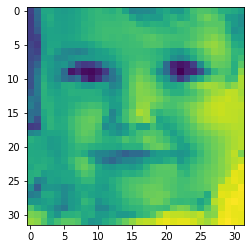

Actual Gender: Female, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 2, Predicted Race: White



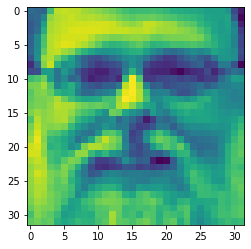

Actual Gender: Male, Actual Age: 49, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 47, Predicted Race: White



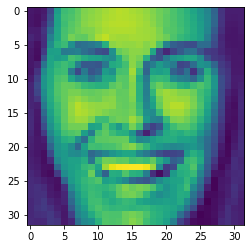

Actual Gender: Female, Actual Age: 30, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 32, Predicted Race: White



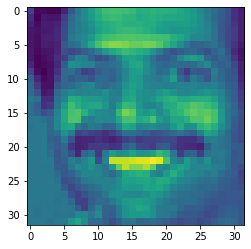

Actual Gender: Male, Actual Age: 34, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 30, Predicted Race: Indian



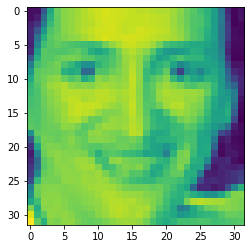

Actual Gender: Female, Actual Age: 32, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 30, Predicted Race: Asian



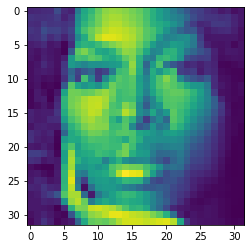

Actual Gender: Female, Actual Age: 32, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Black



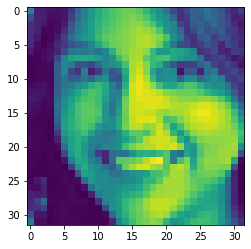

Actual Gender: Female, Actual Age: 25, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Indian



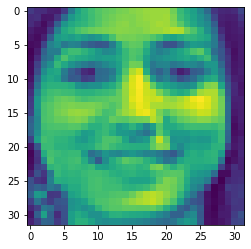

Actual Gender: Female, Actual Age: 26, Actual Race: Indian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Indian



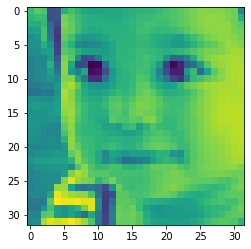

Actual Gender: Male, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: White



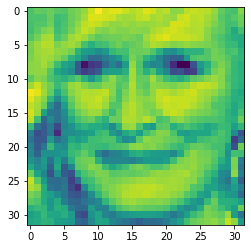

Actual Gender: Female, Actual Age: 67, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 74, Predicted Race: White



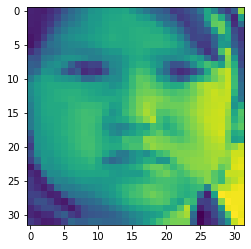

Actual Gender: Female, Actual Age: 4, Actual Race: Others
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: White



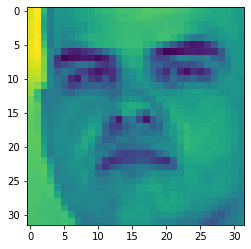

Actual Gender: Male, Actual Age: 25, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 30, Predicted Race: White



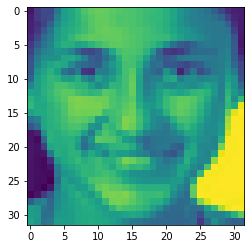

Actual Gender: Female, Actual Age: 16, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 29, Predicted Race: Indian



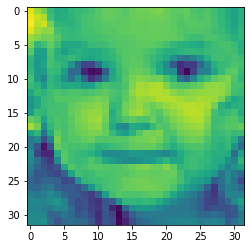

Actual Gender: Female, Actual Age: 3, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: White



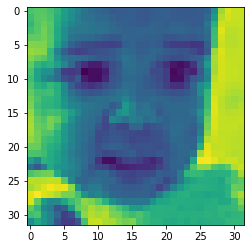

Actual Gender: Male, Actual Age: 1, Actual Race: Others
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 4, Predicted Race: Black



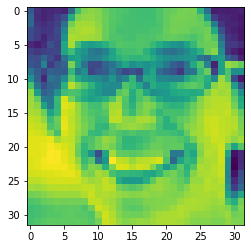

Actual Gender: Female, Actual Age: 32, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Indian



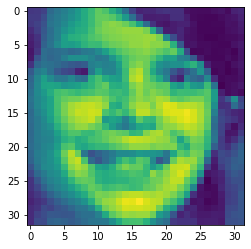

Actual Gender: Female, Actual Age: 13, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 6, Predicted Race: White



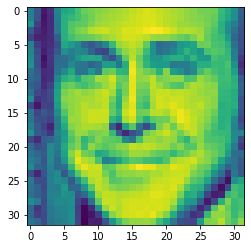

Actual Gender: Male, Actual Age: 30, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 44, Predicted Race: White



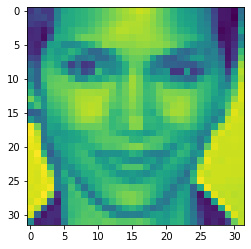

Actual Gender: Female, Actual Age: 22, Actual Race: Others
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Indian



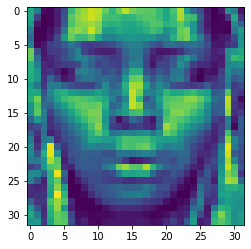

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Black



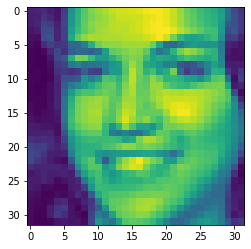

Actual Gender: Female, Actual Age: 24, Actual Race: Others
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Others



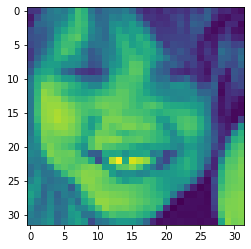

Actual Gender: Female, Actual Age: 8, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 11, Predicted Race: White



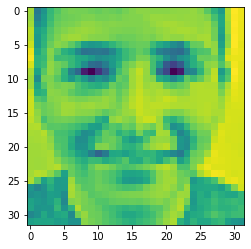

Actual Gender: Male, Actual Age: 13, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 25, Predicted Race: White



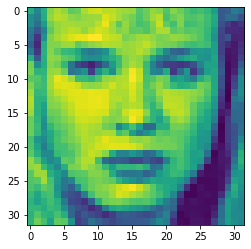

Actual Gender: Female, Actual Age: 21, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: White



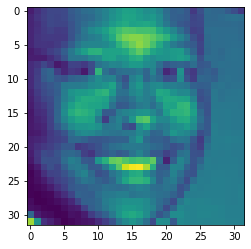

Actual Gender: Male, Actual Age: 40, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 34, Predicted Race: Black



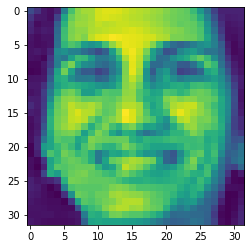

Actual Gender: Female, Actual Age: 52, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 41, Predicted Race: Indian



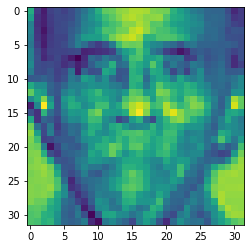

Actual Gender: Male, Actual Age: 63, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 72, Predicted Race: Black



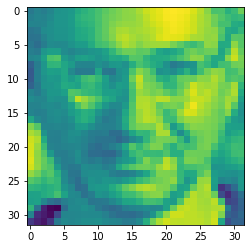

Actual Gender: Male, Actual Age: 45, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 74, Predicted Race: White



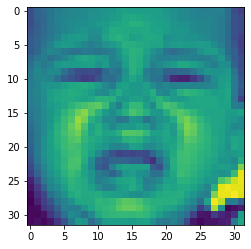

Actual Gender: Female, Actual Age: 1, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 3, Predicted Race: Asian



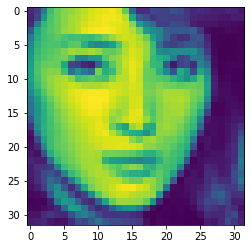

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Asian



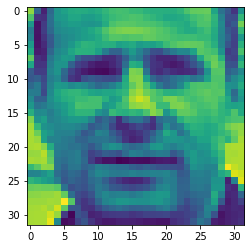

Actual Gender: Male, Actual Age: 36, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 58, Predicted Race: White



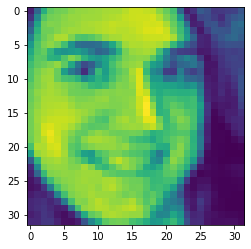

Actual Gender: Female, Actual Age: 17, Actual Race: Others
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: White



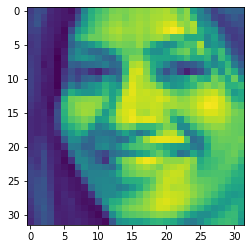

Actual Gender: Female, Actual Age: 26, Actual Race: Indian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Indian



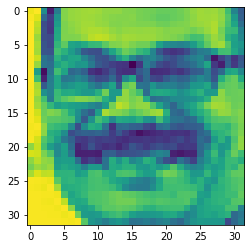

Actual Gender: Male, Actual Age: 49, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 46, Predicted Race: Indian



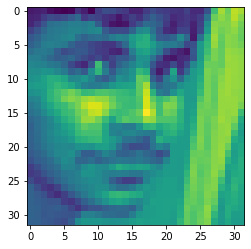

Actual Gender: Male, Actual Age: 32, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: Indian



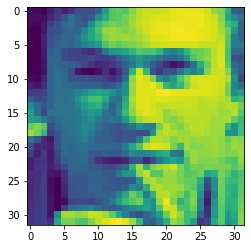

Actual Gender: Male, Actual Age: 23, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: White



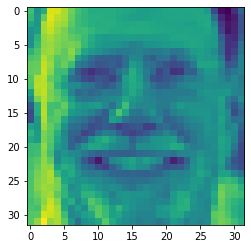

Actual Gender: Male, Actual Age: 60, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 62, Predicted Race: White



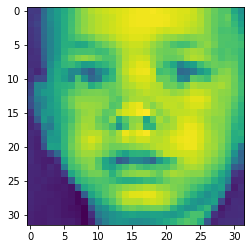

Actual Gender: Male, Actual Age: 8, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: White



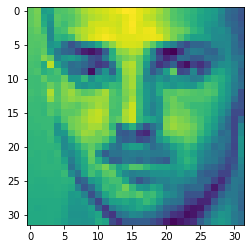

Actual Gender: Male, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: White



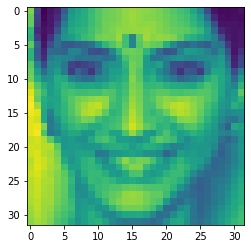

Actual Gender: Female, Actual Age: 26, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 30, Predicted Race: Indian



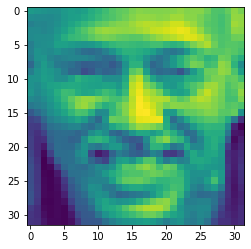

Actual Gender: Male, Actual Age: 65, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 56, Predicted Race: Black



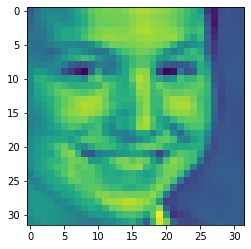

Actual Gender: Male, Actual Age: 14, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 11, Predicted Race: White



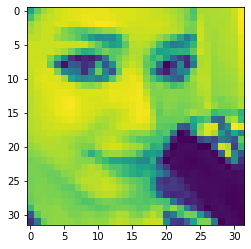

Actual Gender: Female, Actual Age: 27, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Asian



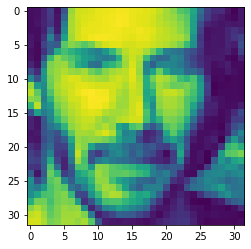

Actual Gender: Male, Actual Age: 45, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: White



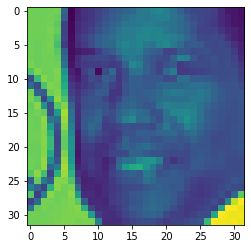

Actual Gender: Male, Actual Age: 52, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 39, Predicted Race: Black



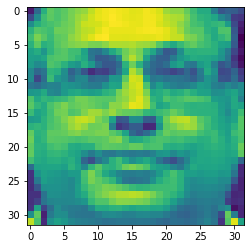

Actual Gender: Male, Actual Age: 50, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 49, Predicted Race: Indian



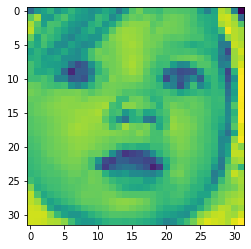

Actual Gender: Female, Actual Age: 2, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: Asian



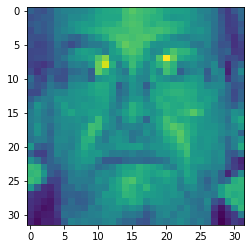

Actual Gender: Male, Actual Age: 53, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 59, Predicted Race: White



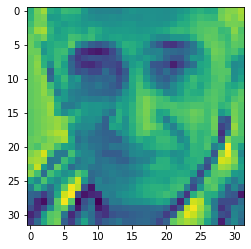

Actual Gender: Male, Actual Age: 75, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 72, Predicted Race: White



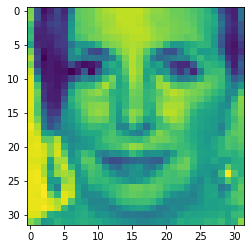

Actual Gender: Female, Actual Age: 58, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 39, Predicted Race: White



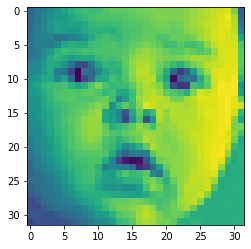

Actual Gender: Male, Actual Age: 1, Actual Race: Others
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 1, Predicted Race: Asian



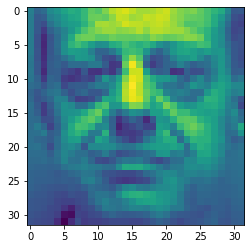

Actual Gender: Male, Actual Age: 56, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 58, Predicted Race: White



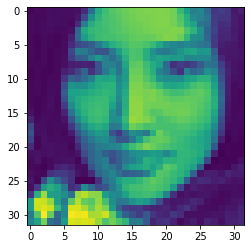

Actual Gender: Female, Actual Age: 27, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 21, Predicted Race: Asian



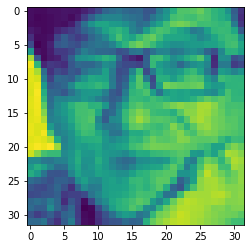

Actual Gender: Male, Actual Age: 50, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 44, Predicted Race: Asian



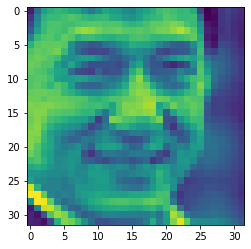

Actual Gender: Male, Actual Age: 43, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 49, Predicted Race: Asian



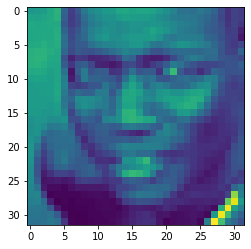

Actual Gender: Male, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: Black



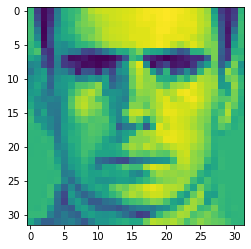

Actual Gender: Male, Actual Age: 40, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 30, Predicted Race: White



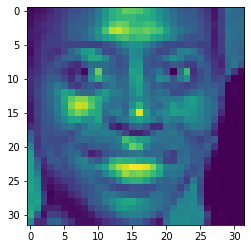

Actual Gender: Female, Actual Age: 31, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 33, Predicted Race: Black



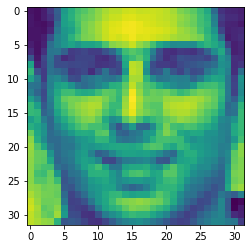

Actual Gender: Male, Actual Age: 35, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: Indian



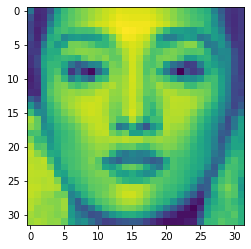

Actual Gender: Female, Actual Age: 25, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



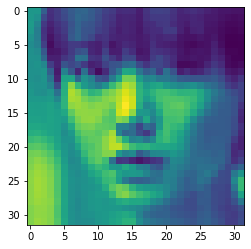

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Asian



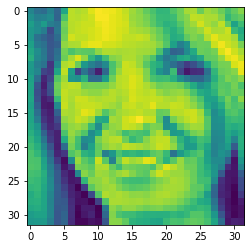

Actual Gender: Female, Actual Age: 40, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 39, Predicted Race: White



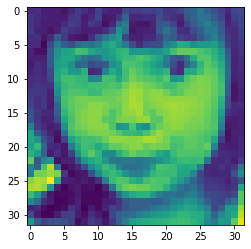

Actual Gender: Female, Actual Age: 4, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: Asian



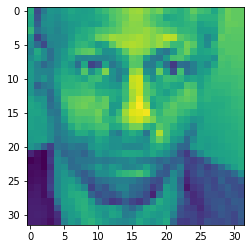

Actual Gender: Male, Actual Age: 55, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 51, Predicted Race: Black



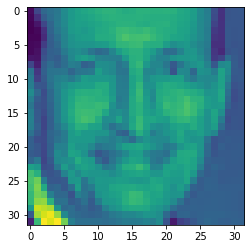

Actual Gender: Male, Actual Age: 50, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 52, Predicted Race: White



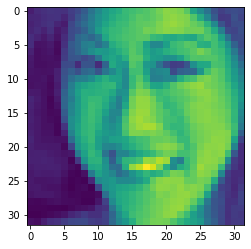

Actual Gender: Female, Actual Age: 35, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Asian



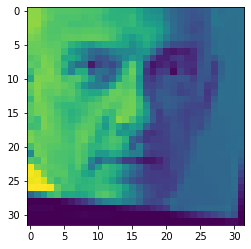

Actual Gender: Male, Actual Age: 53, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 55, Predicted Race: White



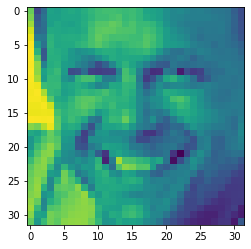

Actual Gender: Male, Actual Age: 50, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 40, Predicted Race: White



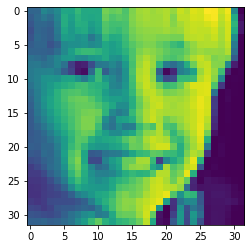

Actual Gender: Male, Actual Age: 4, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: White



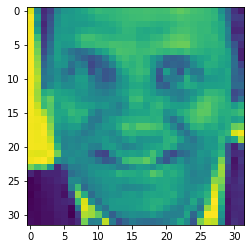

Actual Gender: Male, Actual Age: 45, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 42, Predicted Race: Black



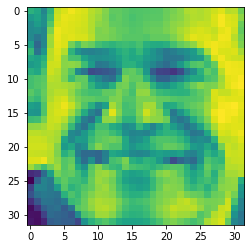

Actual Gender: Male, Actual Age: 70, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 68, Predicted Race: White



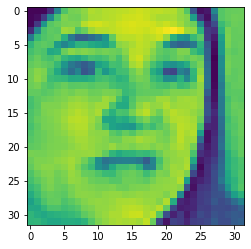

Actual Gender: Female, Actual Age: 35, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 29, Predicted Race: Indian



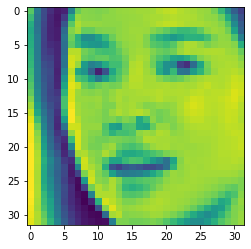

Actual Gender: Female, Actual Age: 26, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 18, Predicted Race: Asian



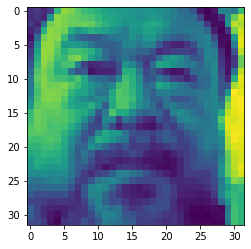

Actual Gender: Male, Actual Age: 55, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 55, Predicted Race: Asian



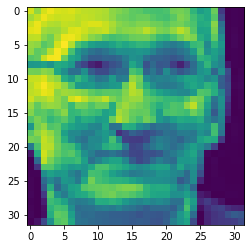

Actual Gender: Male, Actual Age: 54, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 70, Predicted Race: White



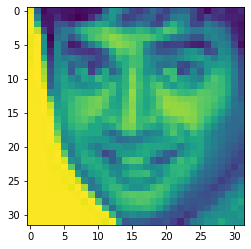

Actual Gender: Male, Actual Age: 26, Actual Race: Indian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 23, Predicted Race: Indian



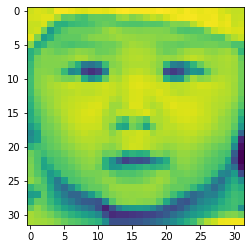

Actual Gender: Female, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 0, Predicted Race: Asian



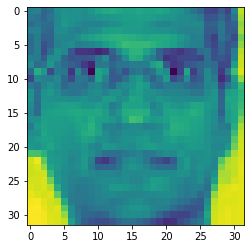

Actual Gender: Male, Actual Age: 45, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 30, Predicted Race: Indian



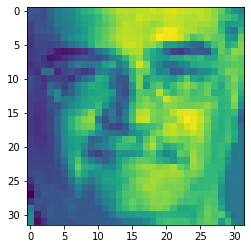

Actual Gender: Male, Actual Age: 65, Actual Race: White
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 57, Predicted Race: White



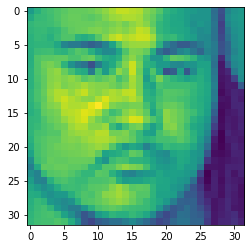

Actual Gender: Male, Actual Age: 28, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 33, Predicted Race: Asian



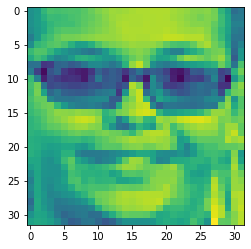

Actual Gender: Male, Actual Age: 14, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 17, Predicted Race: Indian



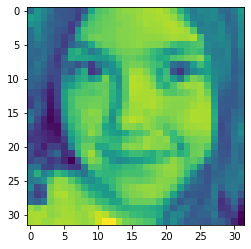

Actual Gender: Female, Actual Age: 10, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 8, Predicted Race: White



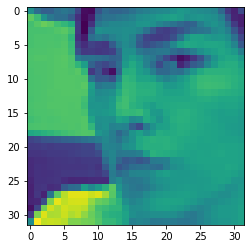

Actual Gender: Male, Actual Age: 23, Actual Race: Asian
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Asian



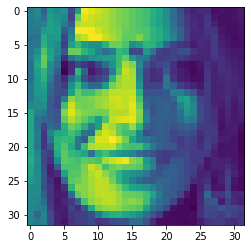

Actual Gender: Female, Actual Age: 26, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 39, Predicted Race: White



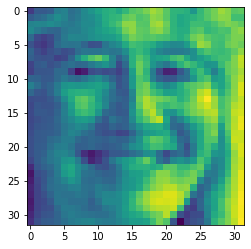

Actual Gender: Female, Actual Age: 45, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 66, Predicted Race: White



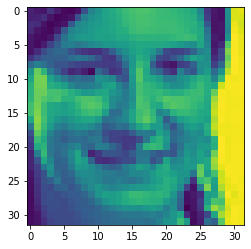

Actual Gender: Female, Actual Age: 27, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: White



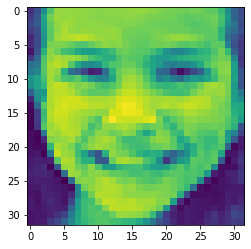

Actual Gender: Female, Actual Age: 12, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 5, Predicted Race: White



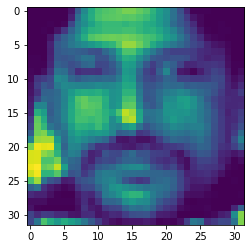

Actual Gender: Male, Actual Age: 26, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: Indian



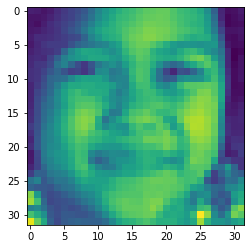

Actual Gender: Female, Actual Age: 4, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 7, Predicted Race: Asian



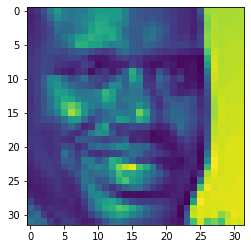

Actual Gender: Male, Actual Age: 31, Actual Race: Black
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 37, Predicted Race: Black



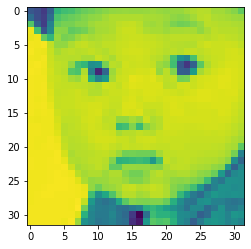

Actual Gender: Female, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 2, Predicted Race: Asian



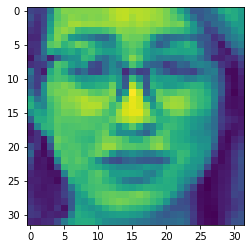

Actual Gender: Female, Actual Age: 24, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: White



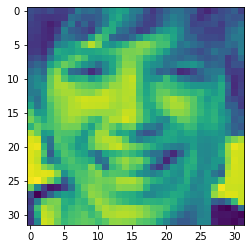

Actual Gender: Male, Actual Age: 12, Actual Race: White
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: White



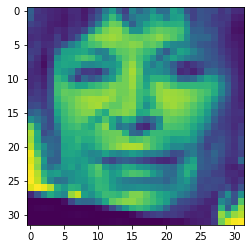

Actual Gender: Female, Actual Age: 35, Actual Race: Others
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 57, Predicted Race: White



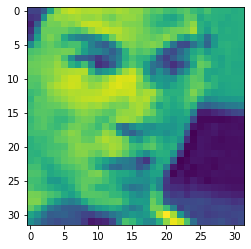

Actual Gender: Male, Actual Age: 35, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 33, Predicted Race: Asian



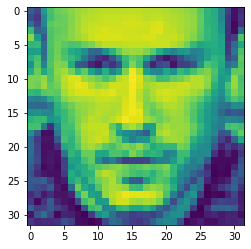

Actual Gender: Male, Actual Age: 30, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: White



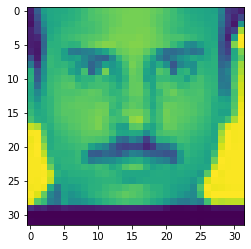

Actual Gender: Male, Actual Age: 26, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Indian



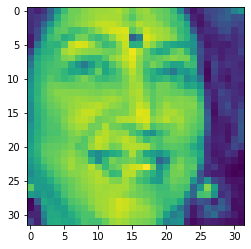

Actual Gender: Female, Actual Age: 50, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 41, Predicted Race: Indian



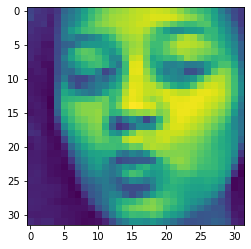

Actual Gender: Female, Actual Age: 20, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 14, Predicted Race: Black



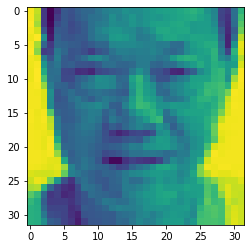

Actual Gender: Male, Actual Age: 75, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 67, Predicted Race: Asian



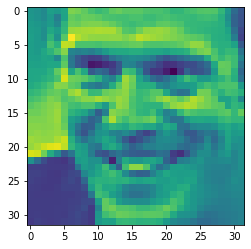

Actual Gender: Male, Actual Age: 37, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 46, Predicted Race: White



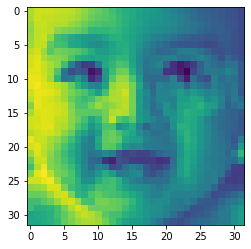

Actual Gender: Male, Actual Age: 2, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: Indian



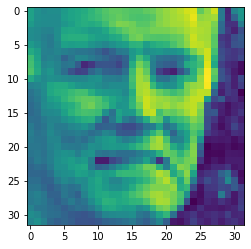

Actual Gender: Male, Actual Age: 64, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 74, Predicted Race: White



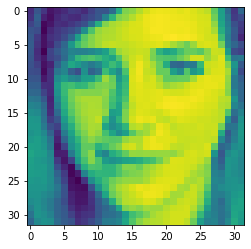

Actual Gender: Female, Actual Age: 18, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: White



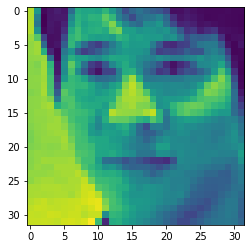

Actual Gender: Male, Actual Age: 27, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Asian



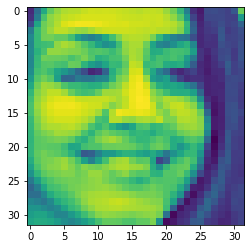

Actual Gender: Female, Actual Age: 25, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Indian



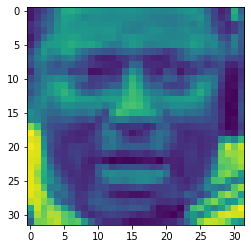

Actual Gender: Male, Actual Age: 35, Actual Race: Black
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 44, Predicted Race: Black



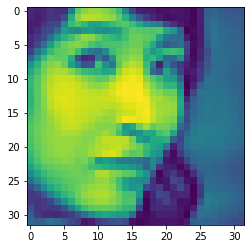

Actual Gender: Female, Actual Age: 23, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



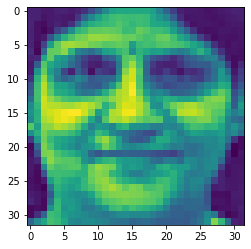

Actual Gender: Female, Actual Age: 55, Actual Race: Indian
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 43, Predicted Race: Indian



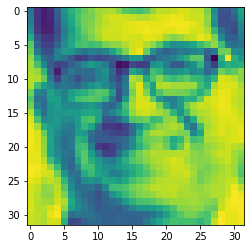

Actual Gender: Male, Actual Age: 40, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 48, Predicted Race: White



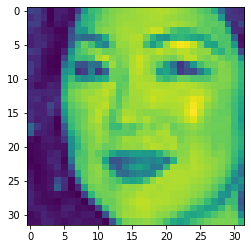

Actual Gender: Female, Actual Age: 32, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 29, Predicted Race: Asian



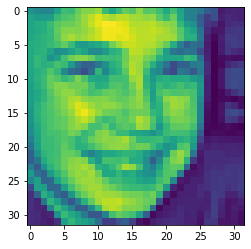

Actual Gender: Male, Actual Age: 13, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: White



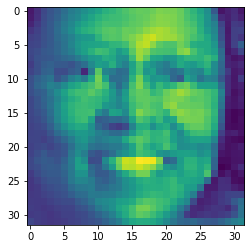

Actual Gender: Female, Actual Age: 45, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 46, Predicted Race: Black



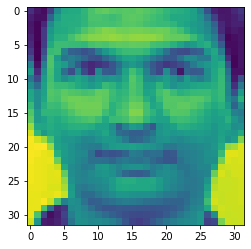

Actual Gender: Male, Actual Age: 28, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: Indian



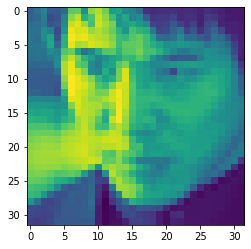

Actual Gender: Male, Actual Age: 32, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Asian



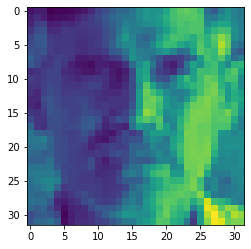

Actual Gender: Male, Actual Age: 52, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 58, Predicted Race: White



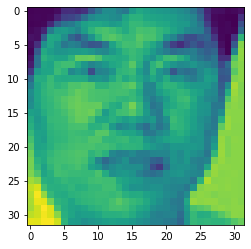

Actual Gender: Male, Actual Age: 42, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 46, Predicted Race: Asian



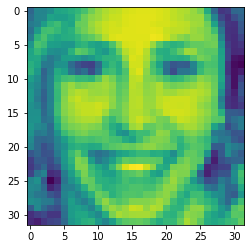

Actual Gender: Female, Actual Age: 29, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 29, Predicted Race: White



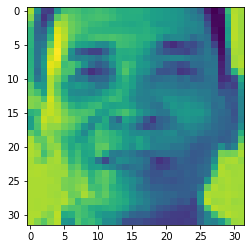

Actual Gender: Male, Actual Age: 75, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 58, Predicted Race: Asian



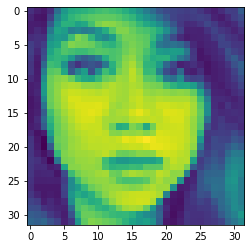

Actual Gender: Female, Actual Age: 20, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Asian



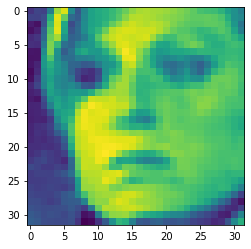

Actual Gender: Female, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 34, Predicted Race: White



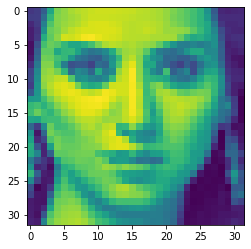

Actual Gender: Female, Actual Age: 27, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Indian



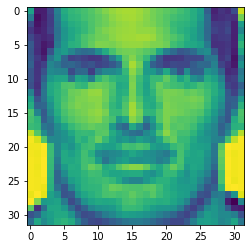

Actual Gender: Male, Actual Age: 28, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: White



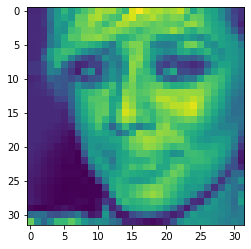

Actual Gender: Female, Actual Age: 38, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 32, Predicted Race: Black



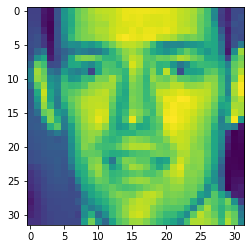

Actual Gender: Male, Actual Age: 28, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: White



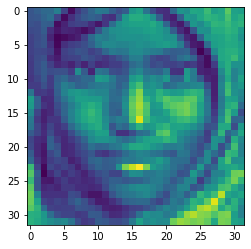

Actual Gender: Female, Actual Age: 16, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Black



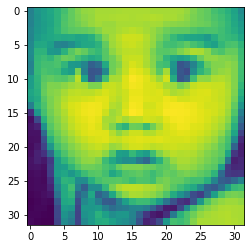

Actual Gender: Male, Actual Age: 1, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 1, Predicted Race: Indian



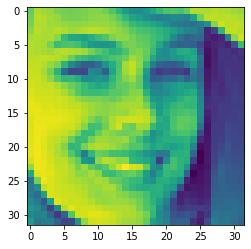

Actual Gender: Female, Actual Age: 16, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: White



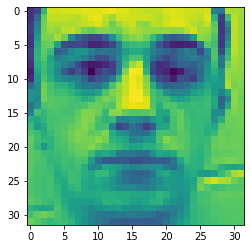

Actual Gender: Male, Actual Age: 27, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: White



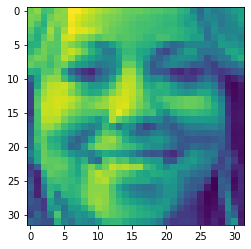

Actual Gender: Female, Actual Age: 45, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 32, Predicted Race: White



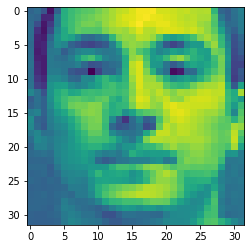

Actual Gender: Male, Actual Age: 32, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: White



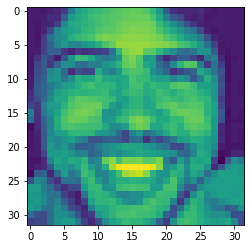

Actual Gender: Male, Actual Age: 21, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: White



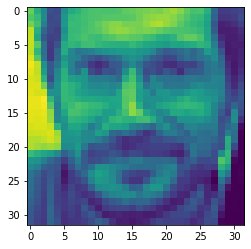

Actual Gender: Male, Actual Age: 54, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 43, Predicted Race: White



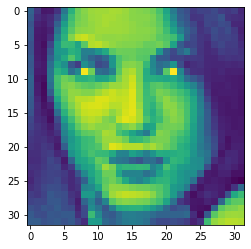

Actual Gender: Female, Actual Age: 21, Actual Race: Others
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: White



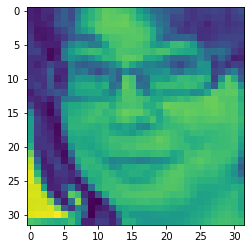

Actual Gender: Female, Actual Age: 47, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 28, Predicted Race: White



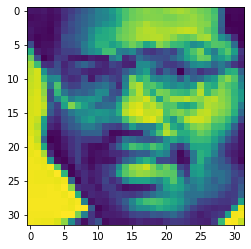

Actual Gender: Male, Actual Age: 40, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 40, Predicted Race: Black



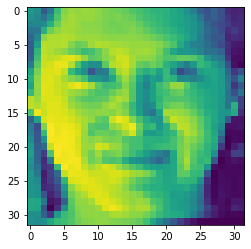

Actual Gender: Female, Actual Age: 19, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 15, Predicted Race: White



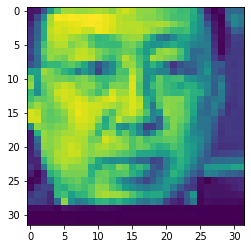

Actual Gender: Male, Actual Age: 54, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 51, Predicted Race: Asian



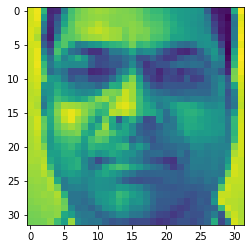

Actual Gender: Male, Actual Age: 42, Actual Race: Indian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 37, Predicted Race: Indian



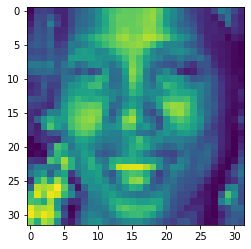

Actual Gender: Female, Actual Age: 29, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 34, Predicted Race: Black



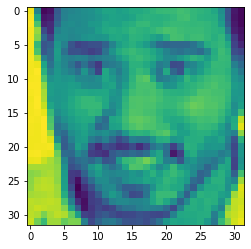

Actual Gender: Male, Actual Age: 35, Actual Race: Asian
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: Indian



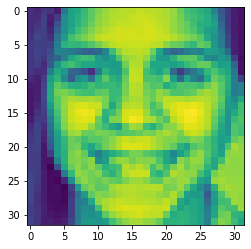

Actual Gender: Female, Actual Age: 15, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 20, Predicted Race: Others



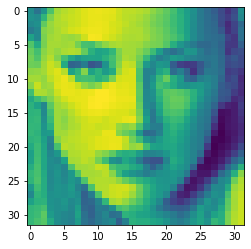

Actual Gender: Female, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: White



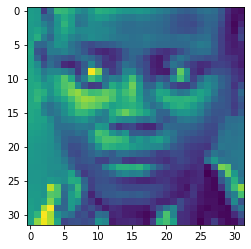

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 13, Predicted Race: Black



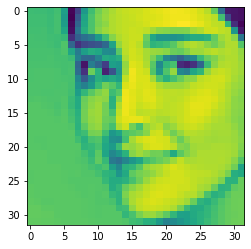

Actual Gender: Female, Actual Age: 23, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 21, Predicted Race: Asian



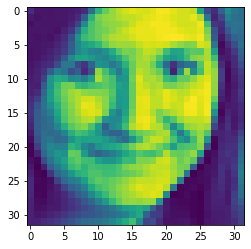

Actual Gender: Female, Actual Age: 16, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 16, Predicted Race: White



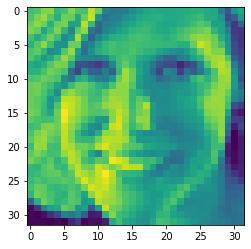

Actual Gender: Female, Actual Age: 33, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 34, Predicted Race: White



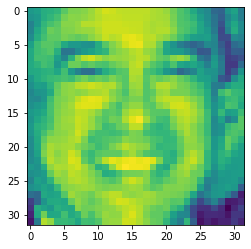

Actual Gender: Male, Actual Age: 40, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 39, Predicted Race: White



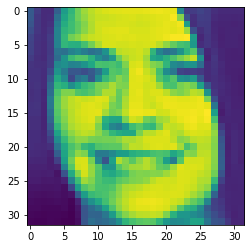

Actual Gender: Female, Actual Age: 23, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: White



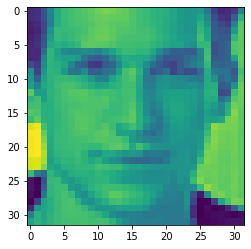

Actual Gender: Male, Actual Age: 18, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 23, Predicted Race: White



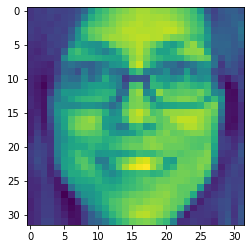

Actual Gender: Female, Actual Age: 29, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: White



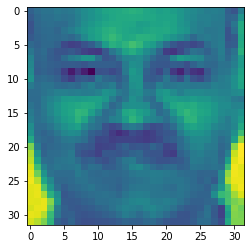

Actual Gender: Male, Actual Age: 50, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 40, Predicted Race: Indian



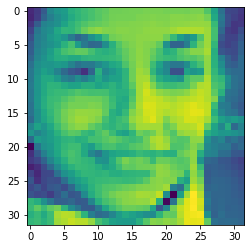

Actual Gender: Female, Actual Age: 23, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Indian



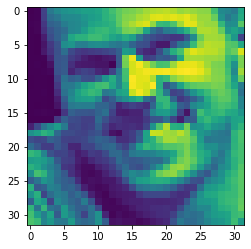

Actual Gender: Male, Actual Age: 37, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 40, Predicted Race: Black



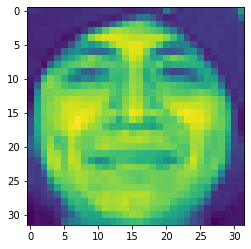

Actual Gender: Male, Actual Age: 33, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 36, Predicted Race: Asian



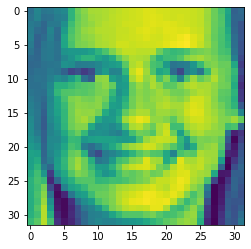

Actual Gender: Male, Actual Age: 17, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: White



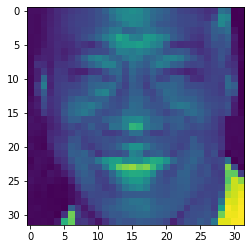

Actual Gender: Male, Actual Age: 40, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 46, Predicted Race: Black



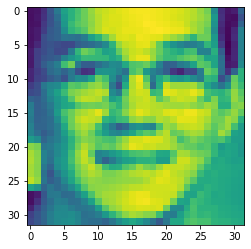

Actual Gender: Male, Actual Age: 15, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 19, Predicted Race: Asian



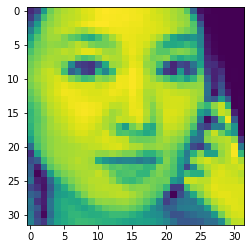

Actual Gender: Female, Actual Age: 28, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



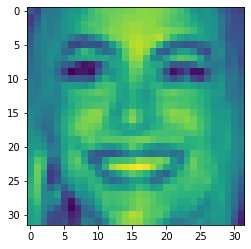

Actual Gender: Female, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 33, Predicted Race: White



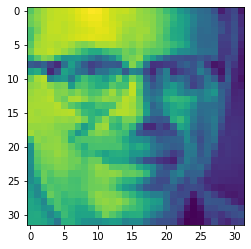

Actual Gender: Male, Actual Age: 70, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 55, Predicted Race: White



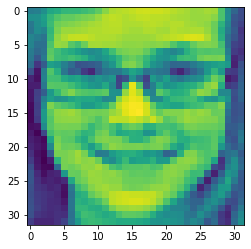

Actual Gender: Female, Actual Age: 14, Actual Race: White
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Female, Predicted Age: 11, Predicted Race: White



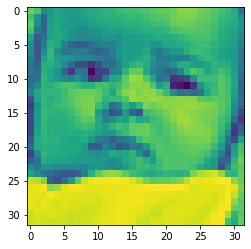

Actual Gender: Male, Actual Age: 1, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 1, Predicted Race: White



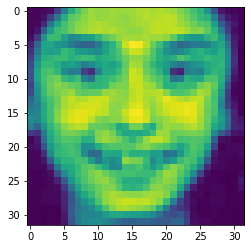

Actual Gender: Female, Actual Age: 8, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 17, Predicted Race: Indian



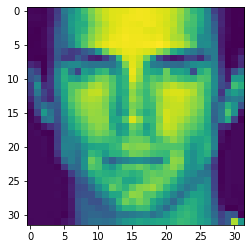

Actual Gender: Male, Actual Age: 23, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: White



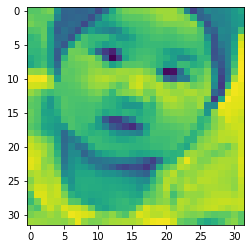

Actual Gender: Male, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: Asian



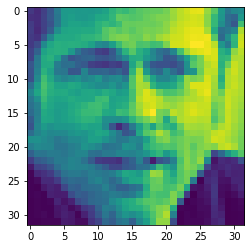

Actual Gender: Male, Actual Age: 45, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 53, Predicted Race: Indian



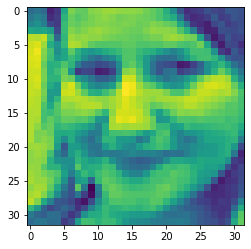

Actual Gender: Female, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: White



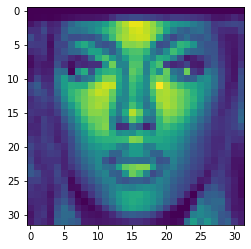

Actual Gender: Female, Actual Age: 28, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Black



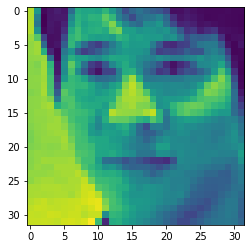

Actual Gender: Male, Actual Age: 27, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Asian



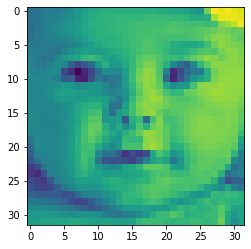

Actual Gender: Female, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 1, Predicted Race: White



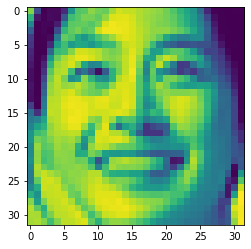

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 31, Predicted Race: Asian



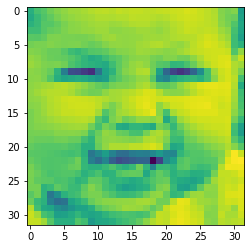

Actual Gender: Male, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 1, Predicted Race: White



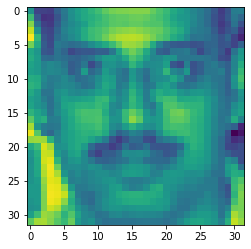

Actual Gender: Male, Actual Age: 55, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 36, Predicted Race: Indian



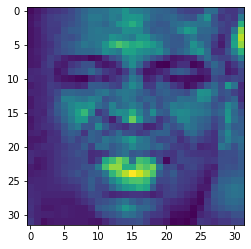

Actual Gender: Male, Actual Age: 40, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 34, Predicted Race: Black



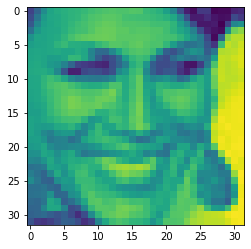

Actual Gender: Female, Actual Age: 42, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 40, Predicted Race: White



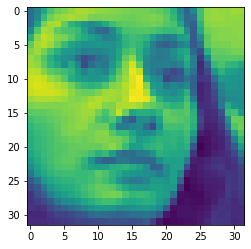

Actual Gender: Female, Actual Age: 21, Actual Race: White
1/1 [==============================] - 0s 26ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Indian



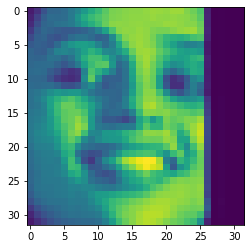

Actual Gender: Male, Actual Age: 53, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Black



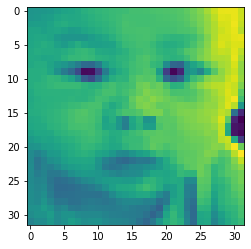

Actual Gender: Male, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Male, Predicted Age: 0, Predicted Race: Asian



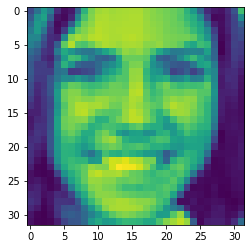

Actual Gender: Female, Actual Age: 20, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: White



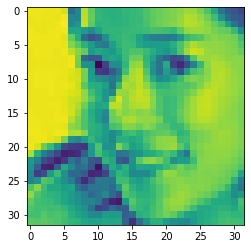

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Asian



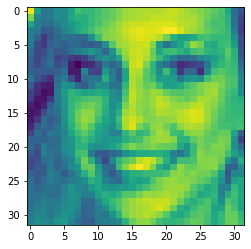

Actual Gender: Female, Actual Age: 27, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 28, Predicted Race: White



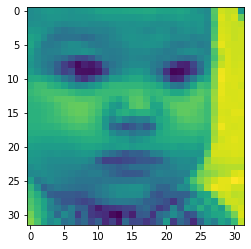

Actual Gender: Female, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: Others



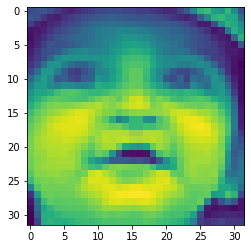

Actual Gender: Female, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: Indian



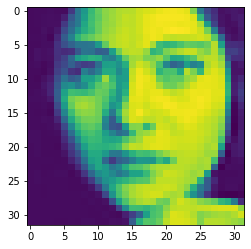

Actual Gender: Female, Actual Age: 27, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Indian



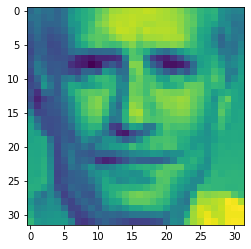

Actual Gender: Male, Actual Age: 52, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 53, Predicted Race: White



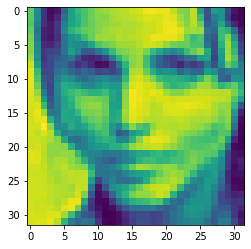

Actual Gender: Female, Actual Age: 32, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: White



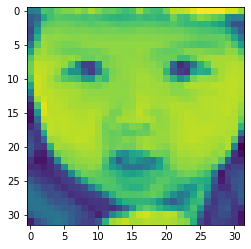

Actual Gender: Female, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 2, Predicted Race: Asian



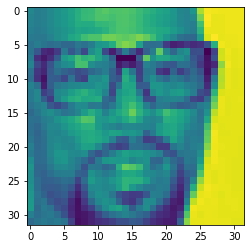

Actual Gender: Male, Actual Age: 35, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 44, Predicted Race: Black



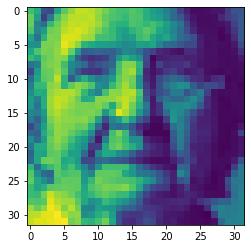

Actual Gender: Female, Actual Age: 84, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 70, Predicted Race: White



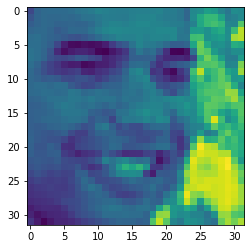

Actual Gender: Male, Actual Age: 37, Actual Race: Others
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 44, Predicted Race: White



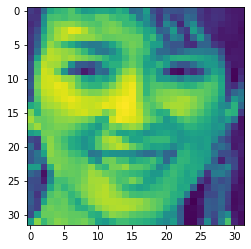

Actual Gender: Female, Actual Age: 27, Actual Race: Asian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



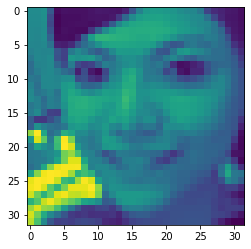

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Asian



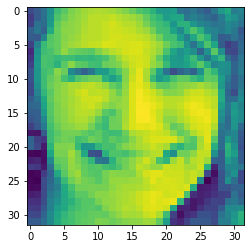

Actual Gender: Female, Actual Age: 42, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: White



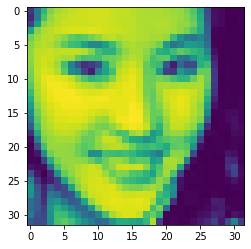

Actual Gender: Female, Actual Age: 22, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



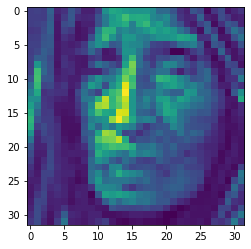

Actual Gender: Female, Actual Age: 110, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 73, Predicted Race: Black



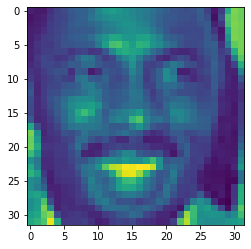

Actual Gender: Male, Actual Age: 46, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 36, Predicted Race: Black



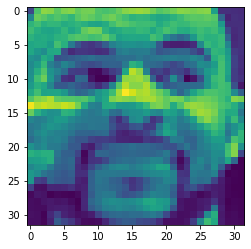

Actual Gender: Male, Actual Age: 34, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 56, Predicted Race: Black



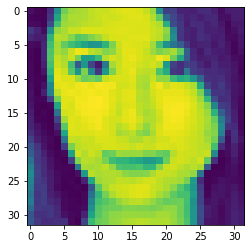

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 32ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Asian



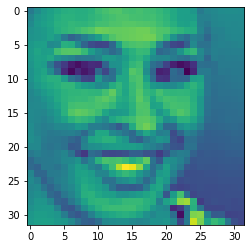

Actual Gender: Female, Actual Age: 32, Actual Race: Black
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 29, Predicted Race: Black



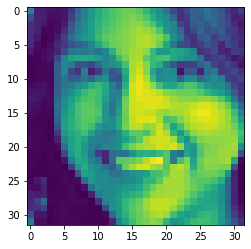

Actual Gender: Female, Actual Age: 25, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Indian



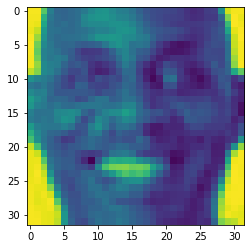

Actual Gender: Male, Actual Age: 45, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 46, Predicted Race: Black



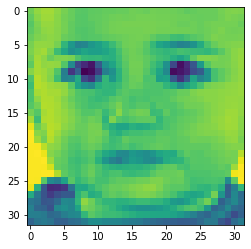

Actual Gender: Male, Actual Age: 2, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 2, Predicted Race: White



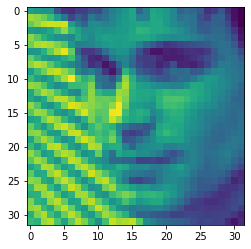

Actual Gender: Male, Actual Age: 24, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 23, Predicted Race: Indian



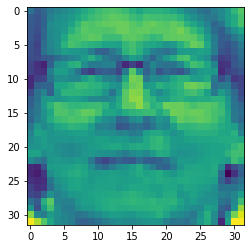

Actual Gender: Female, Actual Age: 57, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 62, Predicted Race: White



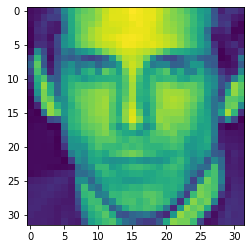

Actual Gender: Male, Actual Age: 40, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: White



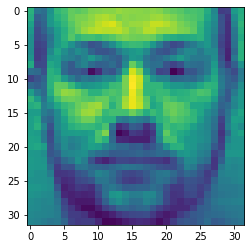

Actual Gender: Male, Actual Age: 30, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 35, Predicted Race: White



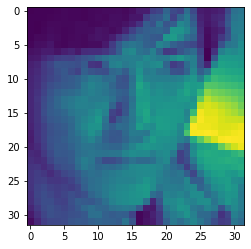

Actual Gender: Male, Actual Age: 35, Actual Race: Asian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: Asian



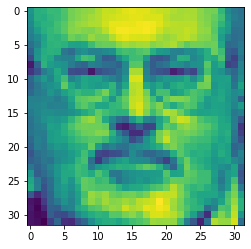

Actual Gender: Male, Actual Age: 60, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 69, Predicted Race: White



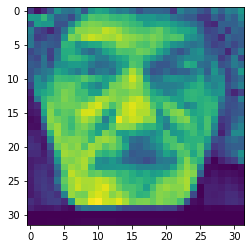

Actual Gender: Male, Actual Age: 73, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 69, Predicted Race: White



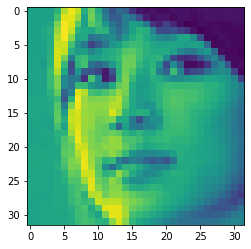

Actual Gender: Female, Actual Age: 27, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 20, Predicted Race: Asian



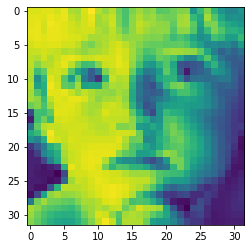

Actual Gender: Male, Actual Age: 4, Actual Race: White
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: White



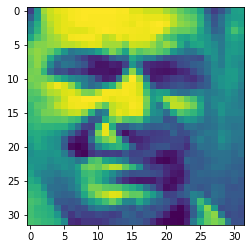

Actual Gender: Male, Actual Age: 40, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 50, Predicted Race: Indian



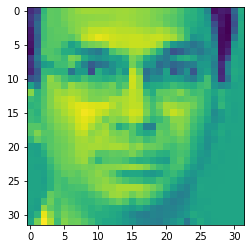

Actual Gender: Male, Actual Age: 37, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: Indian



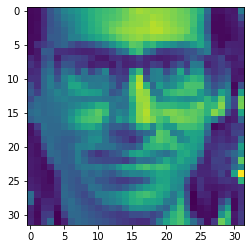

Actual Gender: Male, Actual Age: 45, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 40, Predicted Race: White



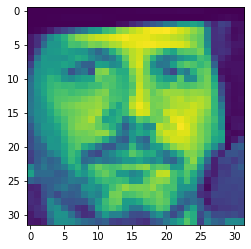

Actual Gender: Male, Actual Age: 39, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 38, Predicted Race: White



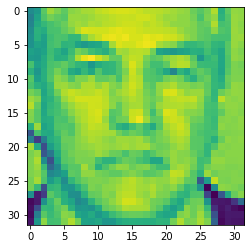

Actual Gender: Male, Actual Age: 8, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 71, Predicted Race: White



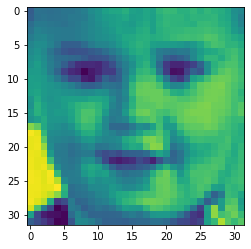

Actual Gender: Male, Actual Age: 6, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 3, Predicted Race: White



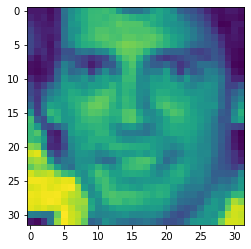

Actual Gender: Male, Actual Age: 27, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: White



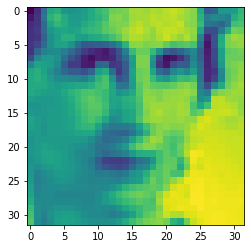

Actual Gender: Male, Actual Age: 30, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 29, Predicted Race: White



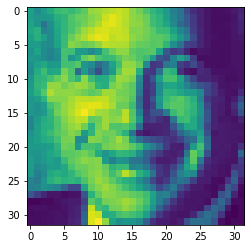

Actual Gender: Male, Actual Age: 54, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 54, Predicted Race: White



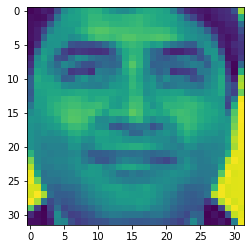

Actual Gender: Male, Actual Age: 30, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: Indian



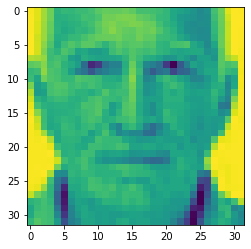

Actual Gender: Male, Actual Age: 83, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 80, Predicted Race: White



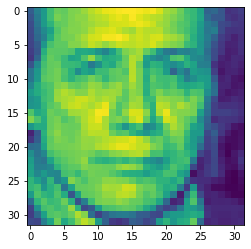

Actual Gender: Male, Actual Age: 53, Actual Race: Others
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Male, Predicted Age: 67, Predicted Race: White



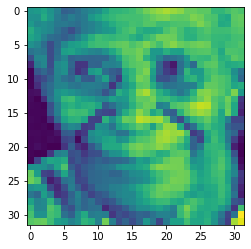

Actual Gender: Female, Actual Age: 88, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 87, Predicted Race: Black



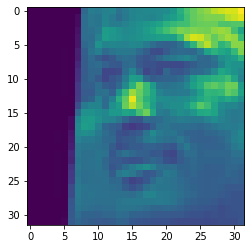

Actual Gender: Male, Actual Age: 35, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 44, Predicted Race: Black



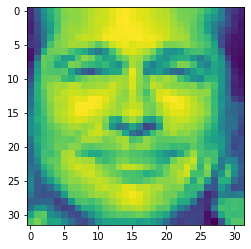

Actual Gender: Male, Actual Age: 50, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 45, Predicted Race: White



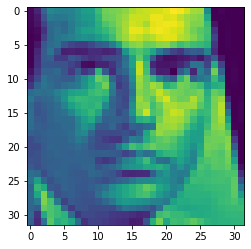

Actual Gender: Male, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 33, Predicted Race: White



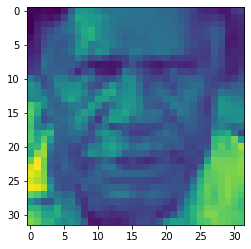

Actual Gender: Male, Actual Age: 76, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 69, Predicted Race: Black



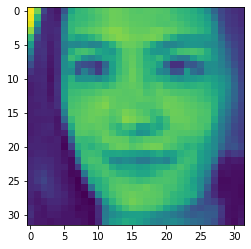

Actual Gender: Female, Actual Age: 26, Actual Race: Asian
1/1 [==============================] - 0s 26ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Asian



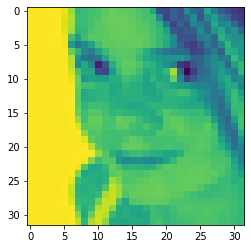

Actual Gender: Female, Actual Age: 8, Actual Race: White
1/1 [==============================] - 0s 30ms/step
Predicted Gender: Female, Predicted Age: 12, Predicted Race: White



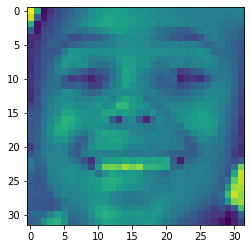

Actual Gender: Male, Actual Age: 7, Actual Race: Black
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Male, Predicted Age: 17, Predicted Race: Black



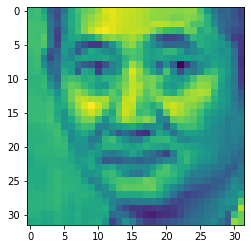

Actual Gender: Male, Actual Age: 50, Actual Race: Asian
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 44, Predicted Race: Asian



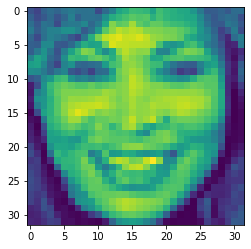

Actual Gender: Female, Actual Age: 72, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 35, Predicted Race: White



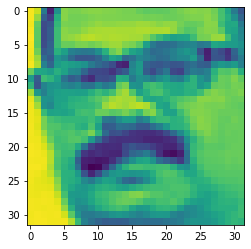

Actual Gender: Male, Actual Age: 46, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 37, Predicted Race: Indian



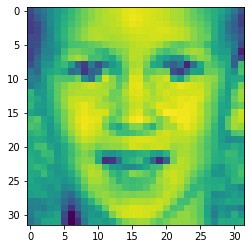

Actual Gender: Male, Actual Age: 5, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: White



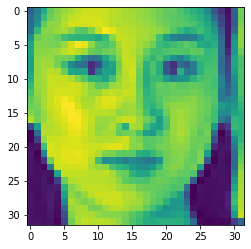

Actual Gender: Female, Actual Age: 28, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Asian



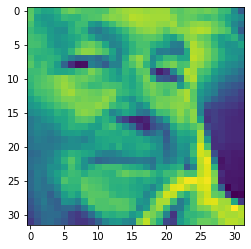

Actual Gender: Female, Actual Age: 79, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 78, Predicted Race: White



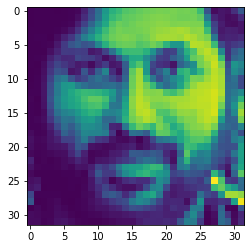

Actual Gender: Male, Actual Age: 36, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 35, Predicted Race: Indian



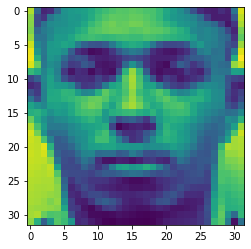

Actual Gender: Male, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 25, Predicted Race: Black



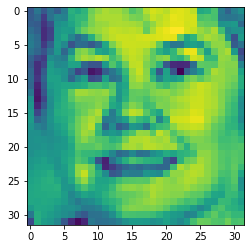

Actual Gender: Female, Actual Age: 60, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 35, Predicted Race: White



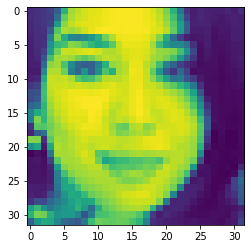

Actual Gender: Female, Actual Age: 30, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



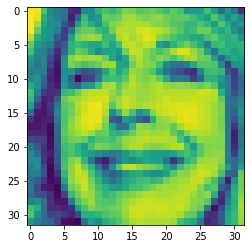

Actual Gender: Female, Actual Age: 65, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 58, Predicted Race: White



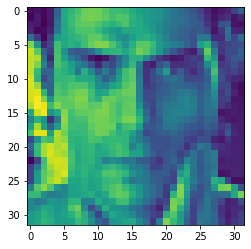

Actual Gender: Male, Actual Age: 29, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: Indian



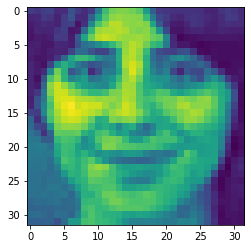

Actual Gender: Female, Actual Age: 29, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: White



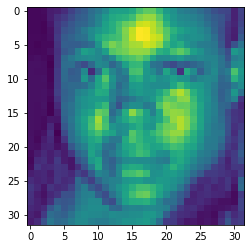

Actual Gender: Female, Actual Age: 32, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 30, Predicted Race: Black



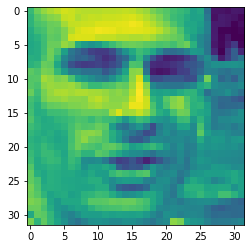

Actual Gender: Male, Actual Age: 30, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: White



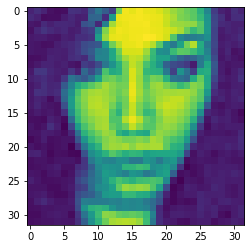

Actual Gender: Female, Actual Age: 35, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Black



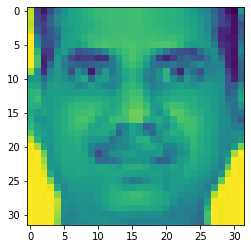

Actual Gender: Male, Actual Age: 34, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Indian



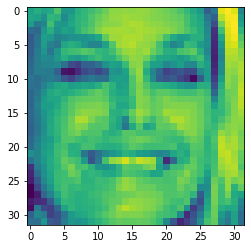

Actual Gender: Female, Actual Age: 65, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 40, Predicted Race: White



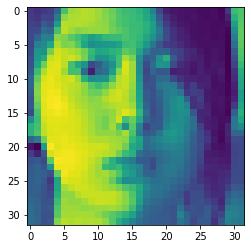

Actual Gender: Female, Actual Age: 23, Actual Race: Asian
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



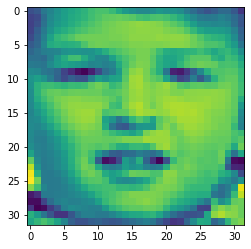

Actual Gender: Male, Actual Age: 7, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 4, Predicted Race: White



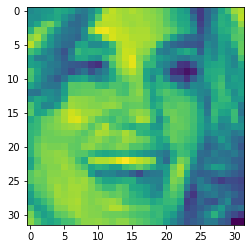

Actual Gender: Female, Actual Age: 60, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 37, Predicted Race: White



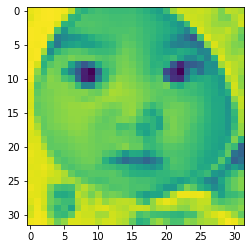

Actual Gender: Male, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 1, Predicted Race: Asian



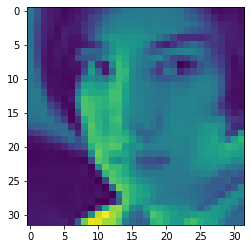

Actual Gender: Female, Actual Age: 27, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Asian



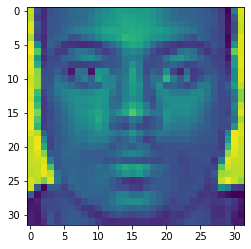

Actual Gender: Male, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 25, Predicted Race: Black



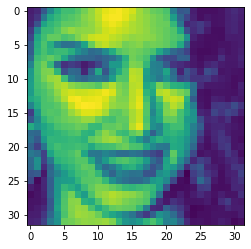

Actual Gender: Female, Actual Age: 29, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Indian



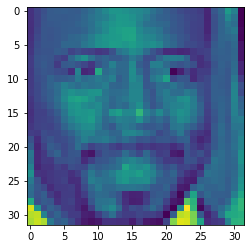

Actual Gender: Male, Actual Age: 52, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 44, Predicted Race: Black



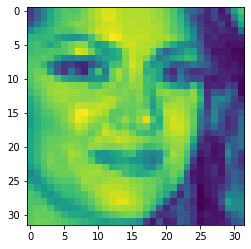

Actual Gender: Female, Actual Age: 28, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 30, Predicted Race: Indian



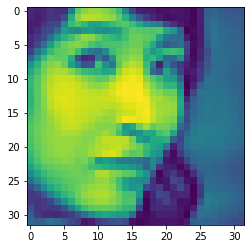

Actual Gender: Female, Actual Age: 23, Actual Race: Asian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



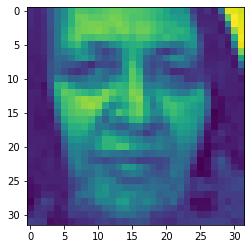

Actual Gender: Female, Actual Age: 65, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 58, Predicted Race: Black



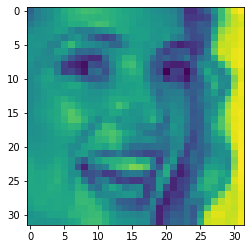

Actual Gender: Female, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 31, Predicted Race: Black



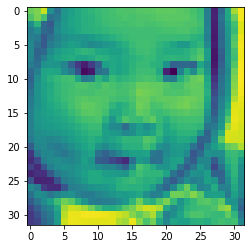

Actual Gender: Male, Actual Age: 2, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: Asian



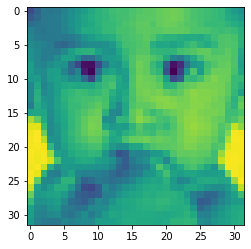

Actual Gender: Male, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 1, Predicted Race: Asian



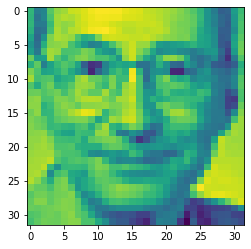

Actual Gender: Male, Actual Age: 63, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 65, Predicted Race: White



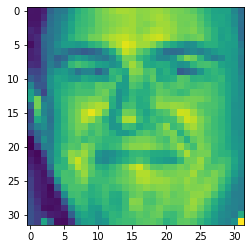

Actual Gender: Male, Actual Age: 29, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 52, Predicted Race: White



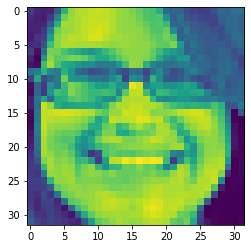

Actual Gender: Female, Actual Age: 28, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: White



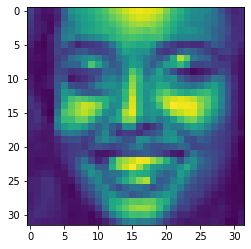

Actual Gender: Female, Actual Age: 27, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 31, Predicted Race: Black



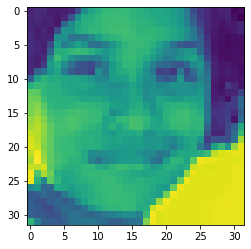

Actual Gender: Female, Actual Age: 8, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 11, Predicted Race: Indian



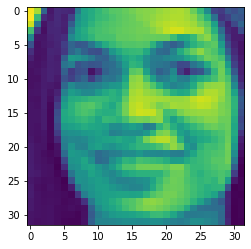

Actual Gender: Female, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Indian



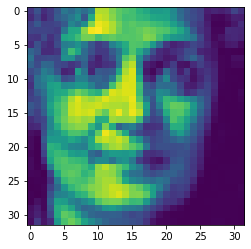

Actual Gender: Female, Actual Age: 42, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 44, Predicted Race: Indian



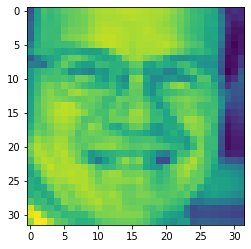

Actual Gender: Male, Actual Age: 45, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 53, Predicted Race: White



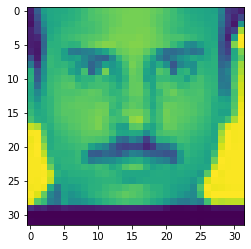

Actual Gender: Male, Actual Age: 26, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Indian



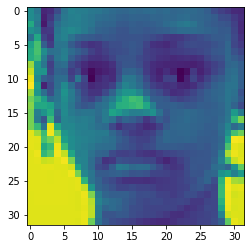

Actual Gender: Female, Actual Age: 10, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 6, Predicted Race: Black



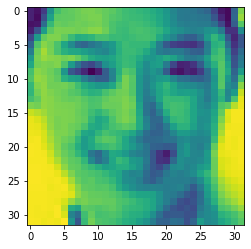

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Asian



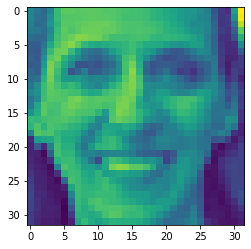

Actual Gender: Female, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 41, Predicted Race: White



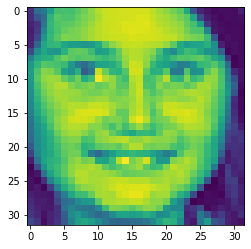

Actual Gender: Female, Actual Age: 12, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 10, Predicted Race: Indian



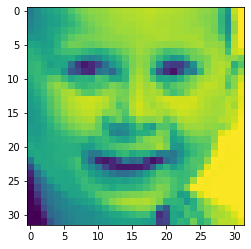

Actual Gender: Male, Actual Age: 4, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 3, Predicted Race: White



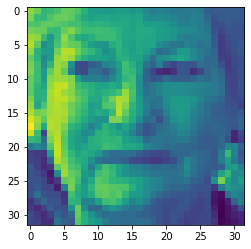

Actual Gender: Female, Actual Age: 83, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 66, Predicted Race: White



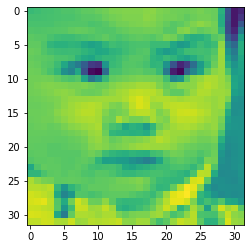

Actual Gender: Female, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: Asian



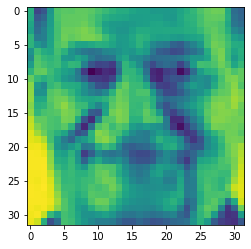

Actual Gender: Male, Actual Age: 67, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 71, Predicted Race: White



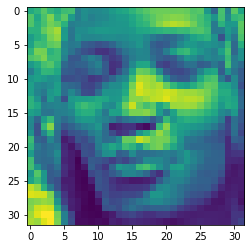

Actual Gender: Female, Actual Age: 20, Actual Race: Black
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Black



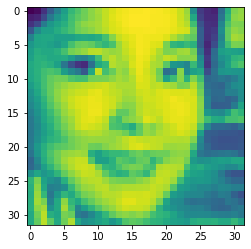

Actual Gender: Female, Actual Age: 28, Actual Race: Asian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Asian



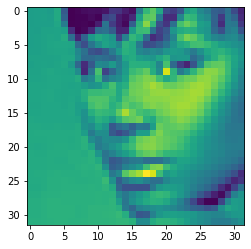

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Black



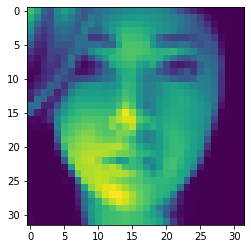

Actual Gender: Female, Actual Age: 26, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



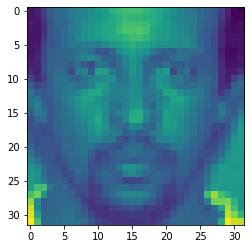

Actual Gender: Male, Actual Age: 35, Actual Race: Black
1/1 [==============================] - 0s 29ms/step
Predicted Gender: Male, Predicted Age: 35, Predicted Race: Black



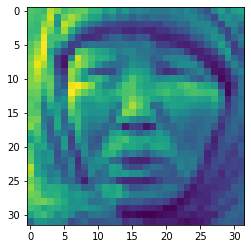

Actual Gender: Female, Actual Age: 62, Actual Race: Asian
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Female, Predicted Age: 56, Predicted Race: Asian



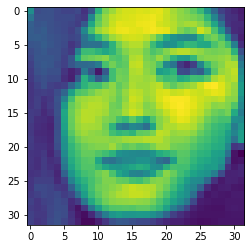

Actual Gender: Female, Actual Age: 26, Actual Race: Asian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Asian



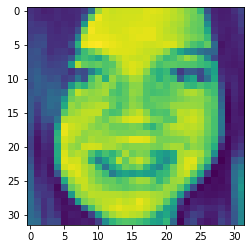

Actual Gender: Female, Actual Age: 16, Actual Race: White
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Female, Predicted Age: 18, Predicted Race: Others



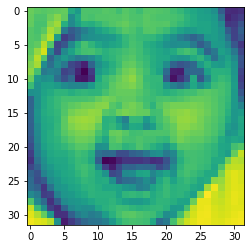

Actual Gender: Female, Actual Age: 1, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 1, Predicted Race: Indian



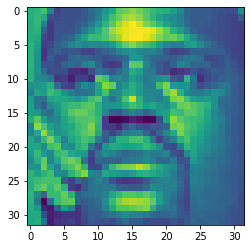

Actual Gender: Male, Actual Age: 36, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 33, Predicted Race: Black



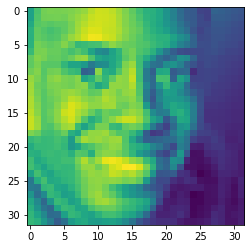

Actual Gender: Male, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 30, Predicted Race: Black



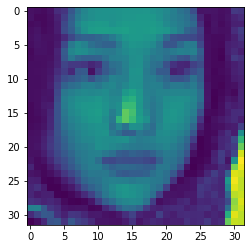

Actual Gender: Female, Actual Age: 26, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Asian



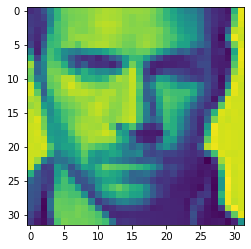

Actual Gender: Male, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 25, Predicted Race: White



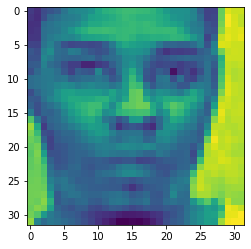

Actual Gender: Male, Actual Age: 21, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: Black



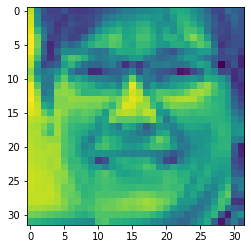

Actual Gender: Female, Actual Age: 40, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 55, Predicted Race: White



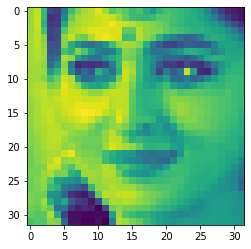

Actual Gender: Female, Actual Age: 28, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Indian



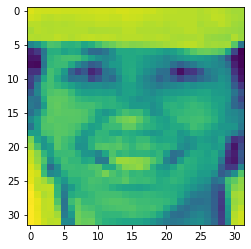

Actual Gender: Female, Actual Age: 37, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 33, Predicted Race: White



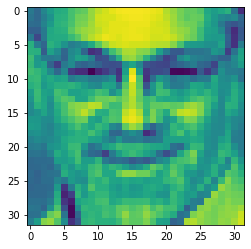

Actual Gender: Male, Actual Age: 60, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 67, Predicted Race: White



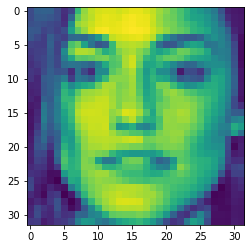

Actual Gender: Female, Actual Age: 20, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Indian



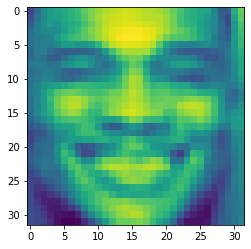

Actual Gender: Male, Actual Age: 24, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: Black



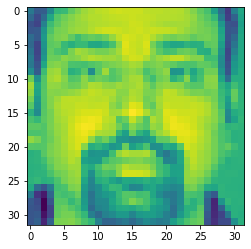

Actual Gender: Male, Actual Age: 34, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 39, Predicted Race: Indian



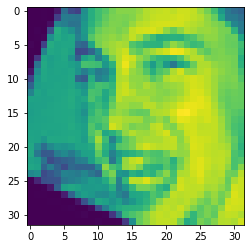

Actual Gender: Male, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 34, Predicted Race: White



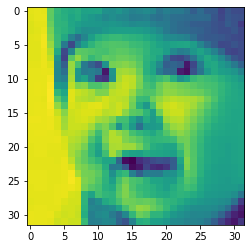

Actual Gender: Male, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: White



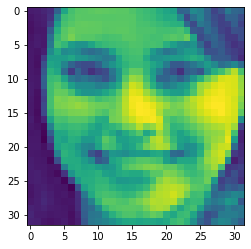

Actual Gender: Female, Actual Age: 21, Actual Race: White
1/1 [==============================] - 0s 26ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Indian



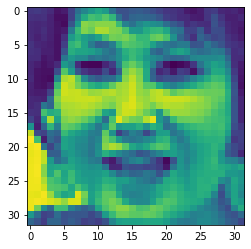

Actual Gender: Female, Actual Age: 55, Actual Race: Asian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 39, Predicted Race: Asian



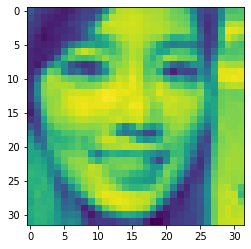

Actual Gender: Female, Actual Age: 21, Actual Race: Asian
1/1 [==============================] - 0s 27ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



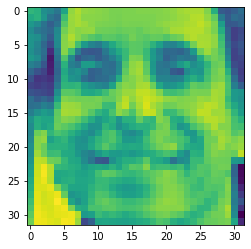

Actual Gender: Male, Actual Age: 57, Actual Race: Others
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 44, Predicted Race: White



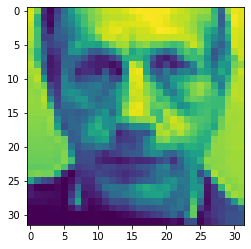

Actual Gender: Male, Actual Age: 53, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 62, Predicted Race: White



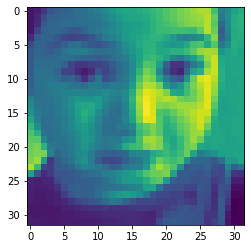

Actual Gender: Female, Actual Age: 7, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: Black



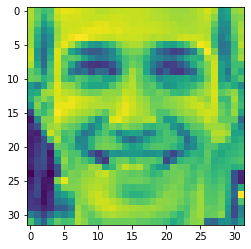

Actual Gender: Male, Actual Age: 29, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 35, Predicted Race: White



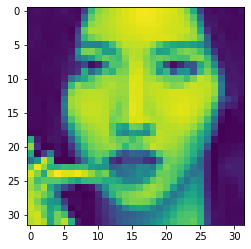

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



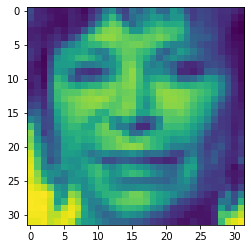

Actual Gender: Female, Actual Age: 53, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 49, Predicted Race: White



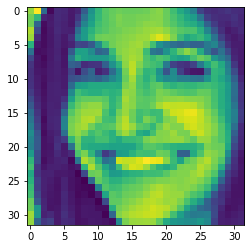

Actual Gender: Female, Actual Age: 21, Actual Race: Indian
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Indian



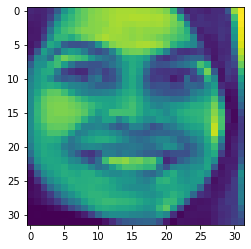

Actual Gender: Female, Actual Age: 28, Actual Race: Indian
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Indian



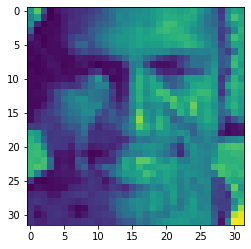

Actual Gender: Male, Actual Age: 28, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 48, Predicted Race: White



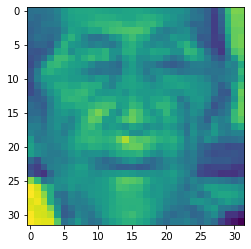

Actual Gender: Female, Actual Age: 96, Actual Race: Asian
1/1 [==============================] - 0s 26ms/step
Predicted Gender: Male, Predicted Age: 87, Predicted Race: Asian



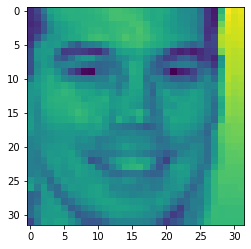

Actual Gender: Male, Actual Age: 27, Actual Race: White
1/1 [==============================] - 0s 28ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: White



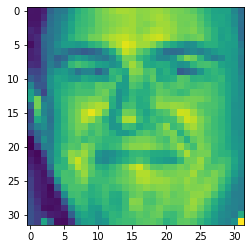

Actual Gender: Male, Actual Age: 29, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 52, Predicted Race: White



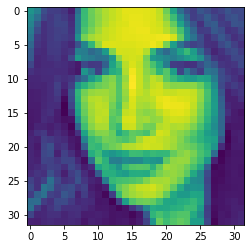

Actual Gender: Female, Actual Age: 24, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: White



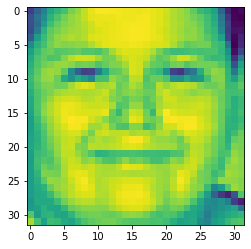

Actual Gender: Male, Actual Age: 14, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 7, Predicted Race: White



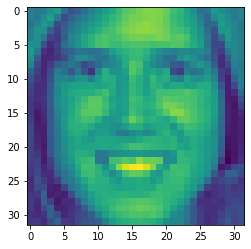

Actual Gender: Female, Actual Age: 27, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: White



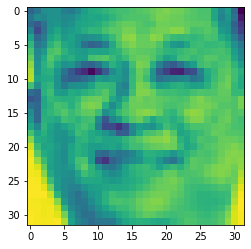

Actual Gender: Male, Actual Age: 58, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 61, Predicted Race: Asian



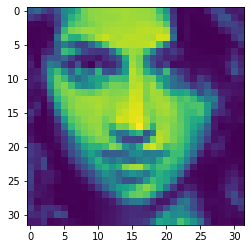

Actual Gender: Female, Actual Age: 24, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Indian



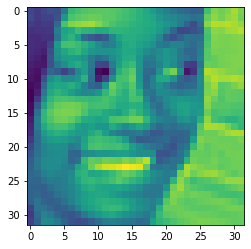

Actual Gender: Female, Actual Age: 20, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Black



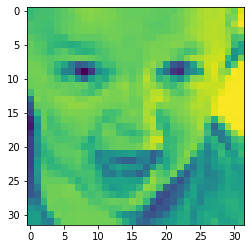

Actual Gender: Male, Actual Age: 3, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 1, Predicted Race: White



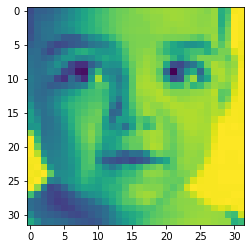

Actual Gender: Female, Actual Age: 3, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: White



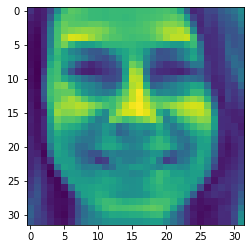

Actual Gender: Female, Actual Age: 32, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 28, Predicted Race: White



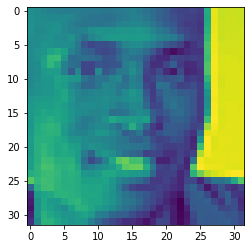

Actual Gender: Male, Actual Age: 29, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Black



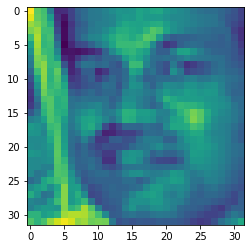

Actual Gender: Male, Actual Age: 53, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 42, Predicted Race: Indian



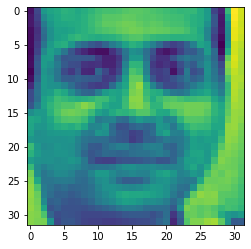

Actual Gender: Male, Actual Age: 35, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 34, Predicted Race: Indian



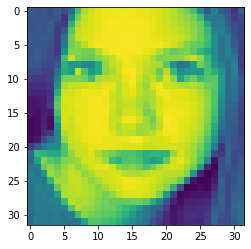

Actual Gender: Female, Actual Age: 10, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 6, Predicted Race: White



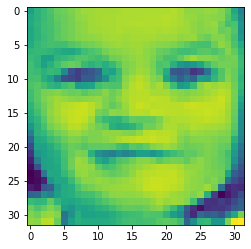

Actual Gender: Female, Actual Age: 3, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 2, Predicted Race: White



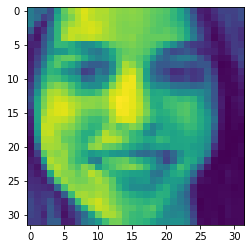

Actual Gender: Female, Actual Age: 17, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 20, Predicted Race: White



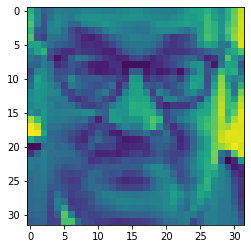

Actual Gender: Male, Actual Age: 61, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 67, Predicted Race: White



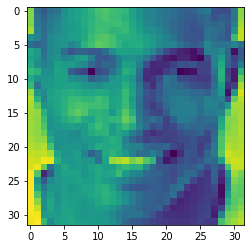

Actual Gender: Male, Actual Age: 30, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Black



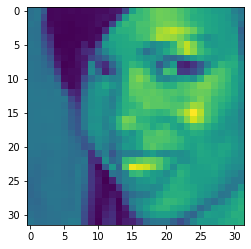

Actual Gender: Female, Actual Age: 32, Actual Race: Black
1/1 [==============================] - 0s 26ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Black



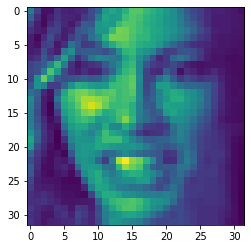

Actual Gender: Female, Actual Age: 28, Actual Race: Others
1/1 [==============================] - 0s 25ms/step
Predicted Gender: Female, Predicted Age: 28, Predicted Race: Black



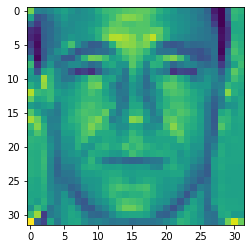

Actual Gender: Male, Actual Age: 34, Actual Race: White
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 54, Predicted Race: White



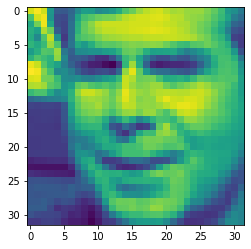

Actual Gender: Male, Actual Age: 40, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: White



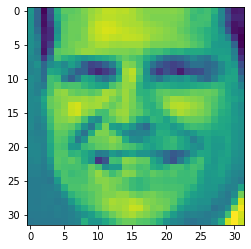

Actual Gender: Male, Actual Age: 30, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 41, Predicted Race: White



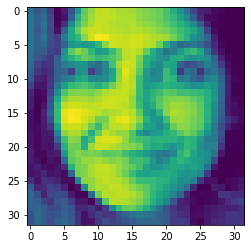

Actual Gender: Female, Actual Age: 30, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Indian



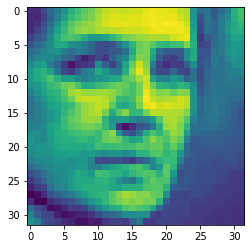

Actual Gender: Female, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 35, Predicted Race: White



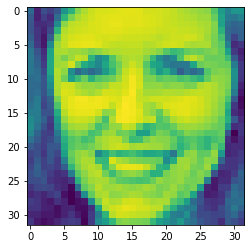

Actual Gender: Female, Actual Age: 29, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 32, Predicted Race: White



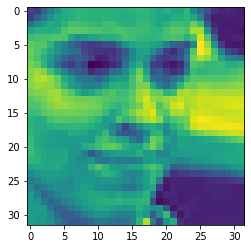

Actual Gender: Female, Actual Age: 22, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 25, Predicted Race: Indian



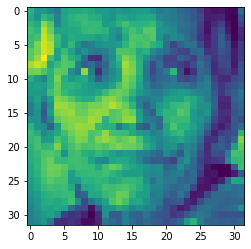

Actual Gender: Female, Actual Age: 89, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 62, Predicted Race: Indian



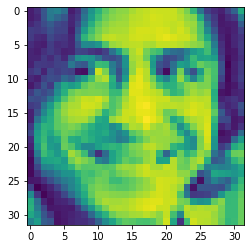

Actual Gender: Male, Actual Age: 33, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 25, Predicted Race: Indian



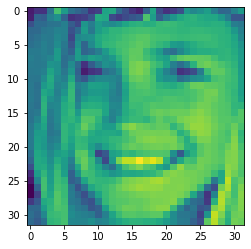

Actual Gender: Female, Actual Age: 14, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 9, Predicted Race: White



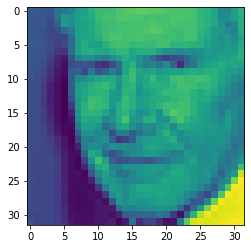

Actual Gender: Male, Actual Age: 68, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 70, Predicted Race: White



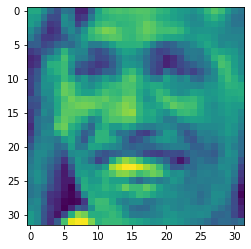

Actual Gender: Female, Actual Age: 28, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 48, Predicted Race: Black



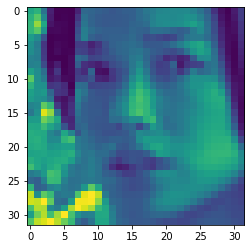

Actual Gender: Female, Actual Age: 22, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Asian



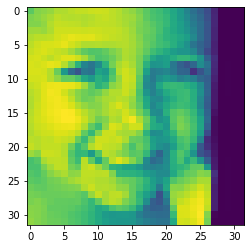

Actual Gender: Female, Actual Age: 4, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 5, Predicted Race: White



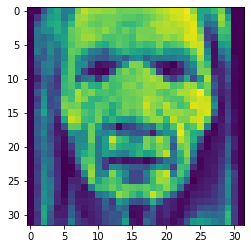

Actual Gender: Female, Actual Age: 110, Actual Race: Indian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 50, Predicted Race: White



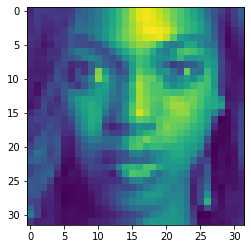

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Black



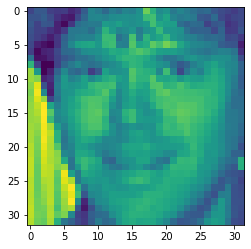

Actual Gender: Male, Actual Age: 32, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: White



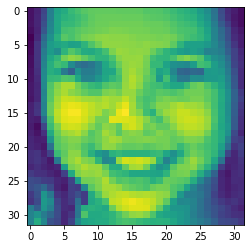

Actual Gender: Female, Actual Age: 6, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 8, Predicted Race: Others



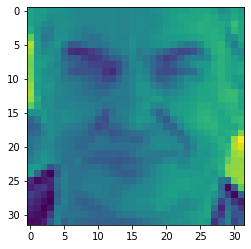

Actual Gender: Male, Actual Age: 65, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 76, Predicted Race: White



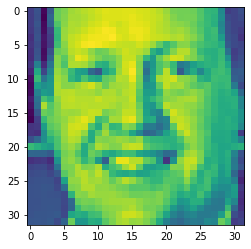

Actual Gender: Male, Actual Age: 42, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 40, Predicted Race: White



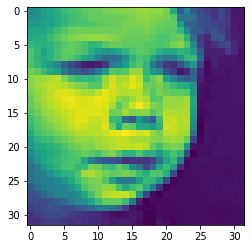

Actual Gender: Male, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 4, Predicted Race: White



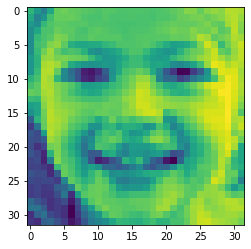

Actual Gender: Female, Actual Age: 7, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: White



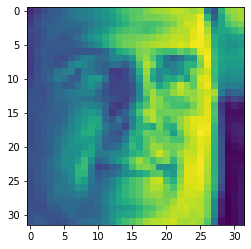

Actual Gender: Male, Actual Age: 50, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 54, Predicted Race: White



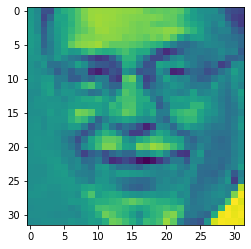

Actual Gender: Male, Actual Age: 62, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 68, Predicted Race: White



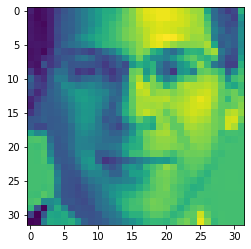

Actual Gender: Male, Actual Age: 29, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: White



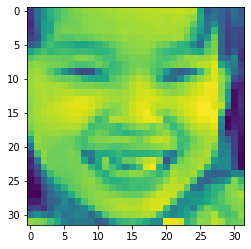

Actual Gender: Female, Actual Age: 4, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: Asian



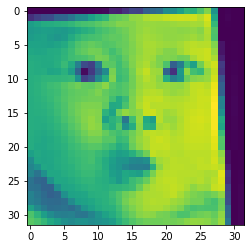

Actual Gender: Male, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 3, Predicted Race: Asian



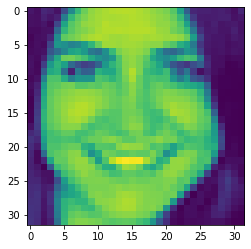

Actual Gender: Female, Actual Age: 26, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: White



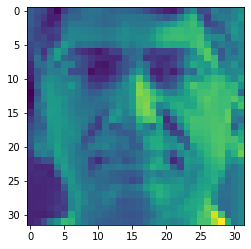

Actual Gender: Male, Actual Age: 47, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 51, Predicted Race: White



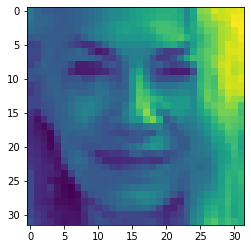

Actual Gender: Female, Actual Age: 80, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 58, Predicted Race: White



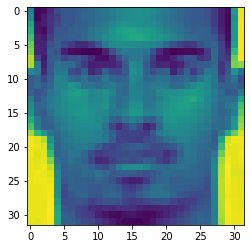

Actual Gender: Male, Actual Age: 29, Actual Race: Black
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: Indian



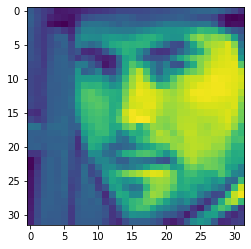

Actual Gender: Male, Actual Age: 37, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 24, Predicted Race: White



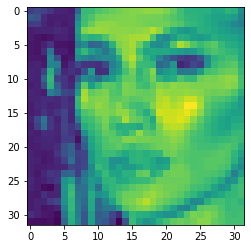

Actual Gender: Female, Actual Age: 28, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 28, Predicted Race: Black



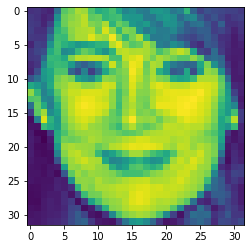

Actual Gender: Female, Actual Age: 48, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 41, Predicted Race: White



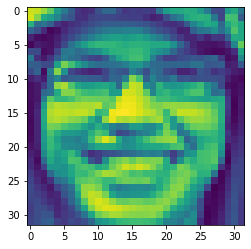

Actual Gender: Female, Actual Age: 24, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Asian



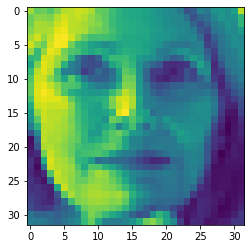

Actual Gender: Female, Actual Age: 66, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 50, Predicted Race: White



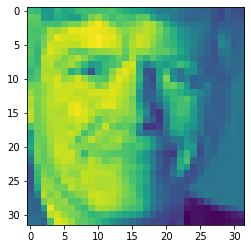

Actual Gender: Male, Actual Age: 61, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 60, Predicted Race: White



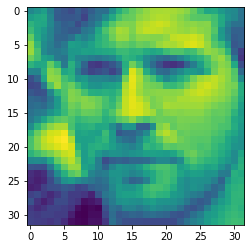

Actual Gender: Male, Actual Age: 30, Actual Race: White
1/1 [==============================] - 0s 25ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: White



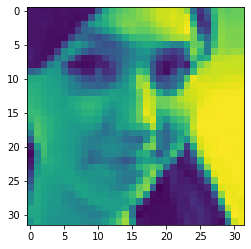

Actual Gender: Female, Actual Age: 21, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Indian



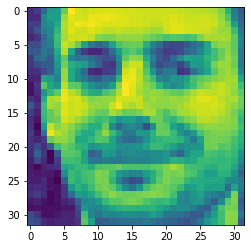

Actual Gender: Male, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 25, Predicted Race: White



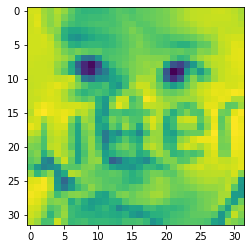

Actual Gender: Female, Actual Age: 2, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 2, Predicted Race: Asian



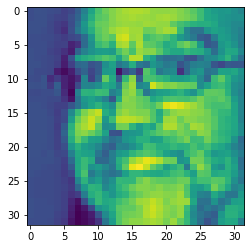

Actual Gender: Male, Actual Age: 68, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 70, Predicted Race: White



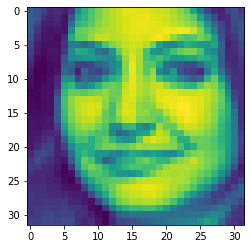

Actual Gender: Female, Actual Age: 21, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Indian



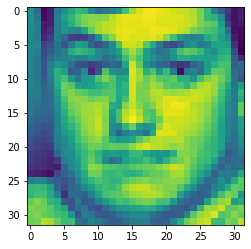

Actual Gender: Male, Actual Age: 28, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 23, Predicted Race: Indian



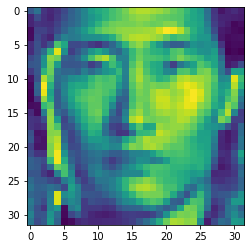

Actual Gender: Male, Actual Age: 26, Actual Race: Asian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: Asian



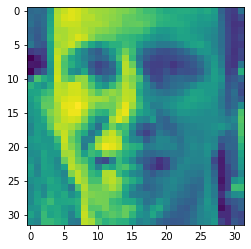

Actual Gender: Male, Actual Age: 37, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 47, Predicted Race: White



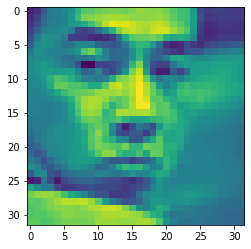

Actual Gender: Male, Actual Age: 26, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 25, Predicted Race: Asian



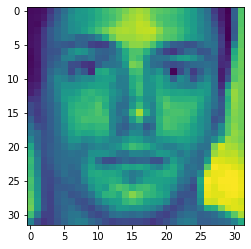

Actual Gender: Male, Actual Age: 20, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: White



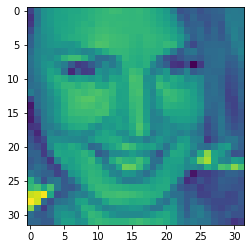

Actual Gender: Female, Actual Age: 54, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 32, Predicted Race: White



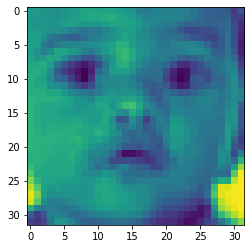

Actual Gender: Male, Actual Age: 1, Actual Race: Black
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Male, Predicted Age: 2, Predicted Race: Indian



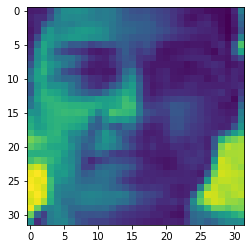

Actual Gender: Male, Actual Age: 27, Actual Race: Indian
1/1 [==============================] - 0s 33ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: Indian



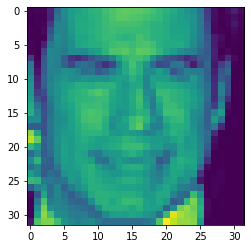

Actual Gender: Male, Actual Age: 55, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 42, Predicted Race: White



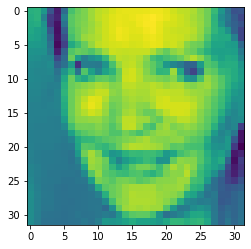

Actual Gender: Female, Actual Age: 50, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 21, Predicted Race: White



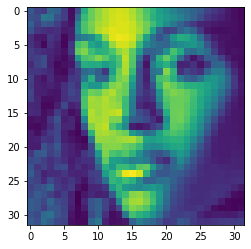

Actual Gender: Female, Actual Age: 27, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Black



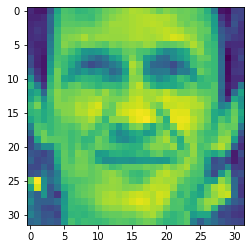

Actual Gender: Male, Actual Age: 37, Actual Race: White
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 58, Predicted Race: White



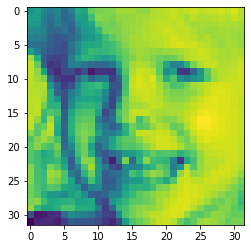

Actual Gender: Female, Actual Age: 3, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 3, Predicted Race: White



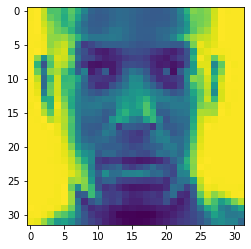

Actual Gender: Male, Actual Age: 32, Actual Race: Black
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: Black



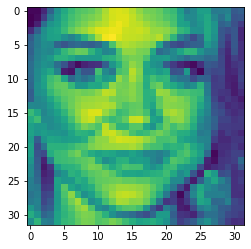

Actual Gender: Female, Actual Age: 24, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 31, Predicted Race: Others



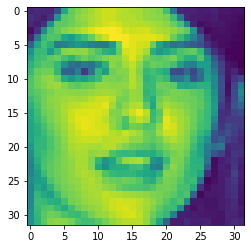

Actual Gender: Female, Actual Age: 24, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Indian



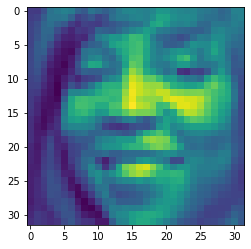

Actual Gender: Female, Actual Age: 36, Actual Race: Black
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 35, Predicted Race: Black



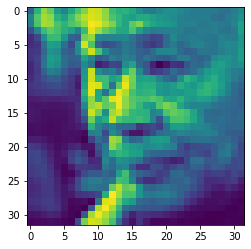

Actual Gender: Male, Actual Age: 75, Actual Race: Asian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 74, Predicted Race: Asian



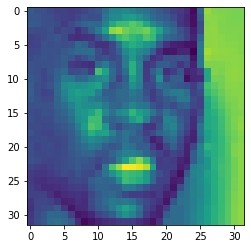

Actual Gender: Male, Actual Age: 28, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Black



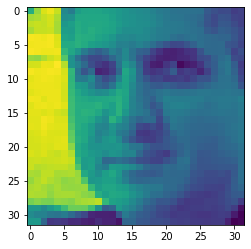

Actual Gender: Male, Actual Age: 45, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 32, Predicted Race: White



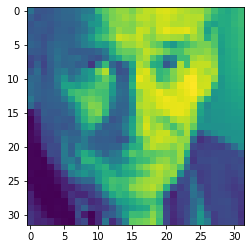

Actual Gender: Male, Actual Age: 67, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 59, Predicted Race: White



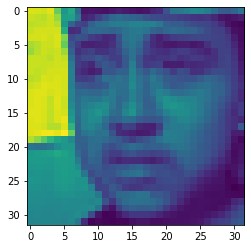

Actual Gender: Male, Actual Age: 22, Actual Race: Others
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 24, Predicted Race: Black



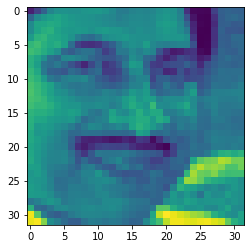

Actual Gender: Male, Actual Age: 36, Actual Race: Indian
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 52, Predicted Race: Indian



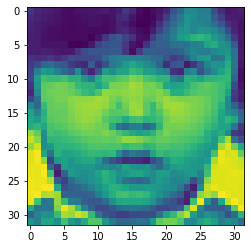

Actual Gender: Male, Actual Age: 3, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 3, Predicted Race: Indian



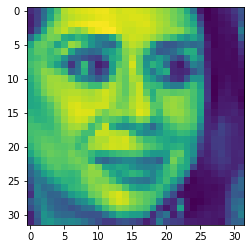

Actual Gender: Female, Actual Age: 32, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 31, Predicted Race: Indian



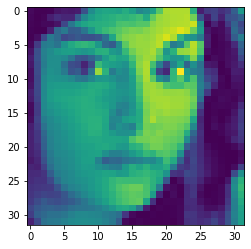

Actual Gender: Female, Actual Age: 21, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Indian



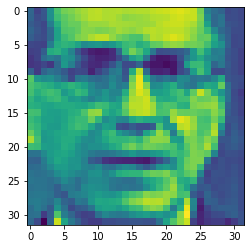

Actual Gender: Male, Actual Age: 70, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 73, Predicted Race: White



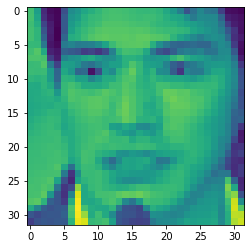

Actual Gender: Male, Actual Age: 30, Actual Race: Asian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 25, Predicted Race: Asian



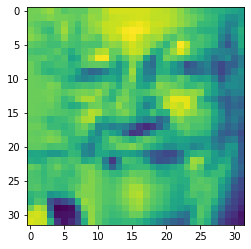

Actual Gender: Female, Actual Age: 95, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 96, Predicted Race: White



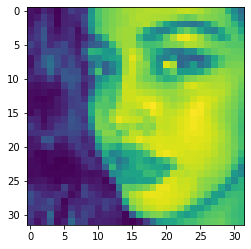

Actual Gender: Female, Actual Age: 21, Actual Race: Others
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 20, Predicted Race: Indian



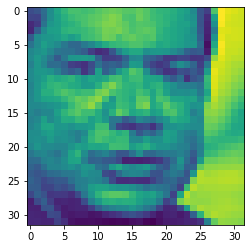

Actual Gender: Male, Actual Age: 48, Actual Race: Others
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 51, Predicted Race: Black



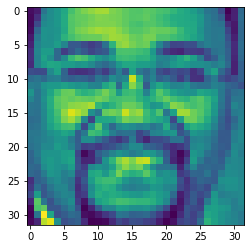

Actual Gender: Male, Actual Age: 50, Actual Race: Black
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 41, Predicted Race: Black



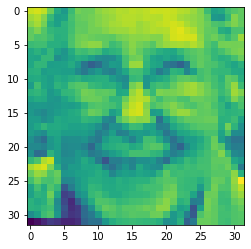

Actual Gender: Female, Actual Age: 74, Actual Race: White
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Female, Predicted Age: 86, Predicted Race: White



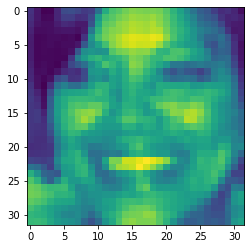

Actual Gender: Female, Actual Age: 49, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 38, Predicted Race: Black



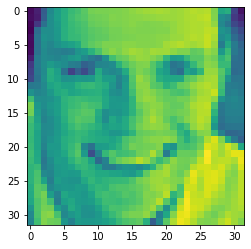

Actual Gender: Male, Actual Age: 25, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: White



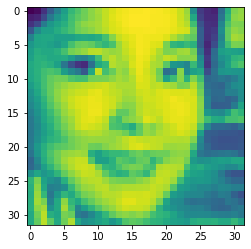

Actual Gender: Female, Actual Age: 28, Actual Race: Asian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Asian



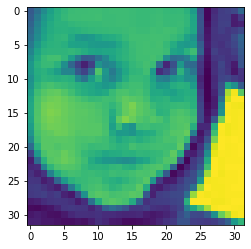

Actual Gender: Male, Actual Age: 4, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 5, Predicted Race: White



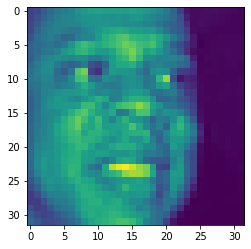

Actual Gender: Male, Actual Age: 38, Actual Race: Black
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 42, Predicted Race: Black



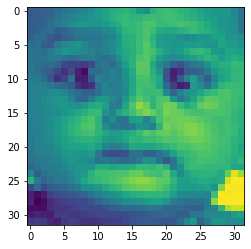

Actual Gender: Female, Actual Age: 1, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 1, Predicted Race: Indian



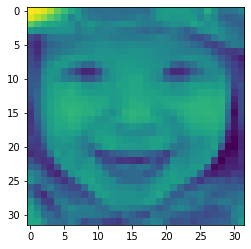

Actual Gender: Female, Actual Age: 17, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: White



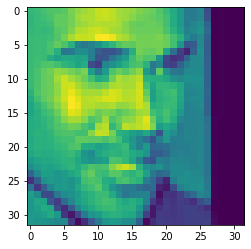

Actual Gender: Male, Actual Age: 27, Actual Race: Others
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Black



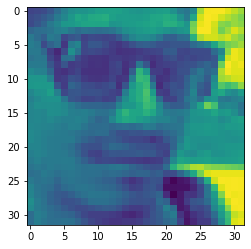

Actual Gender: Male, Actual Age: 26, Actual Race: Indian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 34, Predicted Race: Indian



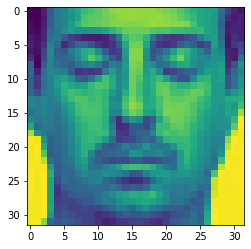

Actual Gender: Male, Actual Age: 32, Actual Race: Indian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: White



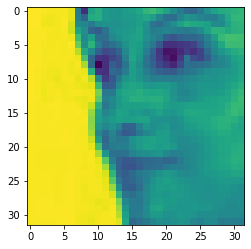

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Indian



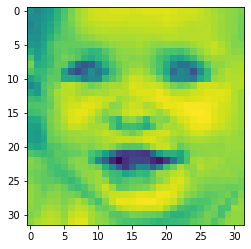

Actual Gender: Female, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 1, Predicted Race: White



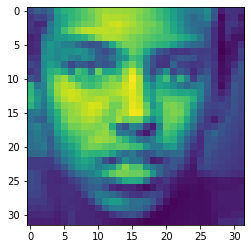

Actual Gender: Male, Actual Age: 15, Actual Race: Black
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 24, Predicted Race: Black



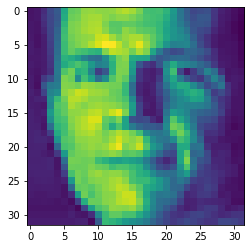

Actual Gender: Male, Actual Age: 47, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 48, Predicted Race: White



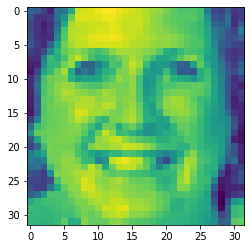

Actual Gender: Female, Actual Age: 32, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 46, Predicted Race: White



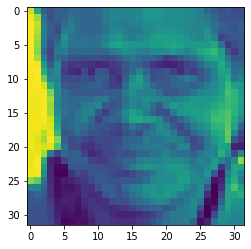

Actual Gender: Male, Actual Age: 42, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 55, Predicted Race: Indian



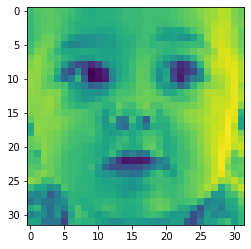

Actual Gender: Male, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 1, Predicted Race: White



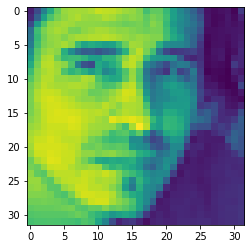

Actual Gender: Male, Actual Age: 27, Actual Race: Others
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: Indian



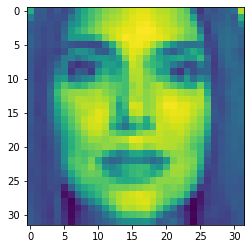

Actual Gender: Female, Actual Age: 30, Actual Race: Others
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: White



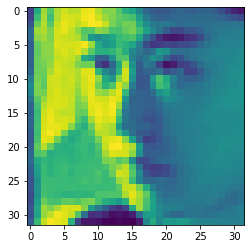

Actual Gender: Female, Actual Age: 26, Actual Race: Asian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Asian



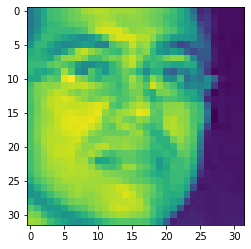

Actual Gender: Male, Actual Age: 30, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 33, Predicted Race: Indian



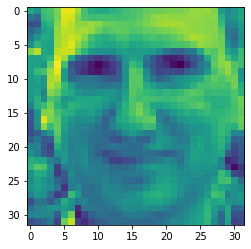

Actual Gender: Male, Actual Age: 41, Actual Race: White
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Male, Predicted Age: 54, Predicted Race: White



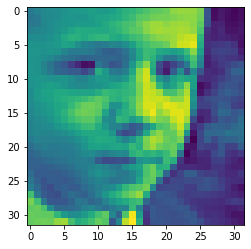

Actual Gender: Male, Actual Age: 8, Actual Race: White
1/1 [==============================] - 0s 26ms/step
Predicted Gender: Male, Predicted Age: 11, Predicted Race: White



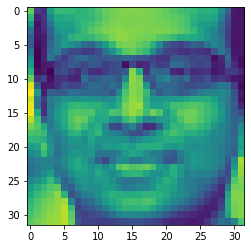

Actual Gender: Male, Actual Age: 36, Actual Race: Indian
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 34, Predicted Race: Indian



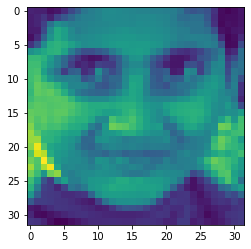

Actual Gender: Male, Actual Age: 8, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 22, Predicted Race: Indian



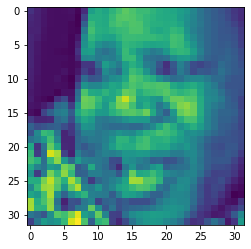

Actual Gender: Female, Actual Age: 60, Actual Race: Black
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 51, Predicted Race: Black



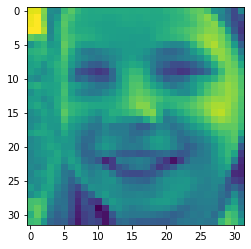

Actual Gender: Female, Actual Age: 9, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 6, Predicted Race: White



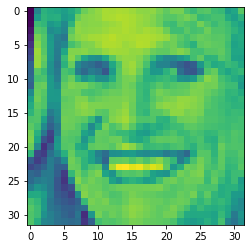

Actual Gender: Female, Actual Age: 75, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 49, Predicted Race: White



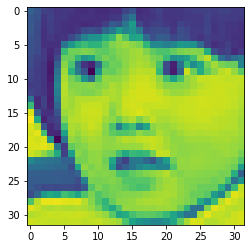

Actual Gender: Female, Actual Age: 3, Actual Race: Asian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: Asian



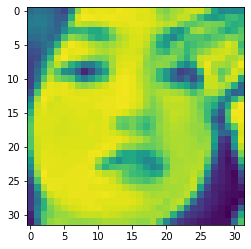

Actual Gender: Female, Actual Age: 25, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Asian



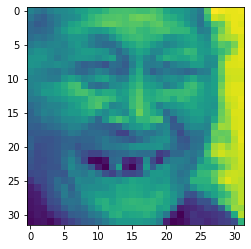

Actual Gender: Male, Actual Age: 88, Actual Race: Asian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 91, Predicted Race: Asian



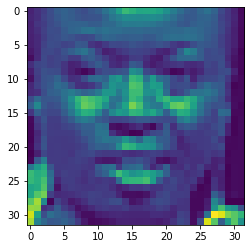

Actual Gender: Female, Actual Age: 31, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 33, Predicted Race: Black



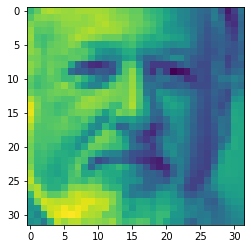

Actual Gender: Male, Actual Age: 54, Actual Race: White
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 69, Predicted Race: White



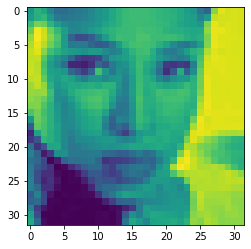

Actual Gender: Female, Actual Age: 29, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Black



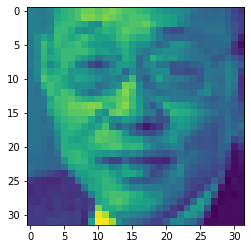

Actual Gender: Male, Actual Age: 60, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 80, Predicted Race: Black



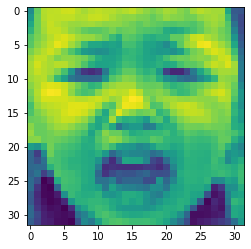

Actual Gender: Female, Actual Age: 2, Actual Race: Asian
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Male, Predicted Age: 3, Predicted Race: Asian



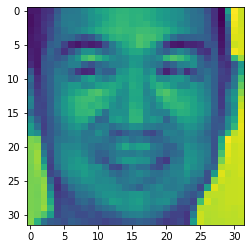

Actual Gender: Male, Actual Age: 39, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 45, Predicted Race: Asian



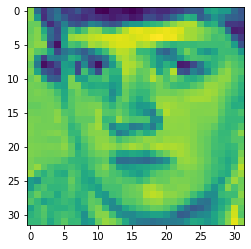

Actual Gender: Male, Actual Age: 17, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 15, Predicted Race: White



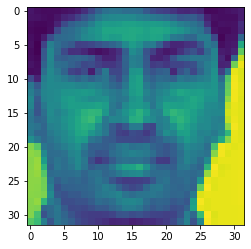

Actual Gender: Male, Actual Age: 45, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 33, Predicted Race: Indian



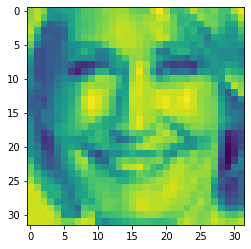

Actual Gender: Female, Actual Age: 57, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 60, Predicted Race: White



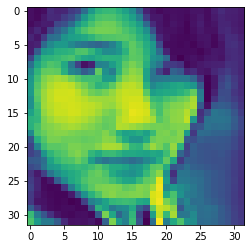

Actual Gender: Female, Actual Age: 22, Actual Race: Asian
1/1 [==============================] - 0s 28ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Asian



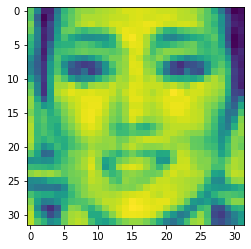

Actual Gender: Female, Actual Age: 41, Actual Race: Asian
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Asian



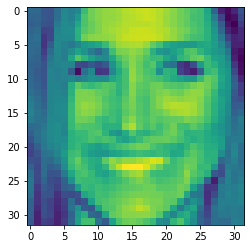

Actual Gender: Female, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Female, Predicted Age: 28, Predicted Race: White



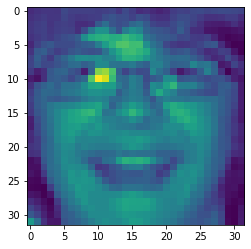

Actual Gender: Male, Actual Age: 20, Actual Race: White
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Female, Predicted Age: 38, Predicted Race: White



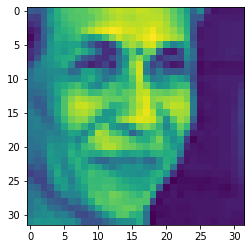

Actual Gender: Female, Actual Age: 65, Actual Race: Indian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 70, Predicted Race: Indian



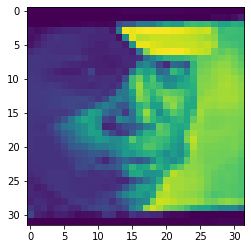

Actual Gender: Female, Actual Age: 35, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 40, Predicted Race: Black



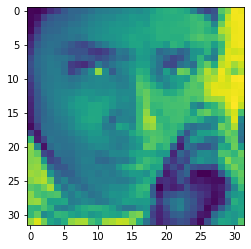

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Indian



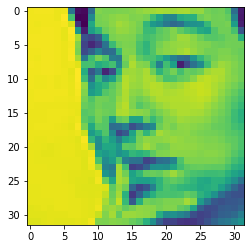

Actual Gender: Male, Actual Age: 30, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 24, Predicted Race: Asian



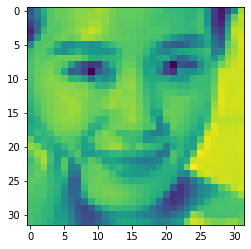

Actual Gender: Female, Actual Age: 25, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



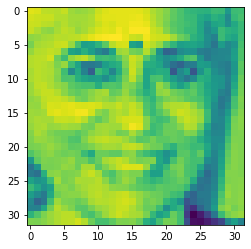

Actual Gender: Female, Actual Age: 60, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 62, Predicted Race: Indian



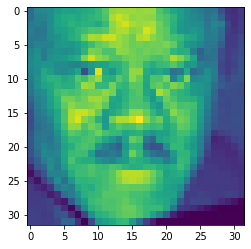

Actual Gender: Male, Actual Age: 56, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 64, Predicted Race: Black



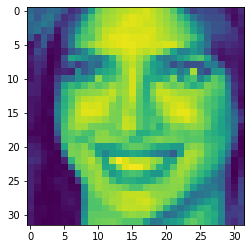

Actual Gender: Female, Actual Age: 30, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: White



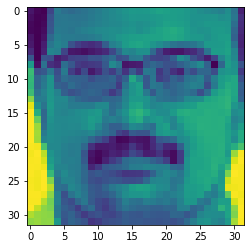

Actual Gender: Male, Actual Age: 36, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 40, Predicted Race: Indian



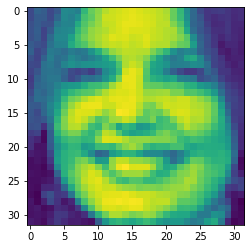

Actual Gender: Female, Actual Age: 20, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: White



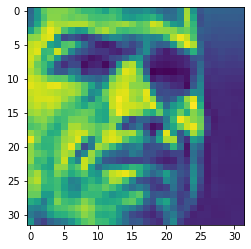

Actual Gender: Male, Actual Age: 29, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 42, Predicted Race: Indian



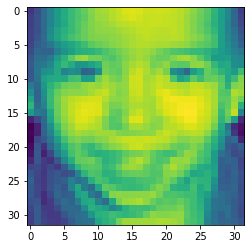

Actual Gender: Male, Actual Age: 2, Actual Race: Others
1/1 [==============================] - 0s 25ms/step
Predicted Gender: Male, Predicted Age: 4, Predicted Race: Others



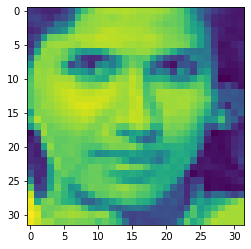

Actual Gender: Female, Actual Age: 17, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Indian



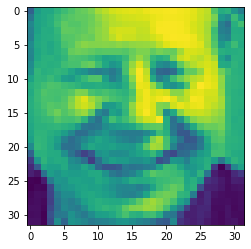

Actual Gender: Male, Actual Age: 68, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 68, Predicted Race: White



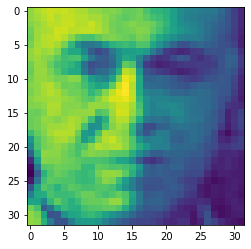

Actual Gender: Male, Actual Age: 54, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 50, Predicted Race: White



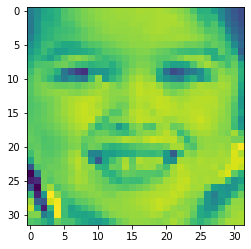

Actual Gender: Female, Actual Age: 4, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: White



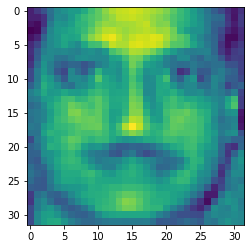

Actual Gender: Male, Actual Age: 50, Actual Race: Indian
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Male, Predicted Age: 30, Predicted Race: Indian



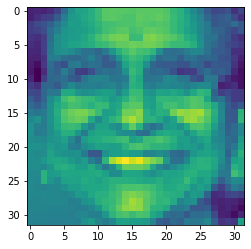

Actual Gender: Female, Actual Age: 62, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 62, Predicted Race: Indian



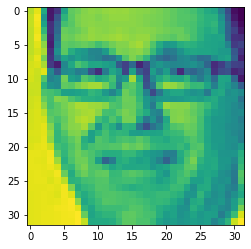

Actual Gender: Male, Actual Age: 48, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 46, Predicted Race: White



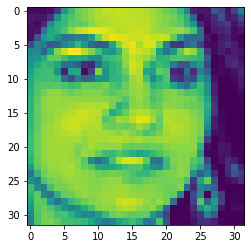

Actual Gender: Female, Actual Age: 23, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Indian



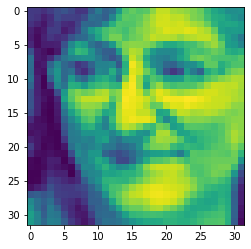

Actual Gender: Female, Actual Age: 54, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 59, Predicted Race: White



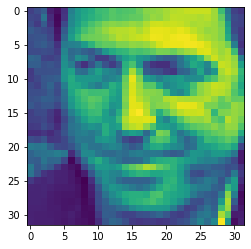

Actual Gender: Male, Actual Age: 50, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 35, Predicted Race: White



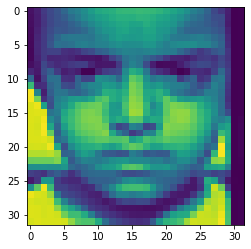

Actual Gender: Male, Actual Age: 4, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 9, Predicted Race: Black



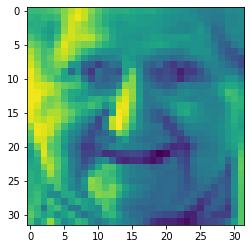

Actual Gender: Female, Actual Age: 95, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 79, Predicted Race: White



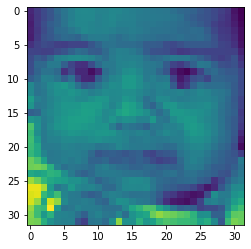

Actual Gender: Male, Actual Age: 1, Actual Race: Others
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: Others



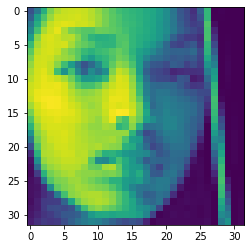

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 16, Predicted Race: White



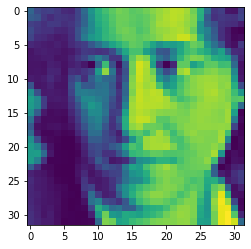

Actual Gender: Female, Actual Age: 27, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 29, Predicted Race: Indian



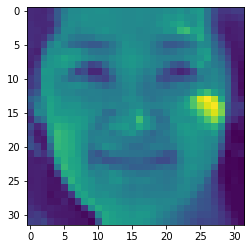

Actual Gender: Female, Actual Age: 30, Actual Race: Asian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 14, Predicted Race: Asian



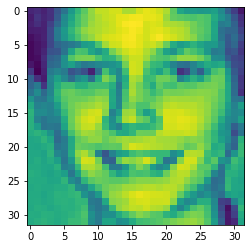

Actual Gender: Male, Actual Age: 9, Actual Race: White
1/1 [==============================] - 0s 27ms/step
Predicted Gender: Female, Predicted Age: 10, Predicted Race: White



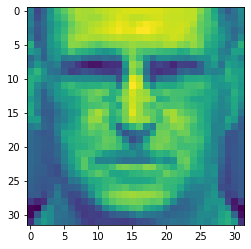

Actual Gender: Female, Actual Age: 58, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 53, Predicted Race: White



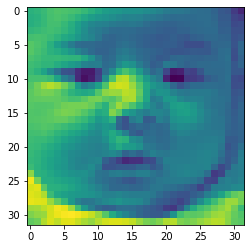

Actual Gender: Male, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 1, Predicted Race: Asian



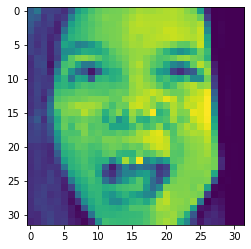

Actual Gender: Female, Actual Age: 6, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 8, Predicted Race: Asian



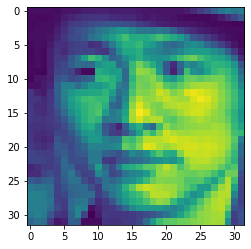

Actual Gender: Male, Actual Age: 32, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 24, Predicted Race: Asian



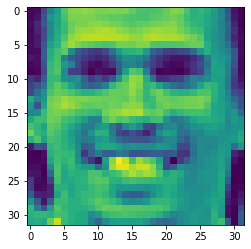

Actual Gender: Male, Actual Age: 23, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: White



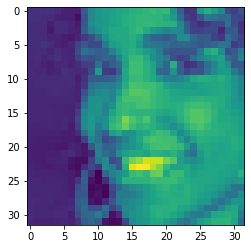

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Black



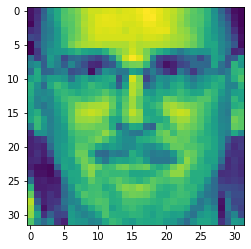

Actual Gender: Male, Actual Age: 37, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 38, Predicted Race: White



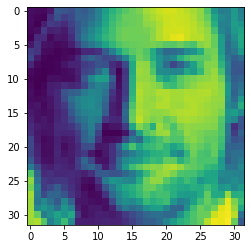

Actual Gender: Male, Actual Age: 32, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: White



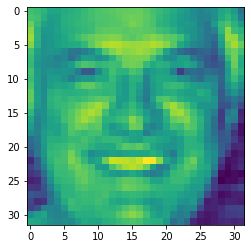

Actual Gender: Male, Actual Age: 54, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 52, Predicted Race: White



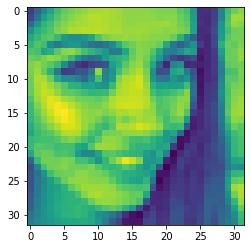

Actual Gender: Female, Actual Age: 20, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 20, Predicted Race: Indian



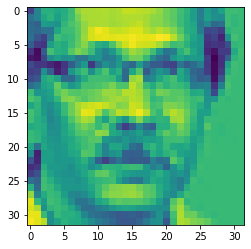

Actual Gender: Male, Actual Age: 55, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 45, Predicted Race: Indian



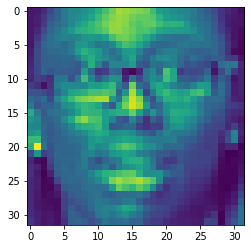

Actual Gender: Female, Actual Age: 29, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 37, Predicted Race: Black



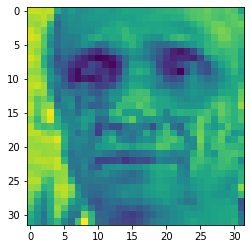

Actual Gender: Male, Actual Age: 67, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 77, Predicted Race: Indian



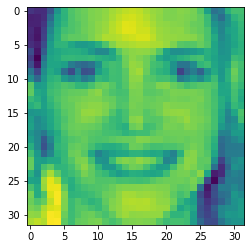

Actual Gender: Female, Actual Age: 28, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: White



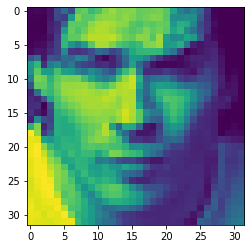

Actual Gender: Male, Actual Age: 27, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: White



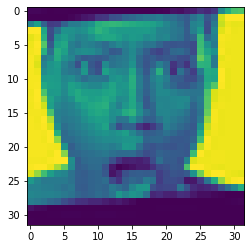

Actual Gender: Female, Actual Age: 35, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 31, Predicted Race: Black



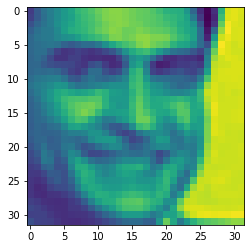

Actual Gender: Male, Actual Age: 34, Actual Race: Indian
1/1 [==============================] - 0s 32ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Indian



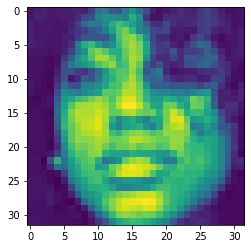

Actual Gender: Female, Actual Age: 27, Actual Race: Black
1/1 [==============================] - 0s 28ms/step
Predicted Gender: Female, Predicted Age: 31, Predicted Race: Black



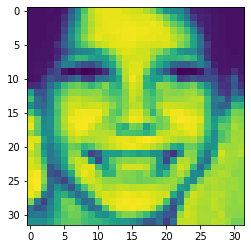

Actual Gender: Female, Actual Age: 8, Actual Race: White
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Female, Predicted Age: 7, Predicted Race: White



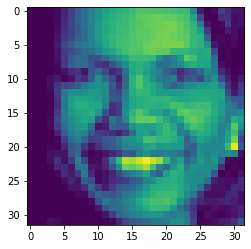

Actual Gender: Female, Actual Age: 48, Actual Race: Black
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 41, Predicted Race: Black



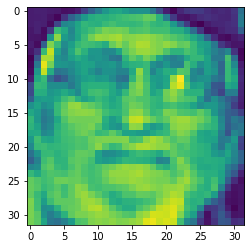

Actual Gender: Male, Actual Age: 65, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 63, Predicted Race: Indian



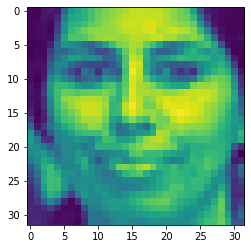

Actual Gender: Female, Actual Age: 47, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 30, Predicted Race: Indian



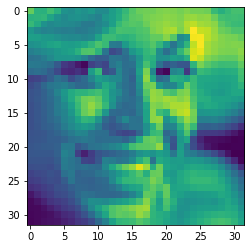

Actual Gender: Female, Actual Age: 28, Actual Race: Black
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 36, Predicted Race: Black



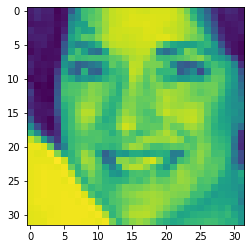

Actual Gender: Female, Actual Age: 48, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 30, Predicted Race: White



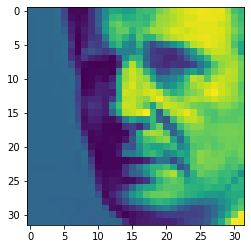

Actual Gender: Male, Actual Age: 53, Actual Race: White
1/1 [==============================] - 0s 27ms/step
Predicted Gender: Male, Predicted Age: 48, Predicted Race: White



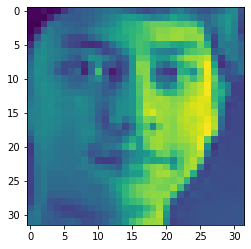

Actual Gender: Male, Actual Age: 15, Actual Race: Indian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 24, Predicted Race: Indian



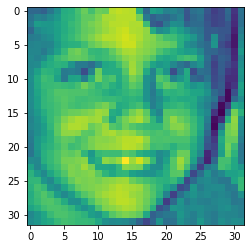

Actual Gender: Male, Actual Age: 9, Actual Race: White
1/1 [==============================] - 0s 28ms/step
Predicted Gender: Female, Predicted Age: 9, Predicted Race: White



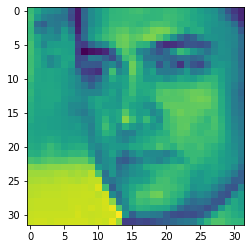

Actual Gender: Male, Actual Age: 28, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: Indian



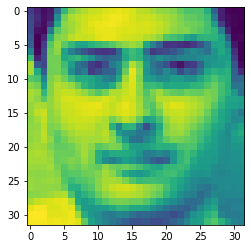

Actual Gender: Male, Actual Age: 25, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 24, Predicted Race: Indian



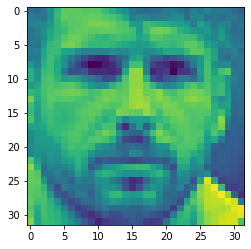

Actual Gender: Male, Actual Age: 29, Actual Race: White
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: White



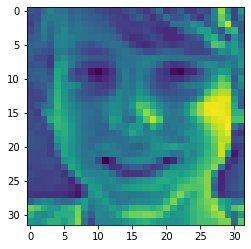

Actual Gender: Male, Actual Age: 9, Actual Race: White
1/1 [==============================] - 0s 26ms/step
Predicted Gender: Female, Predicted Age: 7, Predicted Race: White



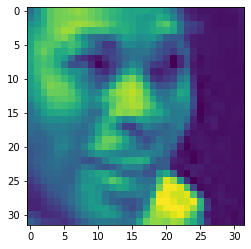

Actual Gender: Female, Actual Age: 36, Actual Race: Black
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Female, Predicted Age: 29, Predicted Race: Black



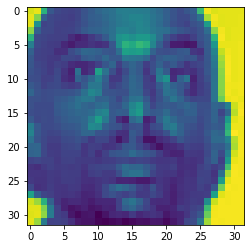

Actual Gender: Male, Actual Age: 44, Actual Race: Black
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 42, Predicted Race: Black



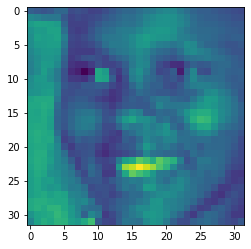

Actual Gender: Female, Actual Age: 7, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Black



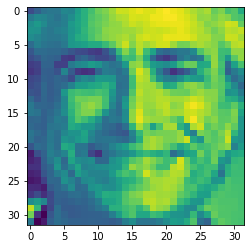

Actual Gender: Male, Actual Age: 48, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 59, Predicted Race: White



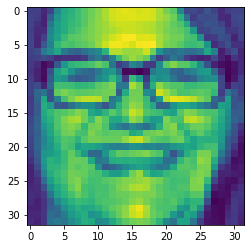

Actual Gender: Female, Actual Age: 34, Actual Race: White
1/1 [==============================] - 0s 30ms/step
Predicted Gender: Female, Predicted Age: 31, Predicted Race: White



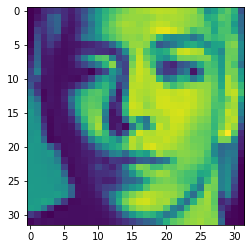

Actual Gender: Male, Actual Age: 25, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Asian



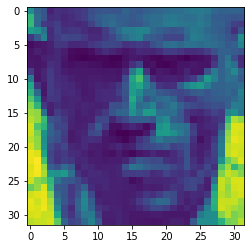

Actual Gender: Male, Actual Age: 61, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 54, Predicted Race: Black



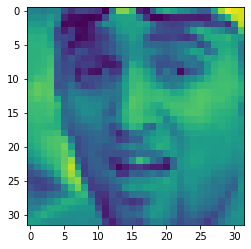

Actual Gender: Male, Actual Age: 25, Actual Race: Indian
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 21, Predicted Race: Black



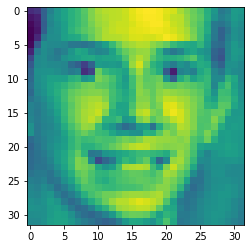

Actual Gender: Male, Actual Age: 14, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 13, Predicted Race: White



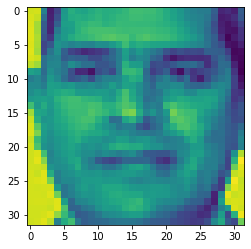

Actual Gender: Male, Actual Age: 39, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 41, Predicted Race: Indian



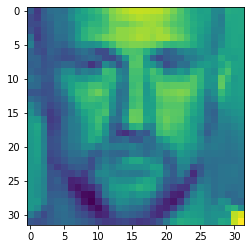

Actual Gender: Male, Actual Age: 45, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 46, Predicted Race: White



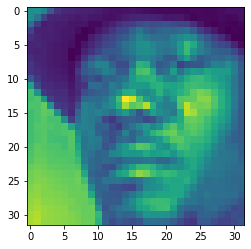

Actual Gender: Male, Actual Age: 34, Actual Race: Black
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 36, Predicted Race: Black



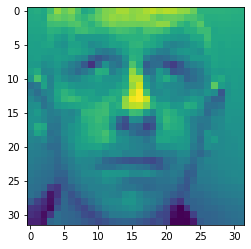

Actual Gender: Male, Actual Age: 36, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 66, Predicted Race: White



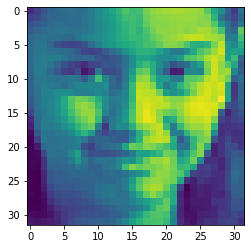

Actual Gender: Female, Actual Age: 11, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 9, Predicted Race: Indian



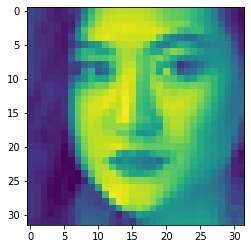

Actual Gender: Female, Actual Age: 29, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



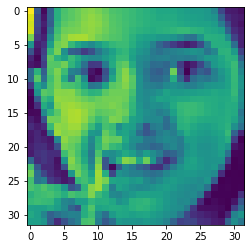

Actual Gender: Female, Actual Age: 13, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 16, Predicted Race: Indian



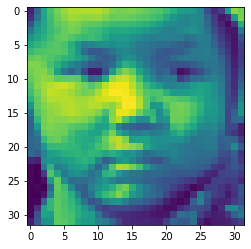

Actual Gender: Male, Actual Age: 5, Actual Race: Asian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: Black



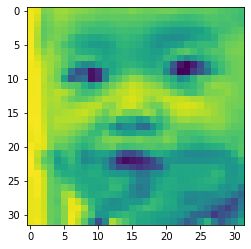

Actual Gender: Male, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 0, Predicted Race: Asian



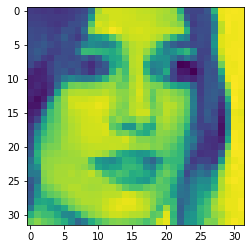

Actual Gender: Female, Actual Age: 29, Actual Race: White
1/1 [==============================] - 0s 26ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: White



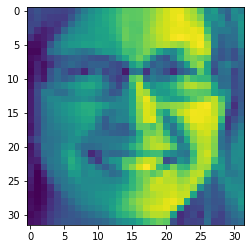

Actual Gender: Female, Actual Age: 40, Actual Race: White
1/1 [==============================] - 0s 28ms/step
Predicted Gender: Female, Predicted Age: 37, Predicted Race: White



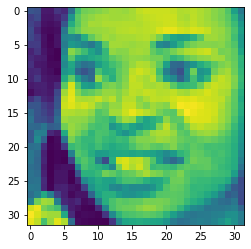

Actual Gender: Female, Actual Age: 37, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Black



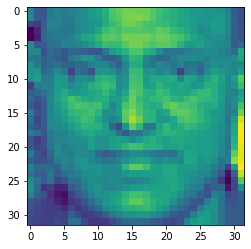

Actual Gender: Male, Actual Age: 47, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 46, Predicted Race: Indian



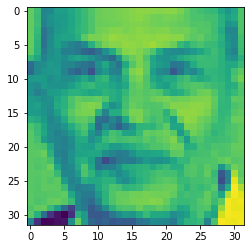

Actual Gender: Male, Actual Age: 69, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 74, Predicted Race: Indian



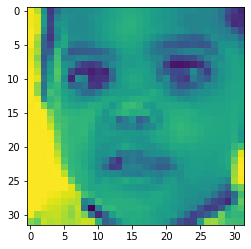

Actual Gender: Female, Actual Age: 1, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: Indian



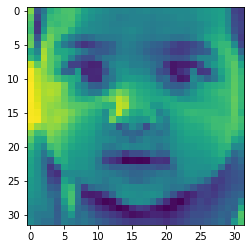

Actual Gender: Female, Actual Age: 1, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 2, Predicted Race: Indian



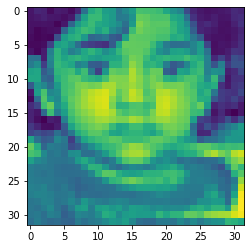

Actual Gender: Female, Actual Age: 3, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 17, Predicted Race: Black



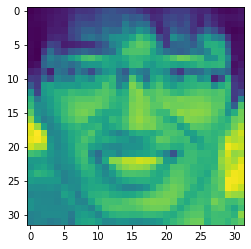

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: Asian



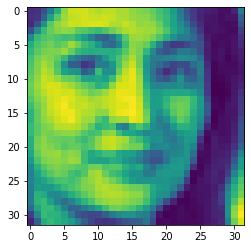

Actual Gender: Female, Actual Age: 32, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 31, Predicted Race: Indian



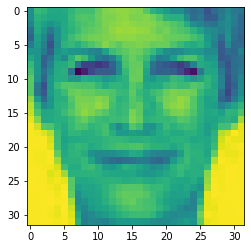

Actual Gender: Female, Actual Age: 58, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 64, Predicted Race: White



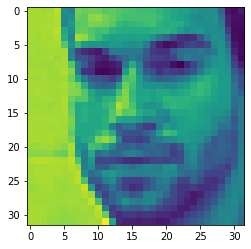

Actual Gender: Male, Actual Age: 28, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 27, Predicted Race: White



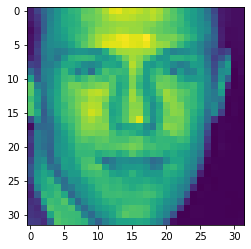

Actual Gender: Male, Actual Age: 35, Actual Race: White
1/1 [==============================] - 0s 25ms/step
Predicted Gender: Male, Predicted Age: 45, Predicted Race: White



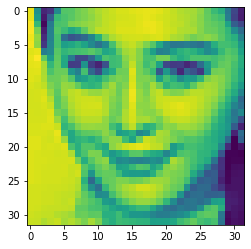

Actual Gender: Female, Actual Age: 27, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Asian



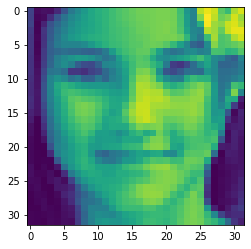

Actual Gender: Female, Actual Age: 8, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: White



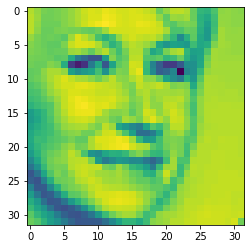

Actual Gender: Female, Actual Age: 56, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 56, Predicted Race: White



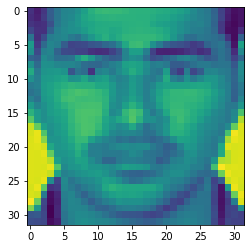

Actual Gender: Male, Actual Age: 23, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: Indian



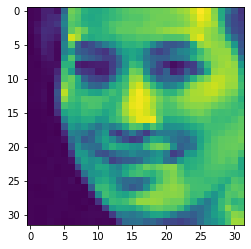

Actual Gender: Female, Actual Age: 30, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Asian



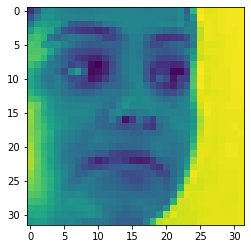

Actual Gender: Female, Actual Age: 37, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 33, Predicted Race: Black



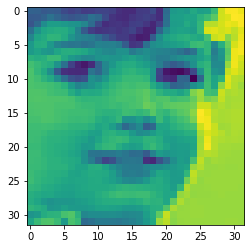

Actual Gender: Male, Actual Age: 5, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: White



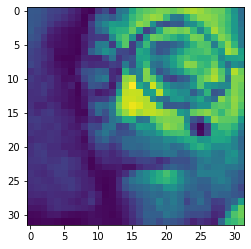

Actual Gender: Male, Actual Age: 26, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 57, Predicted Race: Black



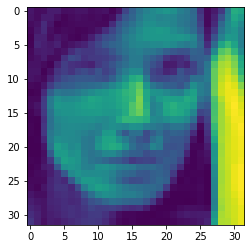

Actual Gender: Female, Actual Age: 36, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: White



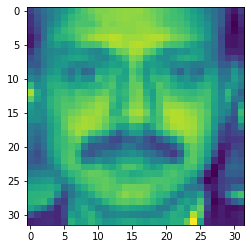

Actual Gender: Male, Actual Age: 26, Actual Race: Indian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 37, Predicted Race: Indian



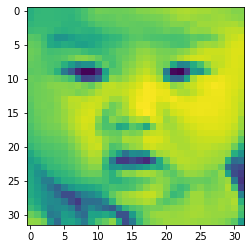

Actual Gender: Male, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 0, Predicted Race: Asian



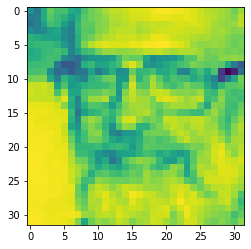

Actual Gender: Male, Actual Age: 66, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Male, Predicted Age: 67, Predicted Race: White



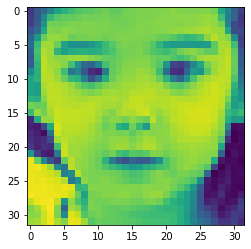

Actual Gender: Female, Actual Age: 5, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 3, Predicted Race: Asian



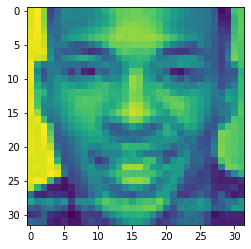

Actual Gender: Male, Actual Age: 25, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: Black



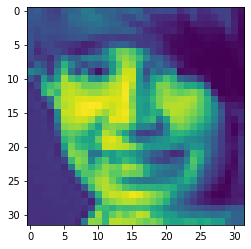

Actual Gender: Female, Actual Age: 16, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: White



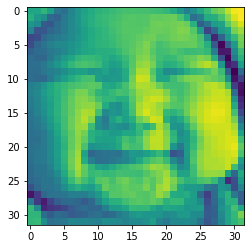

Actual Gender: Male, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: White



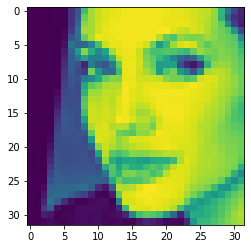

Actual Gender: Female, Actual Age: 24, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: White



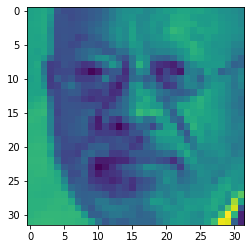

Actual Gender: Male, Actual Age: 58, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 82, Predicted Race: White



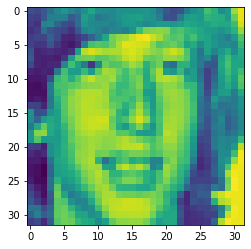

Actual Gender: Male, Actual Age: 25, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 23, Predicted Race: White



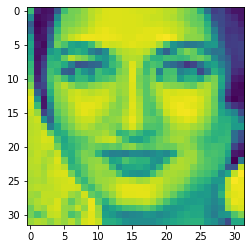

Actual Gender: Female, Actual Age: 36, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Indian



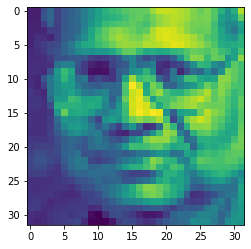

Actual Gender: Male, Actual Age: 54, Actual Race: Indian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 54, Predicted Race: Indian



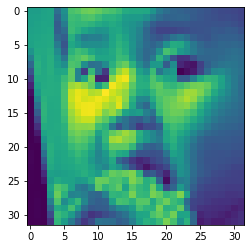

Actual Gender: Female, Actual Age: 3, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: Black



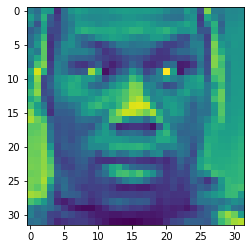

Actual Gender: Male, Actual Age: 29, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Black



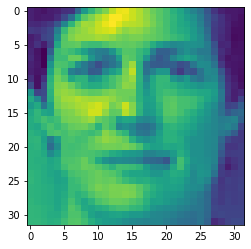

Actual Gender: Female, Actual Age: 37, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 34, Predicted Race: White



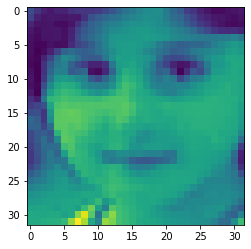

Actual Gender: Female, Actual Age: 5, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 3, Predicted Race: Indian



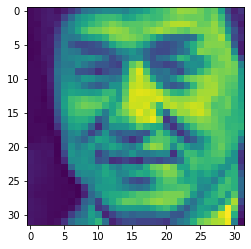

Actual Gender: Male, Actual Age: 39, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 55, Predicted Race: Asian



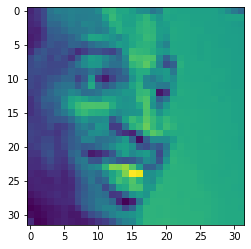

Actual Gender: Male, Actual Age: 36, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 30, Predicted Race: Black



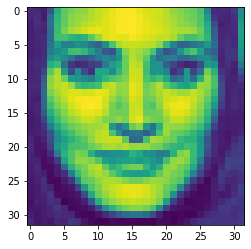

Actual Gender: Female, Actual Age: 30, Actual Race: Others
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Indian



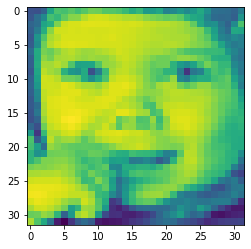

Actual Gender: Female, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: White



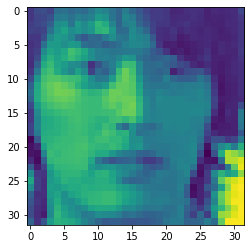

Actual Gender: Male, Actual Age: 29, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 23, Predicted Race: Asian



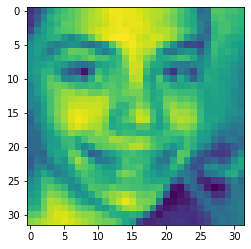

Actual Gender: Male, Actual Age: 12, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 14, Predicted Race: White



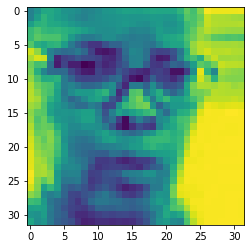

Actual Gender: Female, Actual Age: 51, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 55, Predicted Race: Black



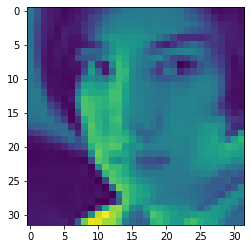

Actual Gender: Female, Actual Age: 27, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Asian



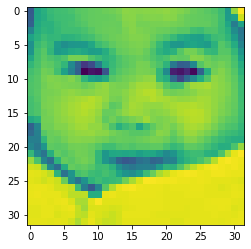

Actual Gender: Female, Actual Age: 1, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: Asian



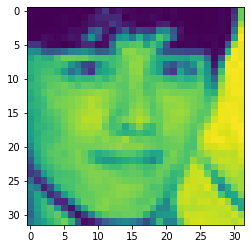

Actual Gender: Male, Actual Age: 18, Actual Race: Asian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 20, Predicted Race: Asian



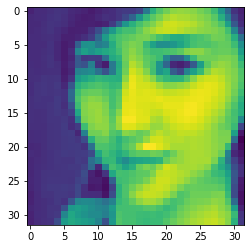

Actual Gender: Female, Actual Age: 28, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: Asian



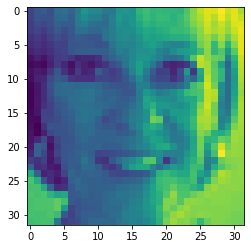

Actual Gender: Female, Actual Age: 50, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 59, Predicted Race: White



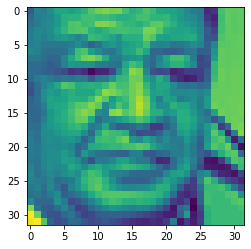

Actual Gender: Male, Actual Age: 50, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 73, Predicted Race: Asian



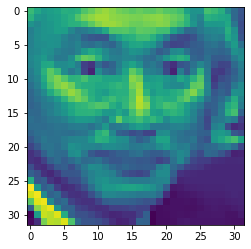

Actual Gender: Male, Actual Age: 68, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 62, Predicted Race: Asian



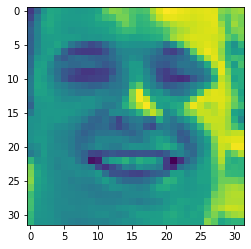

Actual Gender: Male, Actual Age: 21, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 38, Predicted Race: White



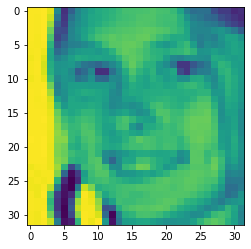

Actual Gender: Female, Actual Age: 11, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 9, Predicted Race: White



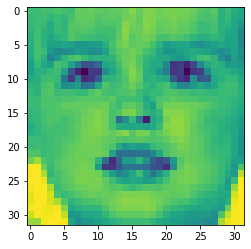

Actual Gender: Female, Actual Age: 4, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: White



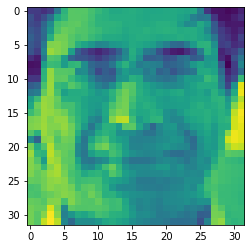

Actual Gender: Male, Actual Age: 52, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 51, Predicted Race: White



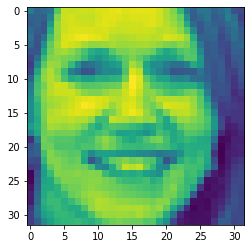

Actual Gender: Female, Actual Age: 30, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 37, Predicted Race: White



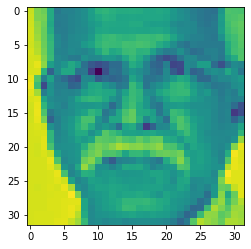

Actual Gender: Male, Actual Age: 65, Actual Race: Indian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 72, Predicted Race: White



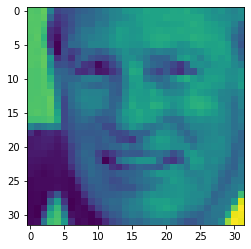

Actual Gender: Male, Actual Age: 55, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 51, Predicted Race: White



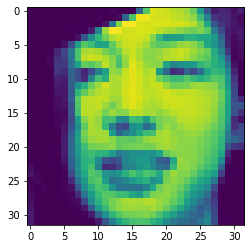

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 21, Predicted Race: Asian



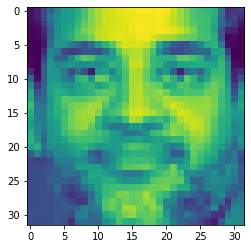

Actual Gender: Male, Actual Age: 44, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 31, Predicted Race: White



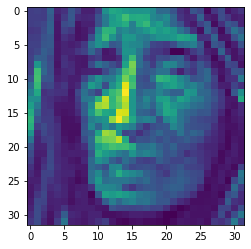

Actual Gender: Female, Actual Age: 110, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Female, Predicted Age: 73, Predicted Race: Black



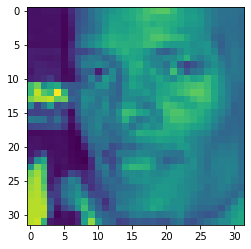

Actual Gender: Male, Actual Age: 45, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 45, Predicted Race: Black



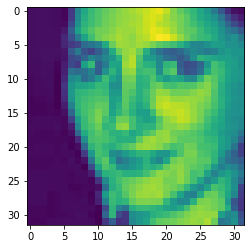

Actual Gender: Female, Actual Age: 26, Actual Race: Indian
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 27, Predicted Race: Indian



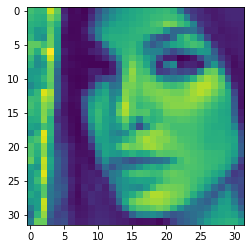

Actual Gender: Female, Actual Age: 21, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: White



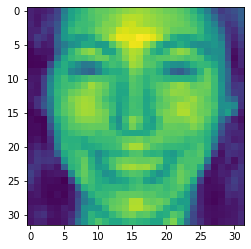

Actual Gender: Female, Actual Age: 36, Actual Race: White
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female, Predicted Age: 37, Predicted Race: White



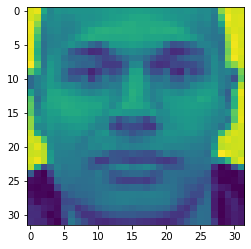

Actual Gender: Male, Actual Age: 26, Actual Race: Others
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 30, Predicted Race: Black



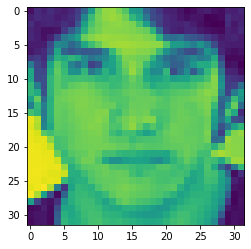

Actual Gender: Male, Actual Age: 16, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 23, Predicted Race: Indian



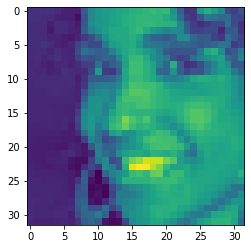

Actual Gender: Female, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Black



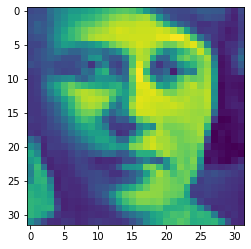

Actual Gender: Female, Actual Age: 35, Actual Race: Others
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: White



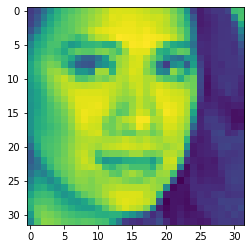

Actual Gender: Female, Actual Age: 30, Actual Race: Asian
1/1 [==============================] - 0s 27ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: Asian



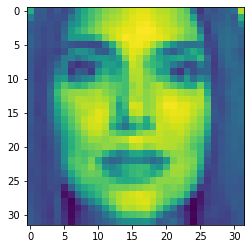

Actual Gender: Female, Actual Age: 30, Actual Race: Others
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 26, Predicted Race: White



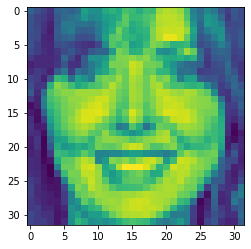

Actual Gender: Female, Actual Age: 52, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 39, Predicted Race: White



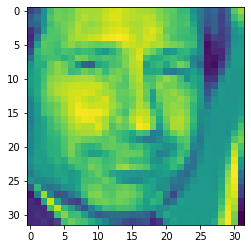

Actual Gender: Male, Actual Age: 42, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 43, Predicted Race: White



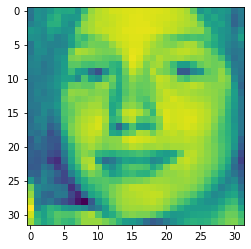

Actual Gender: Female, Actual Age: 8, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 4, Predicted Race: White



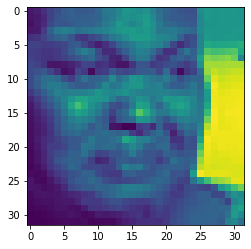

Actual Gender: Female, Actual Age: 48, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 52, Predicted Race: Black



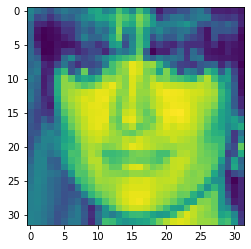

Actual Gender: Female, Actual Age: 26, Actual Race: Others
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Indian



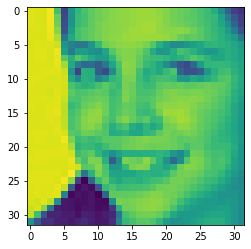

Actual Gender: Female, Actual Age: 16, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 19, Predicted Race: White



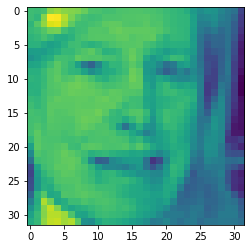

Actual Gender: Female, Actual Age: 52, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 53, Predicted Race: White



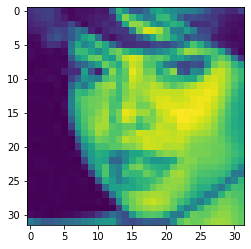

Actual Gender: Female, Actual Age: 38, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: White



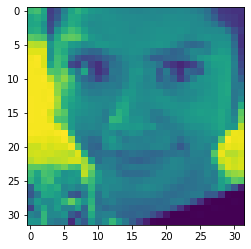

Actual Gender: Female, Actual Age: 24, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 22, Predicted Race: Asian



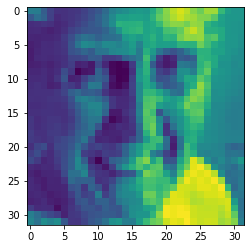

Actual Gender: Male, Actual Age: 80, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female, Predicted Age: 69, Predicted Race: White



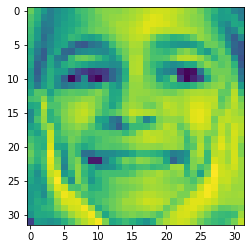

Actual Gender: Female, Actual Age: 10, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 7, Predicted Race: White



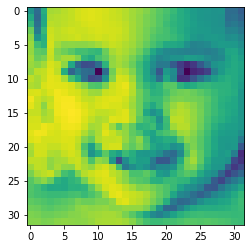

Actual Gender: Female, Actual Age: 2, Actual Race: Others
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 2, Predicted Race: White



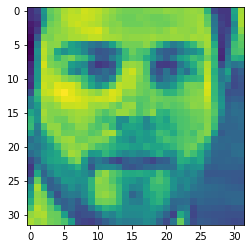

Actual Gender: Male, Actual Age: 31, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 30, Predicted Race: White



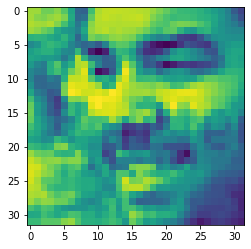

Actual Gender: Male, Actual Age: 29, Actual Race: Black
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 39, Predicted Race: White



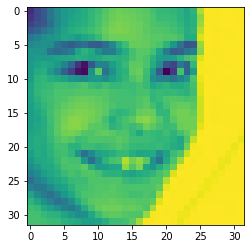

Actual Gender: Male, Actual Age: 10, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 19, Predicted Race: Indian



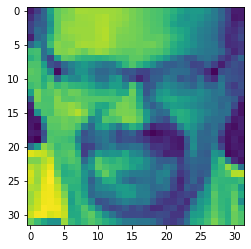

Actual Gender: Male, Actual Age: 49, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 51, Predicted Race: White



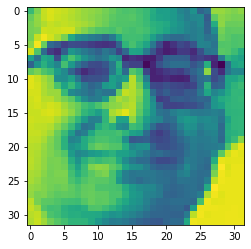

Actual Gender: Male, Actual Age: 48, Actual Race: Black
1/1 [==============================] - 0s 25ms/step
Predicted Gender: Male, Predicted Age: 45, Predicted Race: Indian



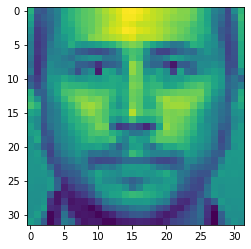

Actual Gender: Male, Actual Age: 32, Actual Race: Others
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: White



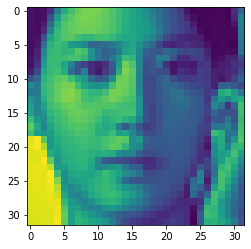

Actual Gender: Female, Actual Age: 28, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 25, Predicted Race: Asian



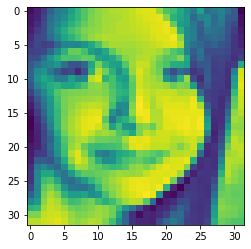

Actual Gender: Female, Actual Age: 8, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 8, Predicted Race: White



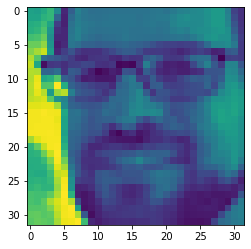

Actual Gender: Male, Actual Age: 36, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 36, Predicted Race: White



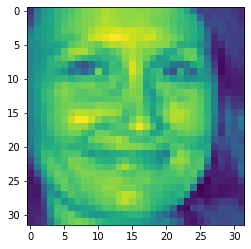

Actual Gender: Female, Actual Age: 36, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 38, Predicted Race: White



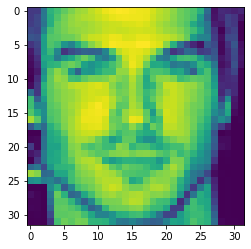

Actual Gender: Male, Actual Age: 25, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: White



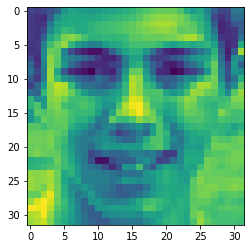

Actual Gender: Male, Actual Age: 15, Actual Race: White
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Male, Predicted Age: 23, Predicted Race: White



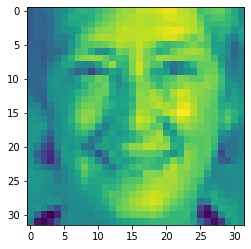

Actual Gender: Female, Actual Age: 38, Actual Race: White
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Female, Predicted Age: 64, Predicted Race: White



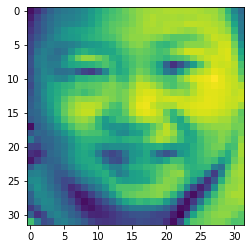

Actual Gender: Male, Actual Age: 5, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 3, Predicted Race: Asian



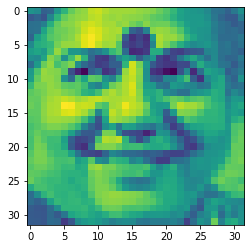

Actual Gender: Female, Actual Age: 72, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 58, Predicted Race: Indian



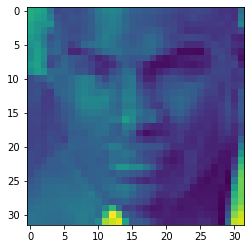

Actual Gender: Male, Actual Age: 26, Actual Race: Black
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 28, Predicted Race: Black



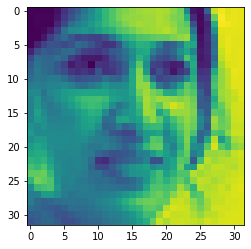

Actual Gender: Female, Actual Age: 25, Actual Race: Indian
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 31, Predicted Race: Indian



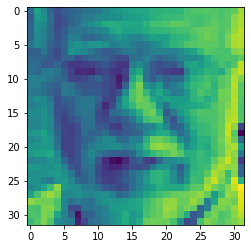

Actual Gender: Male, Actual Age: 80, Actual Race: White
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male, Predicted Age: 81, Predicted Race: White



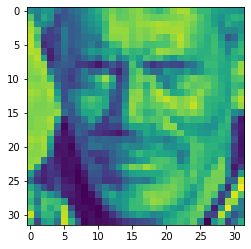

Actual Gender: Male, Actual Age: 51, Actual Race: Black
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 71, Predicted Race: White



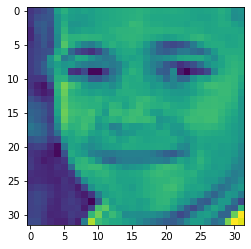

Actual Gender: Male, Actual Age: 10, Actual Race: Black
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Female, Predicted Age: 10, Predicted Race: White



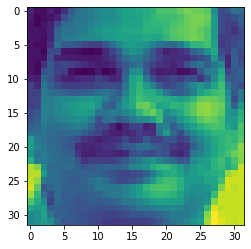

Actual Gender: Male, Actual Age: 52, Actual Race: Indian
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 34, Predicted Race: Indian



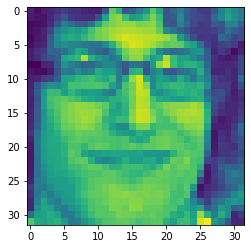

Actual Gender: Male, Actual Age: 28, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 29, Predicted Race: White



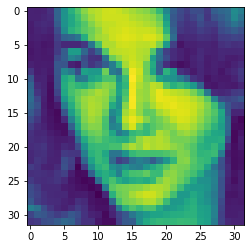

Actual Gender: Female, Actual Age: 29, Actual Race: White
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female, Predicted Age: 23, Predicted Race: White



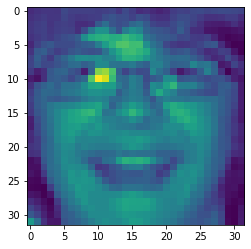

Actual Gender: Male, Actual Age: 20, Actual Race: White
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 38, Predicted Race: White



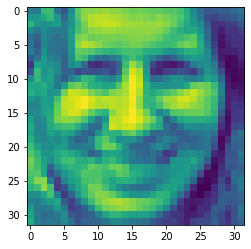

Actual Gender: Female, Actual Age: 32, Actual Race: White
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Female, Predicted Age: 37, Predicted Race: White



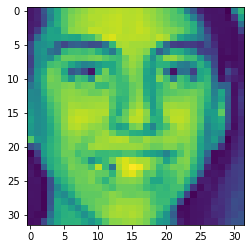

Actual Gender: Female, Actual Age: 15, Actual Race: Others
1/1 [==============================] - 0s 17ms/step
Predicted Gender: Female, Predicted Age: 24, Predicted Race: Others



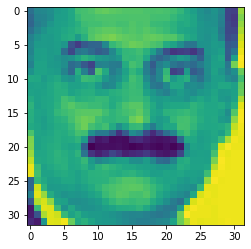

Actual Gender: Male, Actual Age: 60, Actual Race: Indian
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Male, Predicted Age: 40, Predicted Race: Indian



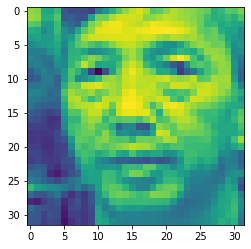

Actual Gender: Male, Actual Age: 50, Actual Race: Asian
1/1 [==============================] - 0s 19ms/step
Predicted Gender: Male, Predicted Age: 62, Predicted Race: Asian



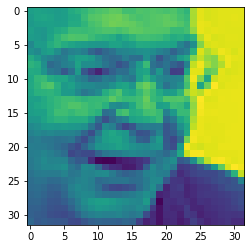

Actual Gender: Male, Actual Age: 67, Actual Race: White
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male, Predicted Age: 75, Predicted Race: White



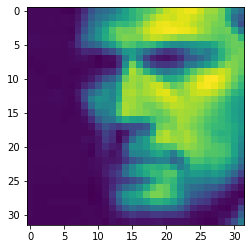

Actual Gender: Male, Actual Age: 30, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 26, Predicted Race: White



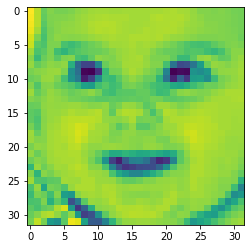

Actual Gender: Female, Actual Age: 1, Actual Race: White
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Male, Predicted Age: 1, Predicted Race: White



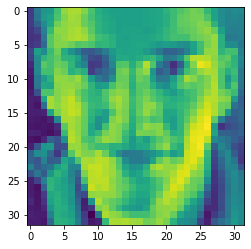

Actual Gender: Male, Actual Age: 31, Actual Race: White
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male, Predicted Age: 17, Predicted Race: White

Number of Correct Gender Predictions: 911
Number of Correct Race Predictions: 808
Number of Correct Age Predictions: 630


In [53]:
#need add predicted probability
race_list=['White', 'Black', 'Asian', 'Indian', 'Others']
gender_list=['Male', 'Female']
correct_gender=0
correct_race=0
correct_age=0
for num in num_list:
    plt.imshow(images_data[num])
    plt.show() 
    print('Actual Gender: '+gender_list[int(Gender[num])]+', Actual Age: '+Age[num]+', Actual Race: '+race_list[int(Race[num])])
    gender=int(str(np.round(Load_gender_model.predict(images_data[num].reshape(1,32,32,1)))).replace('[[','').replace('.]]',''))
    age=int(str(np.round(Load_age_model.predict(images_data[num].reshape(1,32,32,1)))).replace('[[','').replace('.]]',''))
    race=int(str(np.argmax(Load_race_model.predict(images_data[num].reshape(1,32,32,1)),axis=1)).replace('[','').replace(']',''))
    print('Predicted Gender: '+gender_list[gender]+', Predicted Age: '+str(age)+', Predicted Race: '+race_list[race])
    
    if int(Gender[num])==gender:
        correct_gender+=1
    if int(Race[num])==race:
        correct_race+=1
    if (age-5)<=int(Age[num])<=(age+5):
        correct_age+=1      
    print('')
    
print('Number of Correct Gender Predictions: '+str(correct_gender))
print('Number of Correct Race Predictions: '+str(correct_race))
print('Number of Correct Age Predictions: '+str(correct_age))

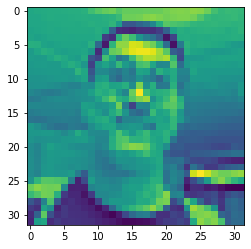

1/1 [==============================] - 0s 27ms/step
dad.JPG
Predicted gender:  Male
Predicted age:  61
Predicted race:  Black


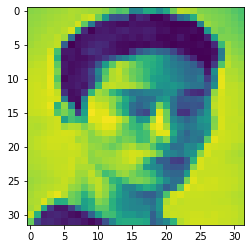

1/1 [==============================] - 0s 20ms/step
download (1).jfif
Predicted gender:  Male
Predicted age:  27
Predicted race:  Black


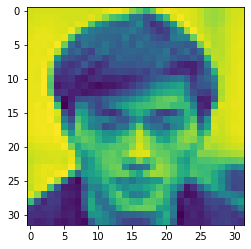

1/1 [==============================] - 0s 20ms/step
download (2).jfif
Predicted gender:  Male
Predicted age:  43
Predicted race:  Black


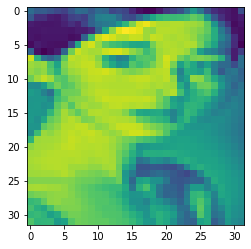

1/1 [==============================] - 0s 18ms/step
download (3).jfif
Predicted gender:  Male
Predicted age:  27
Predicted race:  Asian


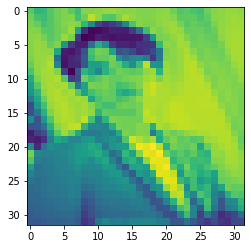

1/1 [==============================] - 0s 21ms/step
download (4).jfif
Predicted gender:  Male
Predicted age:  39
Predicted race:  White


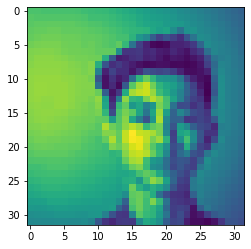

1/1 [==============================] - 0s 23ms/step
download.jfif
Predicted gender:  Male
Predicted age:  38
Predicted race:  Black


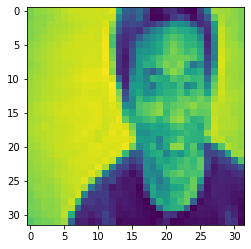

1/1 [==============================] - 0s 20ms/step
images (1).jfif
Predicted gender:  Male
Predicted age:  30
Predicted race:  White


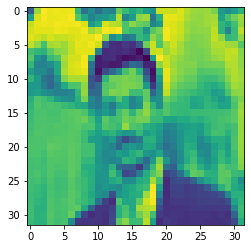

1/1 [==============================] - 0s 19ms/step
images.jfif
Predicted gender:  Male
Predicted age:  37
Predicted race:  White


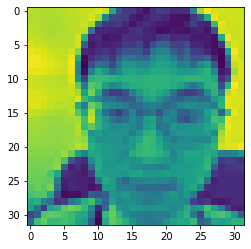

1/1 [==============================] - 0s 37ms/step
IMG_8537.jpg
Predicted gender:  Male
Predicted age:  31
Predicted race:  Indian


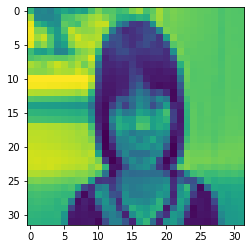

1/1 [==============================] - 0s 39ms/step
mom.JPG
Predicted gender:  Female
Predicted age:  32
Predicted race:  Black


In [86]:
test_dir='testpic/'
for file in os.listdir(test_dir):
    filename=test_dir+file
    X=load_img(filename, color_mode="grayscale")
    X_loaded=X.resize((32, 32), resample=Image.LANCZOS)
    X_flatten=array(X_loaded).flatten()
    X_flatten_reshaped = X_flatten.reshape(1,32,32,1).astype('float32') 
    X_flatten_reshaped_normalized=X_flatten_reshaped/255
    plt.imshow(X_loaded)
    plt.show()

    pred_gender=int(str(np.round(Load_gender_model.predict(X_flatten_reshaped_normalized))).replace('[[','').replace('.]]',''))
    pred_age=int(str(np.round(Load_age_model.predict(X_flatten_reshaped_normalized))).replace('[[','').replace('.]]',''))
    pred_race=int(str(np.argmax(Load_race_model.predict(X_flatten_reshaped_normalized),axis=1)).replace('[','').replace(']',''))

    print(file)
    print('Predicted gender: ',gender_list[pred_gender])
    print('Predicted age: ', pred_age)
    print('Predicted race: ',race_list[pred_race])


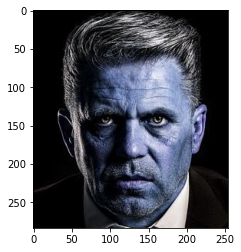

ambassador-852766__480.jpg
1
1/1 [==============================] - 0s 20ms/step
Predicted Gender: Male(99.97%)
1/1 [==============================] - 0s 20ms/step
Predicted Age: 60
1/1 [==============================] - 0s 23ms/step
Predicted Race: Black(65.62%)



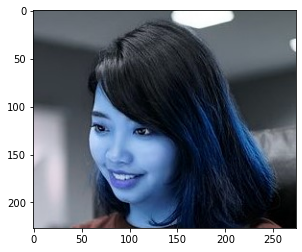

asian-4033335__480.jpg
1
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Female(96.73%)
1/1 [==============================] - 0s 23ms/step
Predicted Age: 23
1/1 [==============================] - 0s 22ms/step
Predicted Race: Asian(90.60%)



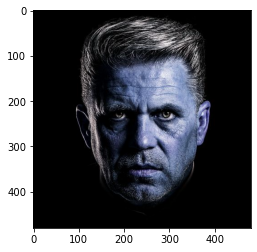

gehlert-852762__480.jpg
1
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male(99.89%)
1/1 [==============================] - 0s 21ms/step
Predicted Age: 53
1/1 [==============================] - 0s 22ms/step
Predicted Race: Black(62.73%)



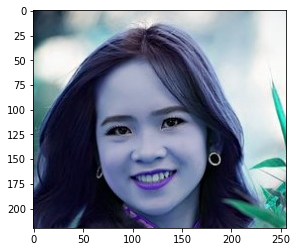

girl-1718116__480.jpg
1
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Female(99.89%)
1/1 [==============================] - 0s 24ms/step
Predicted Age: 17
1/1 [==============================] - 0s 17ms/step
Predicted Race: White(37.09%)



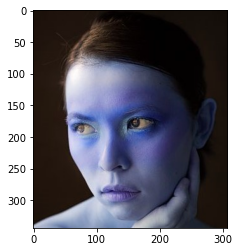

model-2498667__480.jpg
1
1/1 [==============================] - 0s 23ms/step
Predicted Gender: Female(90.90%)
1/1 [==============================] - 0s 22ms/step
Predicted Age: 27
1/1 [==============================] - 0s 16ms/step
Predicted Race: White(44.54%)



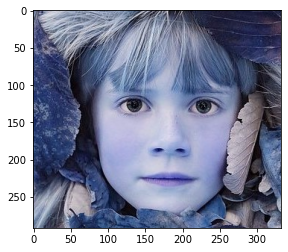

person-1041904__480.jpg
1
1/1 [==============================] - 0s 18ms/step
Predicted Gender: Female(83.38%)
1/1 [==============================] - 0s 17ms/step
Predicted Age: 5
1/1 [==============================] - 0s 25ms/step
Predicted Race: White(73.37%)



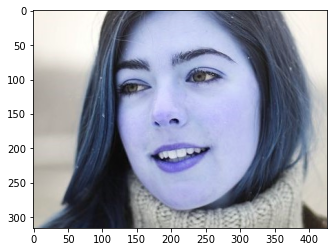

woman-1284411__480.jpg
1
1/1 [==============================] - 0s 16ms/step
Predicted Gender: Female(99.74%)
1/1 [==============================] - 0s 19ms/step
Predicted Age: 25
1/1 [==============================] - 0s 19ms/step
Predicted Race: Asian(60.94%)



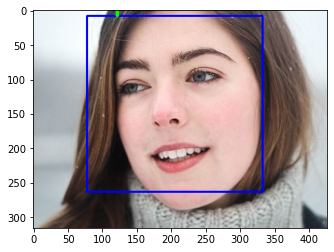

In [39]:
race_list=['White', 'Black', 'Asian', 'Indian', 'Others']
gender_list=['Male', 'Female']
test_dir='testpic/test/'
for file in os.listdir(test_dir):

    filename=test_dir+file
    X=cv2.imread(filename)
    plt.imshow(X)
    plt.show()
    print(file)

    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades +'haarcascade_frontalface_default.xml')
    gray = cv2.cvtColor(X, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, )

    i=0
    for (x,y,w,h) in faces:
        i = i+1
        cv2.rectangle(X,(x,y),(x+w,y+h),(255,0,0),2)
        X_face=gray[y:y+h,x:x+w]
        
        X_resized=cv2.resize(X_face, (32, 32), interpolation = cv2.INTER_AREA)
        X_flatten=array(X_resized).flatten()
        X_flatten_reshaped = X_flatten.reshape(32,32,1).astype('float32') 
        X_flatten_reshaped_normalized=X_flatten_reshaped/255
        print(i)
        
        gender_pred_prob=Load_gender_model.predict(X_flatten_reshaped_normalized.reshape(1,32,32,1))
        gender=str(np.round(gender_pred_prob)).replace('[','').replace(']','').replace('.','')
        gender=gender_list[int(gender)]
        if gender=='Male':
            gender_prob="%.2f"%(100-gender_pred_prob*100)
        else:
            gender_prob="%.2f"%(gender_pred_prob*100)
        print('Predicted Gender: '+gender+'('+gender_prob+'%)')
    
        age_pred_prob=Load_age_model.predict(X_flatten_reshaped_normalized.reshape(1,32,32,1))
        age=str(np.round(age_pred_prob)).replace('[','').replace(']','').replace('.','')
        print('Predicted Age: '+age)
      
        race_pred_prob=Load_race_model.predict(X_flatten_reshaped_normalized.reshape(1,32,32,1))
        race=str(np.argmax(race_pred_prob, axis=1)).replace('[','').replace(']','')
        race=race_list[int(race)]
        race_prob="%.2f"%(np.max(race_pred_prob)*100)
        print('Predicted Race: '+race+'('+race_prob+'%)')
        
        col = (0,255,0)
    
        print('')

        cv2.putText(X, str(i), (x,y),cv2.FONT_HERSHEY_SIMPLEX, 4, col, 4)
    plt.imshow(cv2.cvtColor(X, cv2.COLOR_BGR2RGB))

1
1/1 [==============================] - 0s 21ms/step
Predicted Gender: Male(83.33%)
1/1 [==============================] - 0s 19ms/step
Predicted Age: 26
1/1 [==============================] - 0s 21ms/step
Predicted Race: Indian(69.90%)

2
1/1 [==============================] - 0s 24ms/step
Predicted Gender: Female(73.27%)
1/1 [==============================] - 0s 20ms/step
Predicted Age: 33
1/1 [==============================] - 0s 22ms/step
Predicted Race: Asian(32.06%)

3
1/1 [==============================] - 0s 22ms/step
Predicted Gender: Male(97.08%)
1/1 [==============================] - 0s 19ms/step
Predicted Age: 33
1/1 [==============================] - 0s 19ms/step
Predicted Race: Black(41.91%)



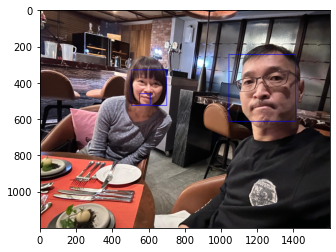

In [50]:
X=cv2.imread('testpic/8d314dd8-4061-4a77-ae90-fd88f8ff0fab.jfif')

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades +'haarcascade_frontalface_default.xml')
gray = cv2.cvtColor(X, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=4, minSize=(30, 30))

i=0
for (x,y,w,h) in faces:
    i = i+1
    cv2.rectangle(X,(x,y),(x+w,y+h),(255,0,0),2)
    X_face=gray[y:y+h,x:x+w]
        
    X_resized=cv2.resize(X_face, (32, 32), interpolation = cv2.INTER_AREA)
    X_flatten=array(X_resized).flatten()
    X_flatten_reshaped = X_flatten.reshape(32,32,1).astype('float32') 
    X_flatten_reshaped_normalized=X_flatten_reshaped/255
    print(i)
        
    gender_pred_prob=Load_gender_model.predict(X_flatten_reshaped_normalized.reshape(1,32,32,1))
    gender=str(np.round(gender_pred_prob)).replace('[','').replace(']','').replace('.','')
    gender=gender_list[int(gender)]
    if gender=='Male':
        gender_prob="%.2f"%(100-gender_pred_prob*100)
    else:
        gender_prob="%.2f"%(gender_pred_prob*100)
    print('Predicted Gender: '+gender+'('+gender_prob+'%)')
    
    age_pred_prob=Load_age_model.predict(X_flatten_reshaped_normalized.reshape(1,32,32,1))
    age=str(np.round(age_pred_prob)).replace('[','').replace(']','').replace('.','')
    print('Predicted Age: '+age)
      
    race_pred_prob=Load_race_model.predict(X_flatten_reshaped_normalized.reshape(1,32,32,1))
    race=str(np.argmax(race_pred_prob, axis=1)).replace('[','').replace(']','')
    race=race_list[int(race)]
    race_prob="%.2f"%(np.max(race_pred_prob)*100)
    print('Predicted Race: '+race+'('+race_prob+'%)')
        
    col = (0,255,0)
    
    print('')

    img=cv2.putText(X_resized, str(i), (x,y),cv2.FONT_HERSHEY_SIMPLEX, 4, col, 4)
plt.imshow(cv2.cvtColor(X, cv2.COLOR_BGR2RGB))